# benchmarking on omnipath


In [1]:
from scprint import scPrint
from scprint.tasks import GRNfer

from bengrn import BenGRN
import scanpy as sc

from bengrn.base import train_classifier

from anndata.utils import make_index_unique
from bengrn import compute_genie3
from grnndata import utils as grnutils
import numpy as np
import joblib
%load_ext autoreload
%autoreload 2 

import torch
torch.set_float32_matmul_precision('medium')

💡 connected lamindb: jkobject/scprint


/pasteur/appa/homes/jkalfon/miniconda3/envs/scprint17/lib/python3.10/site-packages/umap/__init__.py:9: ImportWarning: Tensorflow not installed; ParametricUMAP will be unavailable
  warn(


In [2]:
model = scPrint.load_from_checkpoint(
#    '../data/temp/o2uniqsx/epoch=18-step=133000.ckpt', precpt_gene_emb=None)
#    '../data/temp/vbd8bavn/epoch=19-step=100000.ckpt', precpt_gene_emb=None)
#    '../data/temp/1tghqqzx_dir/epoch=18-step=133000.ckpt', precpt_gene_emb=None)
    '/pasteur/zeus/projets/p02/ml4ig_hot/Users/jkalfon/scprint_scale/o2uniqsx/checkpoints/epoch=18-step=133000.ckpt', precpt_gene_emb=None)
NUM_GENES = 5000
MAXCELLS = 1024

[d3graph] INFO> Created a temporary directory at /local/scratch/tmp/tmpw48ygbzq


[d3graph] INFO> Writing /local/scratch/tmp/tmpw48ygbzq/_remote_module_non_scriptable.py


RuntimeError caught: scPrint is not attached to a `Trainer`.


In [3]:
CELLTYPES = [
    'kidney distal convoluted tubule epithelial cell',
    'kidney loop of Henle thick ascending limb epithelial cell',
    'kidney collecting duct principal cell',
    'mesangial cell',
    'blood vessel smooth muscle cell',
    'podocyte',
    'macrophage',
    'leukocyte',
    'kidney interstitial fibroblast',
    'endothelial cell'
]

In [4]:
#adata = sc.read_h5ad('/home/ml4ig1/scprint/.lamindb/yBCKp6HmXuHa0cZptMo7.h5ad')
adata = sc.read_h5ad('../data/yBCKp6HmXuHa0cZptMo7.h5ad')
adata.var["isTF"] = False
adata.var.loc[adata.var.symbol.isin(grnutils.TF), "isTF"] = True
adata

AnnData object with n_obs × n_vars = 15728 × 70116
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'tissue_section_uuid', 'tissue_section_thickness', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'sex_ontology_term_id', 'suspension_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'cell_culture', 'nnz', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'leiden_3', 'leide

In [5]:
#model.normalization = "log"
model.organisms = ['NCBITaxon:9606','NCBITaxon:10090']


  0%|          | 0/27 [00:00<?, ?it/s]


  4%|▎         | 1/27 [00:02<01:05,  2.52s/it]


  7%|▋         | 2/27 [00:03<00:37,  1.50s/it]


 11%|█         | 3/27 [00:04<00:28,  1.17s/it]


 15%|█▍        | 4/27 [00:04<00:23,  1.01s/it]


 19%|█▊        | 5/27 [00:05<00:20,  1.08it/s]


 22%|██▏       | 6/27 [00:06<00:18,  1.13it/s]


 26%|██▌       | 7/27 [00:07<00:17,  1.18it/s]


 30%|██▉       | 8/27 [00:07<00:15,  1.21it/s]


 33%|███▎      | 9/27 [00:08<00:14,  1.24it/s]


 37%|███▋      | 10/27 [00:09<00:13,  1.25it/s]


 41%|████      | 11/27 [00:10<00:12,  1.26it/s]


 44%|████▍     | 12/27 [00:11<00:11,  1.26it/s]


 48%|████▊     | 13/27 [00:11<00:10,  1.27it/s]


 52%|█████▏    | 14/27 [00:12<00:10,  1.29it/s]


 56%|█████▌    | 15/27 [00:13<00:09,  1.30it/s]


 59%|█████▉    | 16/27 [00:14<00:08,  1.32it/s]


 63%|██████▎   | 17/27 [00:14<00:07,  1.32it/s]


 67%|██████▋   | 18/27 [00:15<00:06,  1.32it/s]


 70%|███████   | 19/27 [00:16<00:06,  1.31it/s]


 74%|███████▍  | 20/27 [00:17<00:05,  1.31it/s]


 78%|███████▊  | 21/27 [00:17<00:04,  1.31it/s]


 81%|████████▏ | 22/27 [00:18<00:03,  1.30it/s]


 85%|████████▌ | 23/27 [00:19<00:03,  1.29it/s]


 89%|████████▉ | 24/27 [00:20<00:02,  1.29it/s]


 93%|█████████▎| 25/27 [00:21<00:01,  1.29it/s]


 96%|█████████▋| 26/27 [00:21<00:00,  1.28it/s]


100%|██████████| 27/27 [00:22<00:00,  1.38it/s]


100%|██████████| 27/27 [00:22<00:00,  1.20it/s]

avg link count: 536246649, sparsity: 1.0


base enrichment


too many genes for central computation


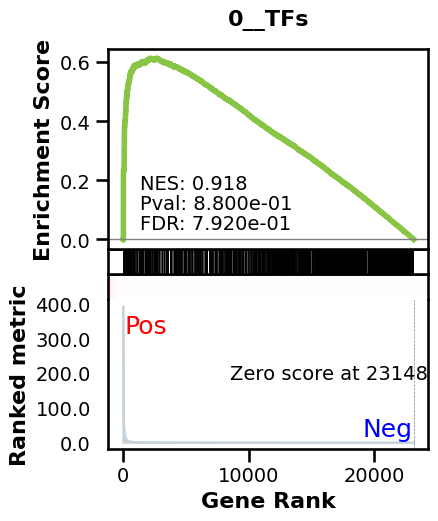

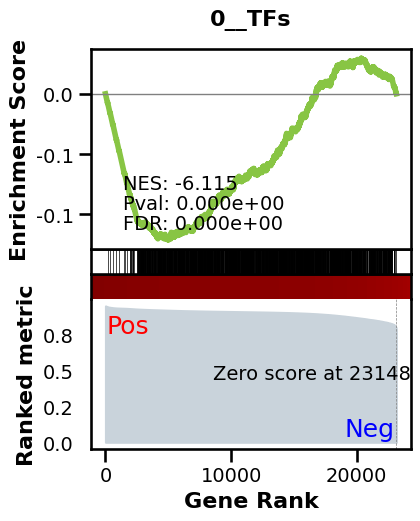

_________________________________________
TF specific enrichment


found some significant results for  62.5 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12455 genes
intersection pct: 0.5380362002678302


precision:  0.0008896322223674437 
recall:  1.0 
random precision: 0.0008897036558203398



  0%|          | 0/128 [00:00<?, ?it/s]


  1%|          | 1/128 [00:00<00:35,  3.54it/s]


  2%|▏         | 2/128 [00:00<00:31,  3.97it/s]


  2%|▏         | 3/128 [00:00<00:30,  4.13it/s]


  3%|▎         | 4/128 [00:00<00:29,  4.21it/s]


  4%|▍         | 5/128 [00:01<00:30,  3.98it/s]


  5%|▍         | 6/128 [00:01<00:29,  4.09it/s]


  5%|▌         | 7/128 [00:01<00:29,  4.17it/s]


  6%|▋         | 8/128 [00:01<00:28,  4.22it/s]


  7%|▋         | 9/128 [00:02<00:28,  4.25it/s]


  8%|▊         | 10/128 [00:02<00:27,  4.28it/s]


  9%|▊         | 11/128 [00:02<00:27,  4.29it/s]


  9%|▉         | 12/128 [00:02<00:26,  4.30it/s]


 10%|█         | 13/128 [00:03<00:26,  4.31it/s]


 11%|█         | 14/128 [00:03<00:26,  4.32it/s]


 12%|█▏        | 15/128 [00:03<00:26,  4.33it/s]


 12%|█▎        | 16/128 [00:03<00:25,  4.32it/s]


 13%|█▎        | 17/128 [00:04<00:25,  4.32it/s]


 14%|█▍        | 18/128 [00:04<00:25,  4.33it/s]


 15%|█▍        | 19/128 [00:04<00:25,  4.33it/s]


 16%|█▌        | 20/128 [00:04<00:24,  4.34it/s]


 16%|█▋        | 21/128 [00:04<00:24,  4.34it/s]


 17%|█▋        | 22/128 [00:05<00:24,  4.33it/s]


 18%|█▊        | 23/128 [00:05<00:24,  4.34it/s]


 19%|█▉        | 24/128 [00:05<00:24,  4.33it/s]


 20%|█▉        | 25/128 [00:05<00:23,  4.32it/s]


 20%|██        | 26/128 [00:06<00:23,  4.33it/s]


 21%|██        | 27/128 [00:06<00:23,  4.33it/s]


 22%|██▏       | 28/128 [00:06<00:23,  4.33it/s]


 23%|██▎       | 29/128 [00:06<00:22,  4.33it/s]


 23%|██▎       | 30/128 [00:07<00:22,  4.34it/s]


 24%|██▍       | 31/128 [00:07<00:22,  4.33it/s]


 25%|██▌       | 32/128 [00:07<00:22,  4.34it/s]


 26%|██▌       | 33/128 [00:07<00:21,  4.32it/s]


 27%|██▋       | 34/128 [00:07<00:21,  4.33it/s]


 27%|██▋       | 35/128 [00:08<00:21,  4.33it/s]


 28%|██▊       | 36/128 [00:08<00:21,  4.33it/s]


 29%|██▉       | 37/128 [00:08<00:21,  4.33it/s]


 30%|██▉       | 38/128 [00:08<00:20,  4.33it/s]


 30%|███       | 39/128 [00:09<00:20,  4.33it/s]


 31%|███▏      | 40/128 [00:09<00:20,  4.34it/s]


 32%|███▏      | 41/128 [00:09<00:20,  4.34it/s]


 33%|███▎      | 42/128 [00:09<00:19,  4.33it/s]


 34%|███▎      | 43/128 [00:10<00:19,  4.34it/s]


 34%|███▍      | 44/128 [00:10<00:19,  4.33it/s]


 35%|███▌      | 45/128 [00:10<00:19,  4.33it/s]


 36%|███▌      | 46/128 [00:10<00:18,  4.34it/s]


 37%|███▋      | 47/128 [00:10<00:18,  4.34it/s]


 38%|███▊      | 48/128 [00:11<00:18,  4.34it/s]


 38%|███▊      | 49/128 [00:11<00:18,  4.34it/s]


 39%|███▉      | 50/128 [00:11<00:18,  4.33it/s]


 40%|███▉      | 51/128 [00:11<00:17,  4.34it/s]


 41%|████      | 52/128 [00:12<00:17,  4.34it/s]


 41%|████▏     | 53/128 [00:12<00:17,  4.34it/s]


 42%|████▏     | 54/128 [00:12<00:17,  4.35it/s]


 43%|████▎     | 55/128 [00:12<00:16,  4.35it/s]


 44%|████▍     | 56/128 [00:13<00:16,  4.35it/s]


 45%|████▍     | 57/128 [00:13<00:16,  4.34it/s]


 45%|████▌     | 58/128 [00:13<00:16,  4.35it/s]


 46%|████▌     | 59/128 [00:13<00:15,  4.36it/s]


 47%|████▋     | 60/128 [00:13<00:15,  4.36it/s]


 48%|████▊     | 61/128 [00:14<00:15,  4.36it/s]


 48%|████▊     | 62/128 [00:14<00:15,  4.34it/s]


 49%|████▉     | 63/128 [00:14<00:14,  4.34it/s]


 50%|█████     | 64/128 [00:14<00:14,  4.34it/s]


 51%|█████     | 65/128 [00:15<00:14,  4.34it/s]


 52%|█████▏    | 66/128 [00:15<00:14,  4.34it/s]


 52%|█████▏    | 67/128 [00:15<00:14,  4.34it/s]


 53%|█████▎    | 68/128 [00:15<00:13,  4.34it/s]


 54%|█████▍    | 69/128 [00:16<00:13,  4.34it/s]


 55%|█████▍    | 70/128 [00:16<00:13,  4.34it/s]


 55%|█████▌    | 71/128 [00:16<00:13,  4.33it/s]


 56%|█████▋    | 72/128 [00:16<00:12,  4.34it/s]


 57%|█████▋    | 73/128 [00:16<00:12,  4.34it/s]


 58%|█████▊    | 74/128 [00:17<00:12,  4.35it/s]


 59%|█████▊    | 75/128 [00:17<00:12,  4.34it/s]


 59%|█████▉    | 76/128 [00:17<00:11,  4.34it/s]


 60%|██████    | 77/128 [00:17<00:11,  4.34it/s]


 61%|██████    | 78/128 [00:18<00:11,  4.34it/s]


 62%|██████▏   | 79/128 [00:18<00:11,  4.34it/s]


 62%|██████▎   | 80/128 [00:18<00:11,  4.34it/s]


 63%|██████▎   | 81/128 [00:18<00:10,  4.34it/s]


 64%|██████▍   | 82/128 [00:19<00:10,  4.29it/s]


 65%|██████▍   | 83/128 [00:19<00:10,  4.30it/s]


 66%|██████▌   | 84/128 [00:19<00:10,  4.32it/s]


 66%|██████▋   | 85/128 [00:19<00:09,  4.32it/s]


 67%|██████▋   | 86/128 [00:19<00:09,  4.33it/s]


 68%|██████▊   | 87/128 [00:20<00:09,  4.33it/s]


 69%|██████▉   | 88/128 [00:20<00:09,  4.32it/s]


 70%|██████▉   | 89/128 [00:20<00:09,  4.33it/s]


 70%|███████   | 90/128 [00:20<00:08,  4.33it/s]


 71%|███████   | 91/128 [00:21<00:08,  4.33it/s]


 72%|███████▏  | 92/128 [00:21<00:08,  4.34it/s]


 73%|███████▎  | 93/128 [00:21<00:08,  4.34it/s]


 73%|███████▎  | 94/128 [00:21<00:07,  4.34it/s]


 74%|███████▍  | 95/128 [00:22<00:07,  4.34it/s]


 75%|███████▌  | 96/128 [00:22<00:07,  4.35it/s]


 76%|███████▌  | 97/128 [00:22<00:07,  4.33it/s]


 77%|███████▋  | 98/128 [00:22<00:06,  4.34it/s]


 77%|███████▋  | 99/128 [00:22<00:06,  4.34it/s]


 78%|███████▊  | 100/128 [00:23<00:06,  4.34it/s]


 79%|███████▉  | 101/128 [00:23<00:06,  4.35it/s]


 80%|███████▉  | 102/128 [00:23<00:05,  4.35it/s]


 80%|████████  | 103/128 [00:23<00:05,  4.35it/s]


 81%|████████▏ | 104/128 [00:24<00:05,  4.35it/s]


 82%|████████▏ | 105/128 [00:24<00:05,  4.35it/s]


 83%|████████▎ | 106/128 [00:24<00:05,  4.34it/s]


 84%|████████▎ | 107/128 [00:24<00:04,  4.35it/s]


 84%|████████▍ | 108/128 [00:24<00:04,  4.35it/s]


 85%|████████▌ | 109/128 [00:25<00:04,  4.35it/s]


 86%|████████▌ | 110/128 [00:25<00:04,  4.35it/s]


 87%|████████▋ | 111/128 [00:25<00:03,  4.35it/s]


 88%|████████▊ | 112/128 [00:25<00:03,  4.35it/s]


 88%|████████▊ | 113/128 [00:26<00:03,  4.35it/s]


 89%|████████▉ | 114/128 [00:26<00:03,  4.34it/s]


 90%|████████▉ | 115/128 [00:26<00:02,  4.34it/s]


 91%|█████████ | 116/128 [00:26<00:02,  4.34it/s]


 91%|█████████▏| 117/128 [00:27<00:02,  4.35it/s]


 92%|█████████▏| 118/128 [00:27<00:02,  4.35it/s]


 93%|█████████▎| 119/128 [00:27<00:02,  4.35it/s]


 94%|█████████▍| 120/128 [00:27<00:01,  4.35it/s]


 95%|█████████▍| 121/128 [00:27<00:01,  4.35it/s]


 95%|█████████▌| 122/128 [00:28<00:01,  4.34it/s]


 96%|█████████▌| 123/128 [00:28<00:01,  4.35it/s]


 97%|█████████▋| 124/128 [00:28<00:00,  4.35it/s]


 98%|█████████▊| 125/128 [00:28<00:00,  4.34it/s]


 98%|█████████▊| 126/128 [00:29<00:00,  4.34it/s]


 99%|█████████▉| 127/128 [00:29<00:00,  4.34it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()



100%|██████████| 128/128 [00:29<00:00,  4.31it/s]


100%|██████████| 128/128 [00:29<00:00,  4.32it/s]

Average Precision (AP):  0.001011442546500521
Area Under Precision-Recall Curve (AUPRC):  0.0010112919661082434


EPR: 1.794288323583073


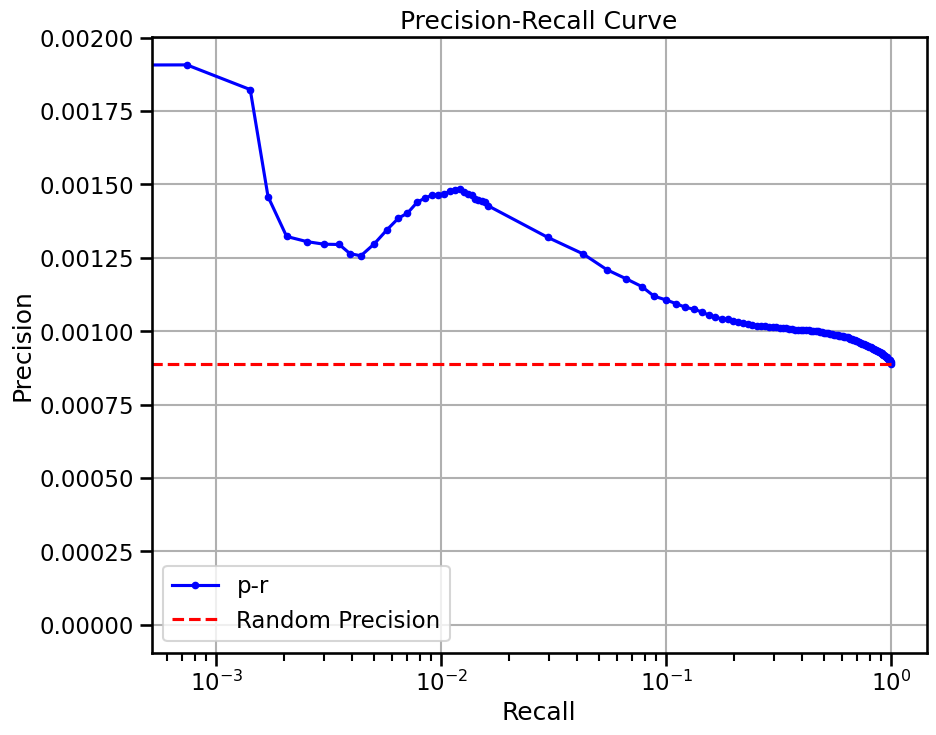


  0%|          | 0/54 [00:00<?, ?it/s]


  2%|▏         | 1/54 [00:02<02:22,  2.70s/it]


  4%|▎         | 2/54 [00:04<01:39,  1.91s/it]


  6%|▌         | 3/54 [00:05<01:24,  1.66s/it]


  7%|▋         | 4/54 [00:06<01:17,  1.54s/it]


  9%|▉         | 5/54 [00:08<01:12,  1.47s/it]


 11%|█         | 6/54 [00:09<01:09,  1.44s/it]


 13%|█▎        | 7/54 [00:10<01:06,  1.42s/it]


 15%|█▍        | 8/54 [00:12<01:04,  1.40s/it]


 17%|█▋        | 9/54 [00:13<01:02,  1.39s/it]


 19%|█▊        | 10/54 [00:14<01:00,  1.38s/it]


 20%|██        | 11/54 [00:16<00:59,  1.38s/it]


 22%|██▏       | 12/54 [00:17<00:56,  1.35s/it]


 24%|██▍       | 13/54 [00:18<00:54,  1.32s/it]


 26%|██▌       | 14/54 [00:20<00:51,  1.30s/it]


 28%|██▊       | 15/54 [00:21<00:50,  1.28s/it]


 30%|██▉       | 16/54 [00:22<00:48,  1.27s/it]


 31%|███▏      | 17/54 [00:23<00:46,  1.27s/it]


 33%|███▎      | 18/54 [00:25<00:45,  1.26s/it]


 35%|███▌      | 19/54 [00:26<00:44,  1.26s/it]


 37%|███▋      | 20/54 [00:27<00:42,  1.26s/it]


 39%|███▉      | 21/54 [00:28<00:41,  1.26s/it]


 41%|████      | 22/54 [00:30<00:40,  1.26s/it]


 43%|████▎     | 23/54 [00:31<00:38,  1.26s/it]


 44%|████▍     | 24/54 [00:32<00:37,  1.25s/it]


 46%|████▋     | 25/54 [00:33<00:36,  1.26s/it]


 48%|████▊     | 26/54 [00:35<00:35,  1.25s/it]


 50%|█████     | 27/54 [00:36<00:33,  1.26s/it]


 52%|█████▏    | 28/54 [00:37<00:32,  1.25s/it]


 54%|█████▎    | 29/54 [00:38<00:31,  1.26s/it]


 56%|█████▌    | 30/54 [00:40<00:30,  1.25s/it]


 57%|█████▋    | 31/54 [00:41<00:28,  1.26s/it]


 59%|█████▉    | 32/54 [00:42<00:27,  1.26s/it]


 61%|██████    | 33/54 [00:43<00:26,  1.25s/it]


 63%|██████▎   | 34/54 [00:45<00:25,  1.26s/it]


 65%|██████▍   | 35/54 [00:46<00:23,  1.26s/it]


 67%|██████▋   | 36/54 [00:47<00:22,  1.26s/it]


 69%|██████▊   | 37/54 [00:48<00:21,  1.26s/it]


 70%|███████   | 38/54 [00:50<00:20,  1.26s/it]


 72%|███████▏  | 39/54 [00:51<00:18,  1.26s/it]


 74%|███████▍  | 40/54 [00:52<00:17,  1.26s/it]


 76%|███████▌  | 41/54 [00:54<00:16,  1.26s/it]


 78%|███████▊  | 42/54 [00:55<00:15,  1.26s/it]


 80%|███████▉  | 43/54 [00:56<00:13,  1.26s/it]


 81%|████████▏ | 44/54 [00:57<00:12,  1.25s/it]


 83%|████████▎ | 45/54 [00:59<00:11,  1.25s/it]


 85%|████████▌ | 46/54 [01:00<00:10,  1.26s/it]


 87%|████████▋ | 47/54 [01:01<00:08,  1.25s/it]


 89%|████████▉ | 48/54 [01:02<00:07,  1.25s/it]


 91%|█████████ | 49/54 [01:04<00:06,  1.25s/it]


 93%|█████████▎| 50/54 [01:05<00:05,  1.25s/it]


 94%|█████████▍| 51/54 [01:06<00:03,  1.25s/it]


 96%|█████████▋| 52/54 [01:07<00:02,  1.26s/it]


 98%|█████████▊| 53/54 [01:09<00:01,  1.26s/it]


100%|██████████| 54/54 [01:09<00:00,  1.07s/it]


100%|██████████| 54/54 [01:09<00:00,  1.29s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


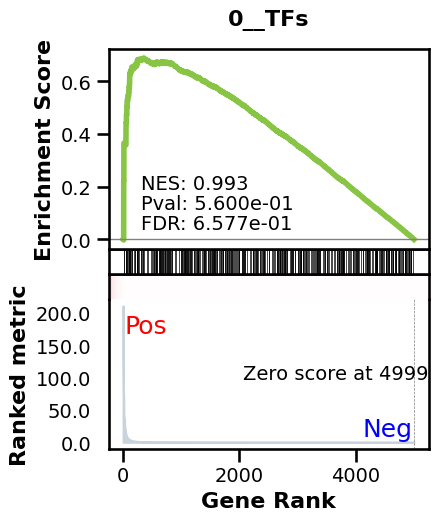

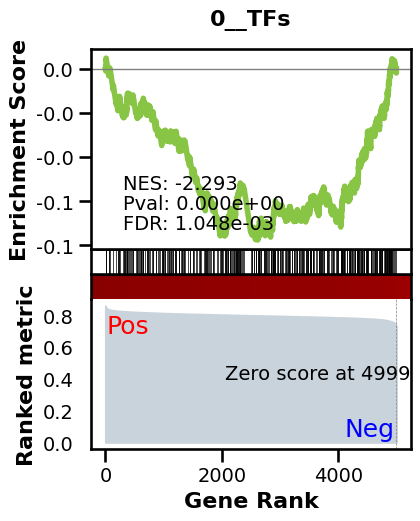

_________________________________________
TF specific enrichment


found some significant results for  11.764705882352942 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3484 genes
intersection pct: 0.6968
precision:  0.0008261483363013599 
recall:  1.0 
random precision: 0.0008263855307705822



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 59.09it/s]


  9%|▉         | 12/128 [00:00<00:01, 58.95it/s]


 14%|█▍        | 18/128 [00:00<00:01, 58.86it/s]


 19%|█▉        | 24/128 [00:00<00:01, 58.90it/s]


 23%|██▎       | 30/128 [00:00<00:01, 58.85it/s]


 28%|██▊       | 36/128 [00:00<00:01, 58.78it/s]


 33%|███▎      | 42/128 [00:00<00:01, 58.73it/s]


 38%|███▊      | 48/128 [00:00<00:01, 58.71it/s]


 42%|████▏     | 54/128 [00:00<00:01, 58.72it/s]


 47%|████▋     | 60/128 [00:01<00:01, 58.74it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 58.72it/s]


 56%|█████▋    | 72/128 [00:01<00:00, 58.38it/s]


 61%|██████    | 78/128 [00:01<00:00, 58.43it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 58.48it/s]


 70%|███████   | 90/128 [00:01<00:00, 58.50it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 58.51it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 58.12it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 58.17it/s]


 89%|████████▉ | 114/128 [00:01<00:00, 58.27it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 58.38it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 58.43it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 58.52it/s]

Average Precision (AP):  0.0008785194847128491
Area Under Precision-Recall Curve (AUPRC):  0.000876341582078115
EPR: 2.6620469453287052


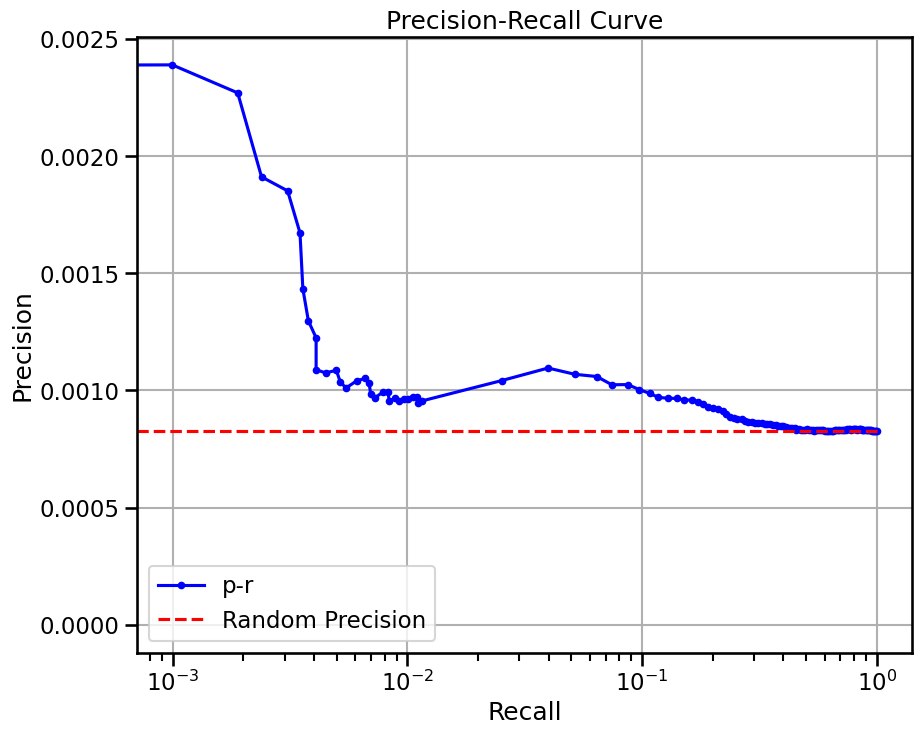

base enrichment


Top central genes: []


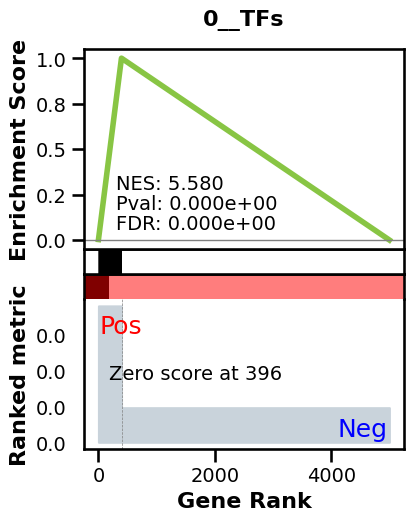

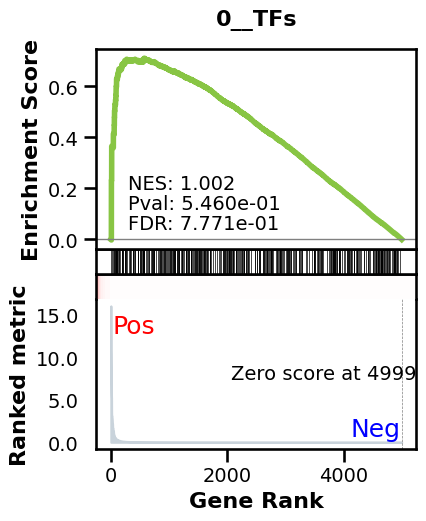

_________________________________________
TF specific enrichment


found some significant results for  17.647058823529413 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3484 genes
intersection pct: 0.6968
precision:  0.0030067336747127975 
recall:  0.3405464698843239 
random precision: 0.0008263855307705822



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 57.63it/s]


  9%|▉         | 12/128 [00:00<00:02, 57.64it/s]


 14%|█▍        | 18/128 [00:00<00:01, 57.63it/s]


 19%|█▉        | 24/128 [00:00<00:01, 57.65it/s]


 23%|██▎       | 30/128 [00:00<00:01, 57.69it/s]


 28%|██▊       | 36/128 [00:00<00:01, 57.66it/s]


 33%|███▎      | 42/128 [00:00<00:01, 57.66it/s]


 38%|███▊      | 48/128 [00:00<00:01, 57.65it/s]


 42%|████▏     | 54/128 [00:00<00:01, 57.72it/s]


 47%|████▋     | 60/128 [00:01<00:01, 57.73it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 57.71it/s]


 56%|█████▋    | 72/128 [00:01<00:00, 57.68it/s]


 61%|██████    | 78/128 [00:01<00:00, 57.68it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 57.72it/s]


 70%|███████   | 90/128 [00:01<00:00, 57.76it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 57.72it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 57.69it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 57.71it/s]


 89%|████████▉ | 114/128 [00:01<00:00, 57.66it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 57.65it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 57.67it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 57.65it/s]

Average Precision (AP):  0.0019620161447192167
Area Under Precision-Recall Curve (AUPRC):  0.0016630239581753494
EPR: 4.246105316851987


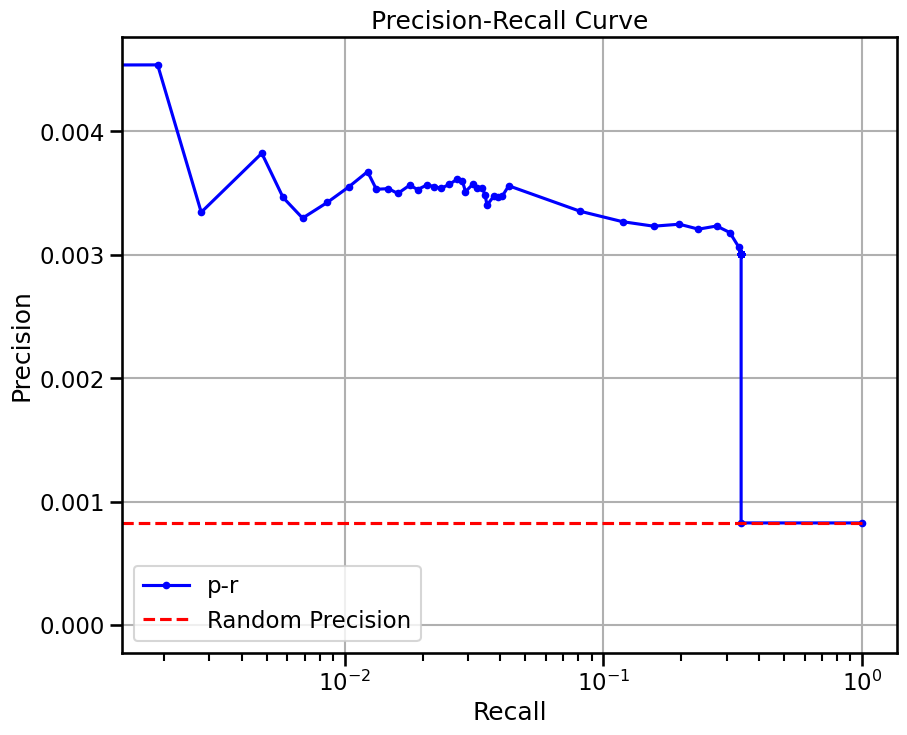

true elem 10028 ...


doing classification....


metrics {'used_heads': 3, 'precision': 0.0008314620117426245, 'random_precision': 0.0008314620117426245, 'recall': 1.0, 'predicted_true': 4855303.0, 'number_of_true': 4037.0}


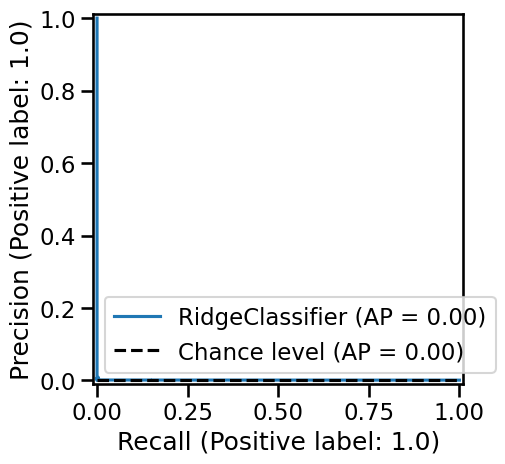

base enrichment


Top central genes: []
The DataFrame contains only the same values.


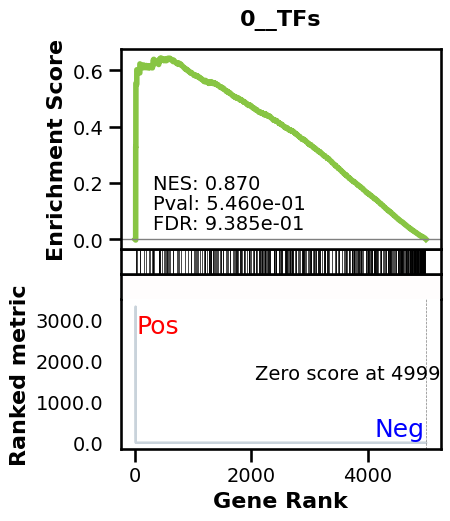

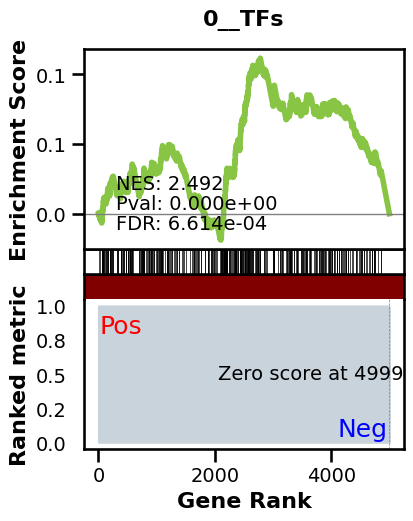

_________________________________________
TF specific enrichment


found some significant results for  2.9411764705882355 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3484 genes
intersection pct: 0.6968
precision:  0.0008261483363013599 
recall:  1.0 
random precision: 0.0008263855307705822



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 57.35it/s]


  9%|▉         | 12/128 [00:00<00:02, 57.99it/s]


 14%|█▍        | 18/128 [00:00<00:01, 56.70it/s]


 19%|█▉        | 24/128 [00:00<00:01, 57.01it/s]


 23%|██▎       | 30/128 [00:00<00:01, 57.84it/s]


 28%|██▊       | 36/128 [00:00<00:01, 58.13it/s]


 33%|███▎      | 42/128 [00:00<00:01, 58.64it/s]


 38%|███▊      | 48/128 [00:00<00:01, 58.20it/s]


 42%|████▏     | 54/128 [00:00<00:01, 57.83it/s]


 47%|████▋     | 60/128 [00:01<00:01, 57.34it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 57.33it/s]


 56%|█████▋    | 72/128 [00:01<00:00, 58.02it/s]


 61%|██████    | 78/128 [00:01<00:00, 58.36it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 58.77it/s]


 70%|███████   | 90/128 [00:01<00:00, 58.30it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 58.01it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 57.60it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 57.22it/s]


 89%|████████▉ | 114/128 [00:01<00:00, 57.95it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 58.34it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 58.80it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 58.03it/s]

Average Precision (AP):  0.001001631669014589
Area Under Precision-Recall Curve (AUPRC):  0.0009939949376875782
EPR: 4.979989927628857


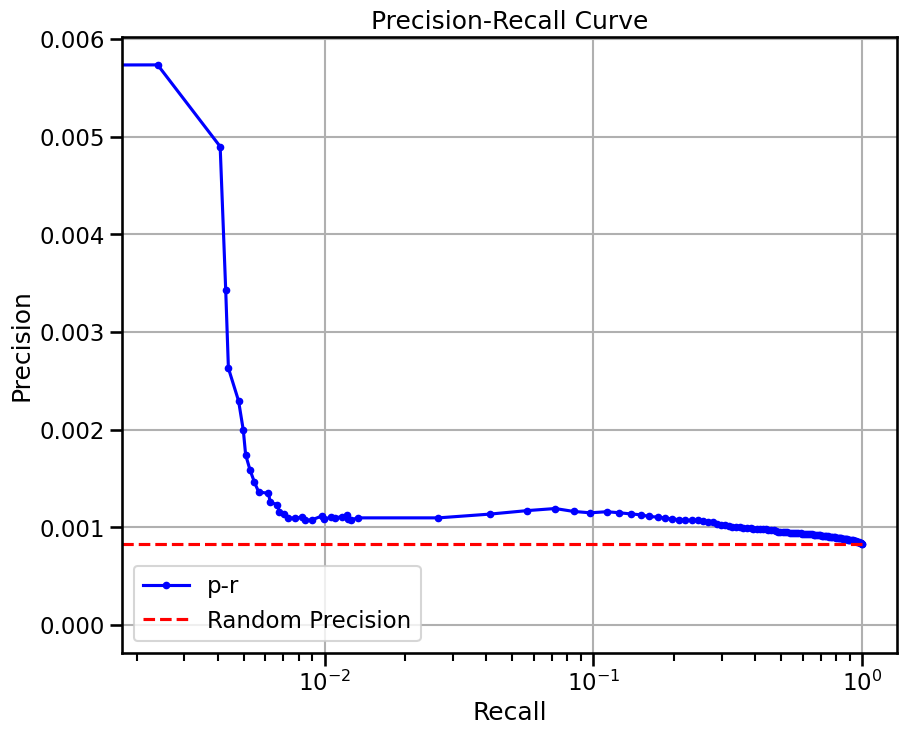

base enrichment


Top central genes: []


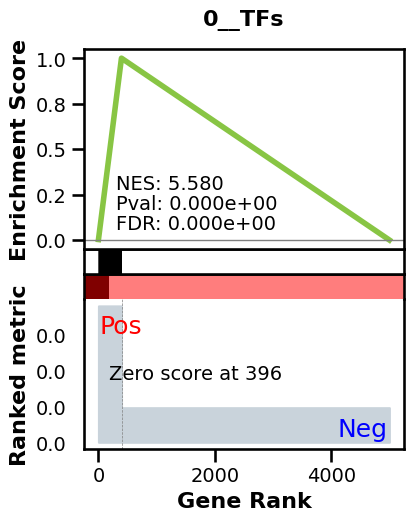

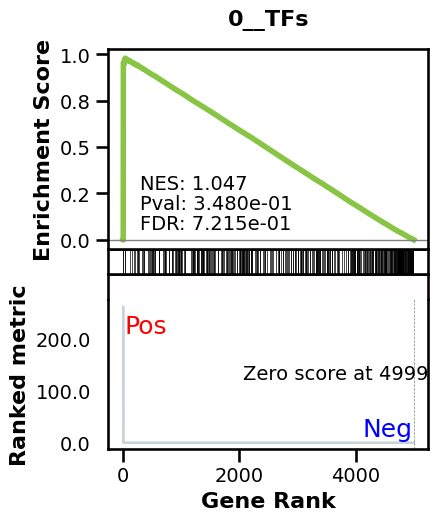

_________________________________________
TF specific enrichment


found some significant results for  8.823529411764707 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3484 genes
intersection pct: 0.6968
precision:  0.0030067336747127975 
recall:  0.3405464698843239 
random precision: 0.0008263855307705822



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 59.51it/s]


  9%|▉         | 12/128 [00:00<00:01, 59.52it/s]


 14%|█▍        | 18/128 [00:00<00:01, 58.42it/s]


 19%|█▉        | 24/128 [00:00<00:01, 58.41it/s]


 23%|██▎       | 30/128 [00:00<00:01, 57.83it/s]


 28%|██▊       | 36/128 [00:00<00:01, 57.68it/s]


 33%|███▎      | 42/128 [00:00<00:01, 58.29it/s]


 38%|███▊      | 48/128 [00:00<00:01, 58.74it/s]


 42%|████▏     | 54/128 [00:00<00:01, 58.99it/s]


 47%|████▋     | 60/128 [00:01<00:01, 58.51it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 58.48it/s]


 56%|█████▋    | 72/128 [00:01<00:00, 58.06it/s]


 61%|██████    | 78/128 [00:01<00:00, 57.82it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 58.34it/s]


 70%|███████   | 90/128 [00:01<00:00, 58.67it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 58.89it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 58.38it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 58.25it/s]


 89%|████████▉ | 114/128 [00:01<00:00, 57.72it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 57.65it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 58.23it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 58.31it/s]

Average Precision (AP):  0.0025784741889535168
Area Under Precision-Recall Curve (AUPRC):  0.002226923771398881
EPR: 12.416585640502555


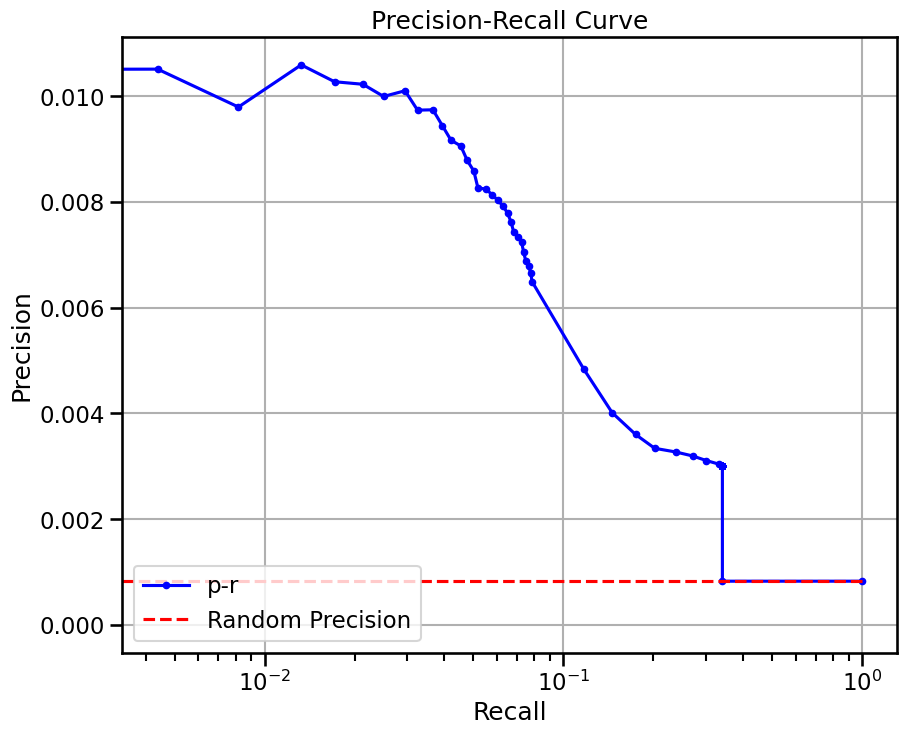


  0%|          | 0/9 [00:00<?, ?it/s]


 11%|█         | 1/9 [00:02<00:16,  2.09s/it]


 22%|██▏       | 2/9 [00:02<00:09,  1.32s/it]


 33%|███▎      | 3/9 [00:03<00:06,  1.07s/it]


 44%|████▍     | 4/9 [00:04<00:04,  1.04it/s]


 56%|█████▌    | 5/9 [00:05<00:03,  1.11it/s]


 67%|██████▋   | 6/9 [00:05<00:02,  1.17it/s]


 78%|███████▊  | 7/9 [00:06<00:01,  1.21it/s]


 89%|████████▉ | 8/9 [00:07<00:00,  1.23it/s]


100%|██████████| 9/9 [00:07<00:00,  1.68it/s]


100%|██████████| 9/9 [00:07<00:00,  1.15it/s]

avg link count: 536246649, sparsity: 1.0


base enrichment


too many genes for central computation


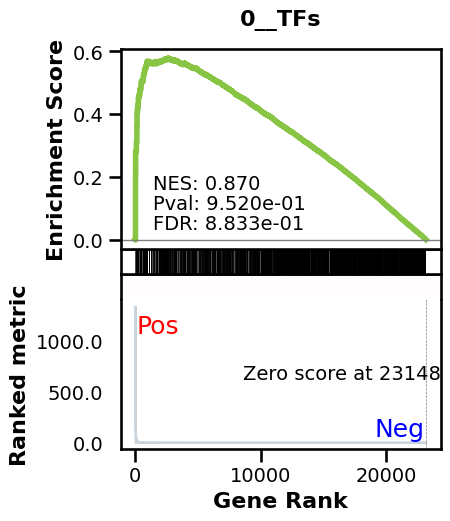

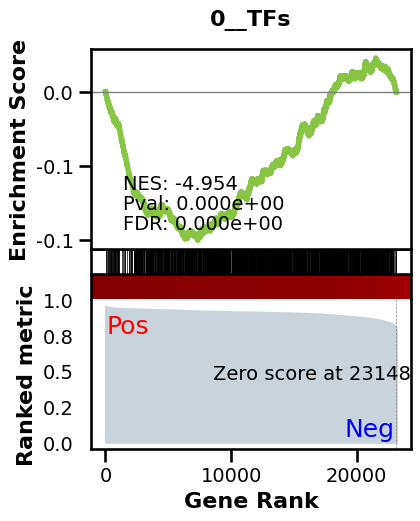

_________________________________________
TF specific enrichment


found some significant results for  67.85714285714286 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12455 genes
intersection pct: 0.5380362002678302


precision:  0.0008896322223674437 
recall:  1.0 
random precision: 0.0008897036558203398



  0%|          | 0/128 [00:00<?, ?it/s]


  1%|          | 1/128 [00:00<00:38,  3.32it/s]


  2%|▏         | 2/128 [00:00<00:37,  3.35it/s]


  2%|▏         | 3/128 [00:00<00:37,  3.37it/s]


  3%|▎         | 4/128 [00:01<00:36,  3.37it/s]


  4%|▍         | 5/128 [00:01<00:36,  3.38it/s]


  5%|▍         | 6/128 [00:01<00:36,  3.38it/s]


  5%|▌         | 7/128 [00:02<00:35,  3.38it/s]


  6%|▋         | 8/128 [00:02<00:35,  3.39it/s]


  7%|▋         | 9/128 [00:02<00:35,  3.39it/s]


  8%|▊         | 10/128 [00:02<00:34,  3.39it/s]


  9%|▊         | 11/128 [00:03<00:34,  3.39it/s]


  9%|▉         | 12/128 [00:03<00:34,  3.39it/s]


 10%|█         | 13/128 [00:03<00:33,  3.39it/s]


 11%|█         | 14/128 [00:04<00:33,  3.39it/s]


 12%|█▏        | 15/128 [00:04<00:33,  3.38it/s]


 12%|█▎        | 16/128 [00:04<00:33,  3.39it/s]


 13%|█▎        | 17/128 [00:05<00:32,  3.38it/s]


 14%|█▍        | 18/128 [00:05<00:32,  3.38it/s]


 15%|█▍        | 19/128 [00:05<00:32,  3.39it/s]


 16%|█▌        | 20/128 [00:05<00:31,  3.39it/s]


 16%|█▋        | 21/128 [00:06<00:31,  3.39it/s]


 17%|█▋        | 22/128 [00:06<00:31,  3.39it/s]


 18%|█▊        | 23/128 [00:06<00:31,  3.39it/s]


 19%|█▉        | 24/128 [00:07<00:30,  3.39it/s]


 20%|█▉        | 25/128 [00:07<00:30,  3.39it/s]


 20%|██        | 26/128 [00:07<00:30,  3.39it/s]


 21%|██        | 27/128 [00:07<00:29,  3.39it/s]


 22%|██▏       | 28/128 [00:08<00:29,  3.38it/s]


 23%|██▎       | 29/128 [00:08<00:29,  3.39it/s]


 23%|██▎       | 30/128 [00:08<00:28,  3.40it/s]


 24%|██▍       | 31/128 [00:09<00:28,  3.43it/s]


 25%|██▌       | 32/128 [00:09<00:27,  3.45it/s]


 26%|██▌       | 33/128 [00:09<00:27,  3.47it/s]


 27%|██▋       | 34/128 [00:10<00:27,  3.47it/s]


 27%|██▋       | 35/128 [00:10<00:26,  3.48it/s]


 28%|██▊       | 36/128 [00:10<00:26,  3.49it/s]


 29%|██▉       | 37/128 [00:10<00:26,  3.49it/s]


 30%|██▉       | 38/128 [00:11<00:25,  3.49it/s]


 30%|███       | 39/128 [00:11<00:25,  3.50it/s]


 31%|███▏      | 40/128 [00:11<00:25,  3.50it/s]


 32%|███▏      | 41/128 [00:12<00:24,  3.49it/s]


 33%|███▎      | 42/128 [00:12<00:24,  3.49it/s]


 34%|███▎      | 43/128 [00:12<00:24,  3.48it/s]


 34%|███▍      | 44/128 [00:12<00:24,  3.48it/s]


 35%|███▌      | 45/128 [00:13<00:23,  3.48it/s]


 36%|███▌      | 46/128 [00:13<00:23,  3.48it/s]


 37%|███▋      | 47/128 [00:13<00:23,  3.48it/s]


 38%|███▊      | 48/128 [00:14<00:22,  3.48it/s]


 38%|███▊      | 49/128 [00:14<00:22,  3.48it/s]


 39%|███▉      | 50/128 [00:14<00:22,  3.48it/s]


 40%|███▉      | 51/128 [00:14<00:22,  3.50it/s]


 41%|████      | 52/128 [00:15<00:21,  3.50it/s]


 41%|████▏     | 53/128 [00:15<00:21,  3.50it/s]


 42%|████▏     | 54/128 [00:15<00:21,  3.50it/s]


 43%|████▎     | 55/128 [00:16<00:20,  3.48it/s]


 44%|████▍     | 56/128 [00:16<00:20,  3.47it/s]


 45%|████▍     | 57/128 [00:16<00:20,  3.46it/s]


 45%|████▌     | 58/128 [00:16<00:20,  3.45it/s]


 46%|████▌     | 59/128 [00:17<00:20,  3.44it/s]


 47%|████▋     | 60/128 [00:17<00:19,  3.44it/s]


 48%|████▊     | 61/128 [00:17<00:19,  3.44it/s]


 48%|████▊     | 62/128 [00:18<00:19,  3.44it/s]


 49%|████▉     | 63/128 [00:18<00:18,  3.44it/s]


 50%|█████     | 64/128 [00:18<00:18,  3.41it/s]


 51%|█████     | 65/128 [00:18<00:17,  3.50it/s]


 52%|█████▏    | 66/128 [00:19<00:17,  3.60it/s]


 52%|█████▏    | 67/128 [00:19<00:17,  3.55it/s]


 53%|█████▎    | 68/128 [00:19<00:16,  3.71it/s]


 54%|█████▍    | 69/128 [00:19<00:15,  3.82it/s]


 55%|█████▍    | 70/128 [00:20<00:15,  3.83it/s]


 55%|█████▌    | 71/128 [00:20<00:14,  3.98it/s]


 56%|█████▋    | 72/128 [00:20<00:13,  4.08it/s]


 57%|█████▋    | 73/128 [00:20<00:13,  4.16it/s]


 58%|█████▊    | 74/128 [00:21<00:12,  4.23it/s]


 59%|█████▊    | 75/128 [00:21<00:12,  4.25it/s]


 59%|█████▉    | 76/128 [00:21<00:12,  4.29it/s]


 60%|██████    | 77/128 [00:21<00:11,  4.31it/s]


 61%|██████    | 78/128 [00:22<00:11,  4.33it/s]


 62%|██████▏   | 79/128 [00:22<00:11,  4.35it/s]


 62%|██████▎   | 80/128 [00:22<00:11,  4.36it/s]


 63%|██████▎   | 81/128 [00:22<00:10,  4.37it/s]


 64%|██████▍   | 82/128 [00:22<00:10,  4.38it/s]


 65%|██████▍   | 83/128 [00:23<00:10,  4.38it/s]


 66%|██████▌   | 84/128 [00:23<00:10,  4.39it/s]


 66%|██████▋   | 85/128 [00:23<00:09,  4.39it/s]


 67%|██████▋   | 86/128 [00:23<00:09,  4.38it/s]


 68%|██████▊   | 87/128 [00:24<00:09,  4.39it/s]


 69%|██████▉   | 88/128 [00:24<00:09,  4.39it/s]


 70%|██████▉   | 89/128 [00:24<00:08,  4.38it/s]


 70%|███████   | 90/128 [00:24<00:08,  4.38it/s]


 71%|███████   | 91/128 [00:25<00:08,  4.38it/s]


 72%|███████▏  | 92/128 [00:25<00:08,  4.38it/s]


 73%|███████▎  | 93/128 [00:25<00:07,  4.38it/s]


 73%|███████▎  | 94/128 [00:25<00:07,  4.38it/s]


 74%|███████▍  | 95/128 [00:25<00:07,  4.38it/s]


 75%|███████▌  | 96/128 [00:26<00:07,  4.38it/s]


 76%|███████▌  | 97/128 [00:26<00:07,  4.38it/s]


 77%|███████▋  | 98/128 [00:26<00:06,  4.38it/s]


 77%|███████▋  | 99/128 [00:26<00:06,  4.39it/s]


 78%|███████▊  | 100/128 [00:27<00:06,  4.38it/s]


 79%|███████▉  | 101/128 [00:27<00:06,  4.38it/s]


 80%|███████▉  | 102/128 [00:27<00:05,  4.38it/s]


 80%|████████  | 103/128 [00:27<00:05,  4.39it/s]


 81%|████████▏ | 104/128 [00:27<00:05,  4.39it/s]


 82%|████████▏ | 105/128 [00:28<00:05,  4.39it/s]


 83%|████████▎ | 106/128 [00:28<00:05,  4.39it/s]


 84%|████████▎ | 107/128 [00:28<00:04,  4.40it/s]


 84%|████████▍ | 108/128 [00:28<00:04,  4.39it/s]


 85%|████████▌ | 109/128 [00:29<00:04,  4.40it/s]


 86%|████████▌ | 110/128 [00:29<00:04,  4.40it/s]


 87%|████████▋ | 111/128 [00:29<00:03,  4.40it/s]


 88%|████████▊ | 112/128 [00:29<00:03,  4.41it/s]


 88%|████████▊ | 113/128 [00:30<00:03,  4.41it/s]


 89%|████████▉ | 114/128 [00:30<00:03,  4.41it/s]


 90%|████████▉ | 115/128 [00:30<00:02,  4.41it/s]


 91%|█████████ | 116/128 [00:30<00:02,  4.41it/s]


 91%|█████████▏| 117/128 [00:30<00:02,  4.41it/s]


 92%|█████████▏| 118/128 [00:31<00:02,  4.41it/s]


 93%|█████████▎| 119/128 [00:31<00:02,  4.41it/s]


 94%|█████████▍| 120/128 [00:31<00:01,  4.42it/s]


 95%|█████████▍| 121/128 [00:31<00:01,  4.41it/s]


 95%|█████████▌| 122/128 [00:32<00:01,  4.42it/s]


 96%|█████████▌| 123/128 [00:32<00:01,  4.42it/s]


 97%|█████████▋| 124/128 [00:32<00:00,  4.42it/s]


 98%|█████████▊| 125/128 [00:32<00:00,  4.41it/s]


 98%|█████████▊| 126/128 [00:32<00:00,  4.41it/s]


 99%|█████████▉| 127/128 [00:33<00:00,  4.39it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()



100%|██████████| 128/128 [00:33<00:00,  4.38it/s]


100%|██████████| 128/128 [00:33<00:00,  3.83it/s]

Average Precision (AP):  0.0010233264582666256
Area Under Precision-Recall Curve (AUPRC):  0.0010230387694008282


EPR: 1.7288406236830192


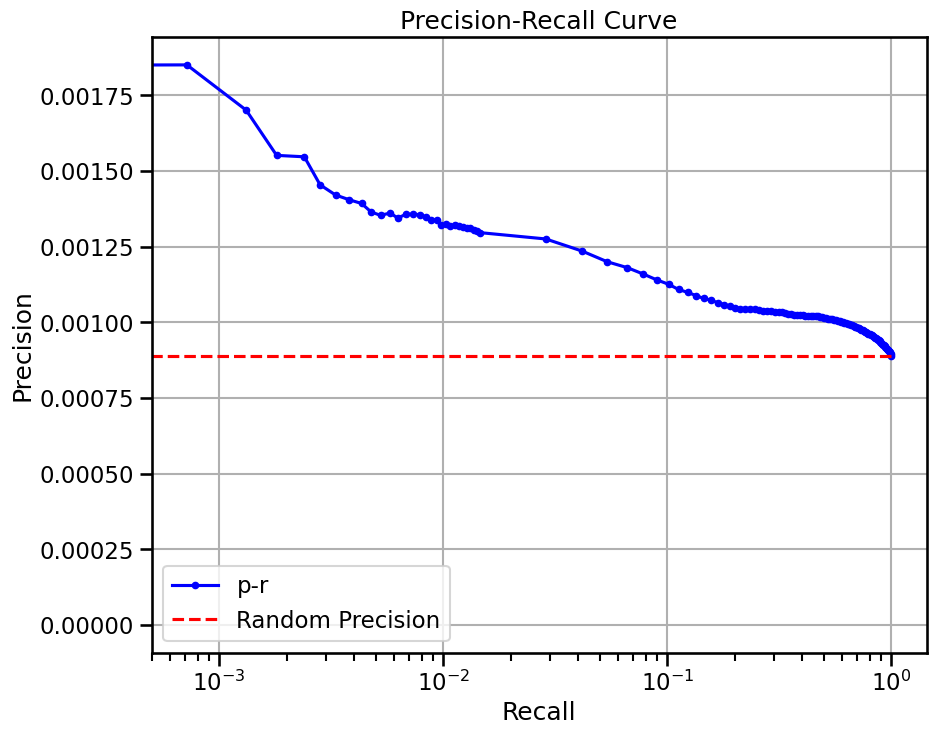


  0%|          | 0/17 [00:00<?, ?it/s]


  6%|▌         | 1/17 [00:02<00:46,  2.89s/it]


 12%|█▏        | 2/17 [00:04<00:29,  1.96s/it]


 18%|█▊        | 3/17 [00:05<00:23,  1.65s/it]


 24%|██▎       | 4/17 [00:06<00:19,  1.51s/it]


 29%|██▉       | 5/17 [00:08<00:17,  1.43s/it]


 35%|███▌      | 6/17 [00:09<00:15,  1.40s/it]


 41%|████      | 7/17 [00:10<00:13,  1.36s/it]


 47%|████▋     | 8/17 [00:11<00:12,  1.34s/it]


 53%|█████▎    | 9/17 [00:13<00:10,  1.33s/it]


 59%|█████▉    | 10/17 [00:14<00:09,  1.32s/it]


 65%|██████▍   | 11/17 [00:15<00:07,  1.31s/it]


 71%|███████   | 12/17 [00:17<00:06,  1.30s/it]


 76%|███████▋  | 13/17 [00:18<00:05,  1.29s/it]


 82%|████████▏ | 14/17 [00:19<00:03,  1.29s/it]


 88%|████████▊ | 15/17 [00:21<00:02,  1.29s/it]


 94%|█████████▍| 16/17 [00:22<00:01,  1.29s/it]


100%|██████████| 17/17 [00:22<00:00,  1.01s/it]


100%|██████████| 17/17 [00:22<00:00,  1.34s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


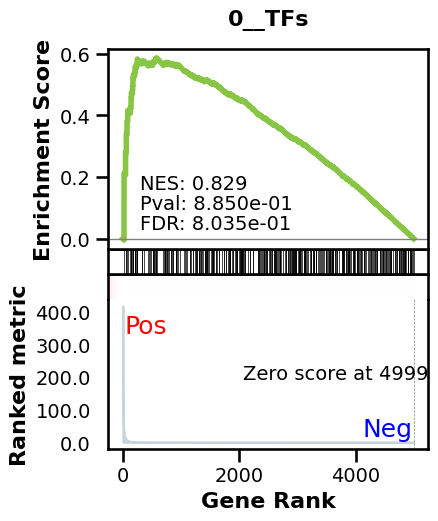

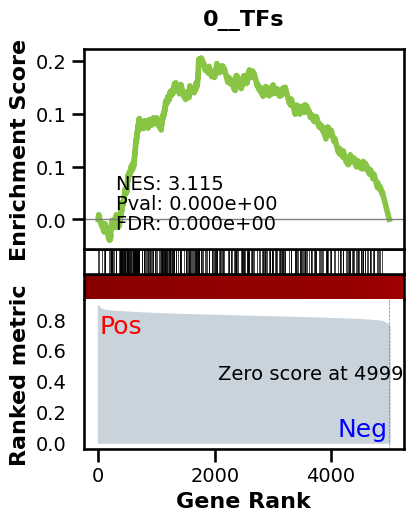

_________________________________________
TF specific enrichment


found some significant results for  11.538461538461538 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3423 genes
intersection pct: 0.6846
precision:  0.0008334948517653389 
recall:  1.0 
random precision: 0.0008337384212719915



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 53.19it/s]


  9%|▉         | 12/128 [00:00<00:02, 53.35it/s]


 14%|█▍        | 18/128 [00:00<00:02, 53.48it/s]


 19%|█▉        | 24/128 [00:00<00:01, 53.20it/s]


 23%|██▎       | 30/128 [00:00<00:01, 53.39it/s]


 28%|██▊       | 36/128 [00:00<00:01, 53.42it/s]


 33%|███▎      | 42/128 [00:00<00:01, 53.29it/s]


 38%|███▊      | 48/128 [00:00<00:01, 53.39it/s]


 42%|████▏     | 54/128 [00:01<00:01, 53.48it/s]


 47%|████▋     | 60/128 [00:01<00:01, 53.60it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 53.46it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 53.49it/s]


 61%|██████    | 78/128 [00:01<00:00, 53.53it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 53.23it/s]


 70%|███████   | 90/128 [00:01<00:00, 53.28it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 53.32it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 53.63it/s]


 84%|████████▍ | 108/128 [00:02<00:00, 53.84it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 53.96it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 53.98it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 53.98it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 53.53it/s]

Average Precision (AP):  0.0008852062154727977
Area Under Precision-Recall Curve (AUPRC):  0.0008834425703391215
EPR: 1.7214852038512451


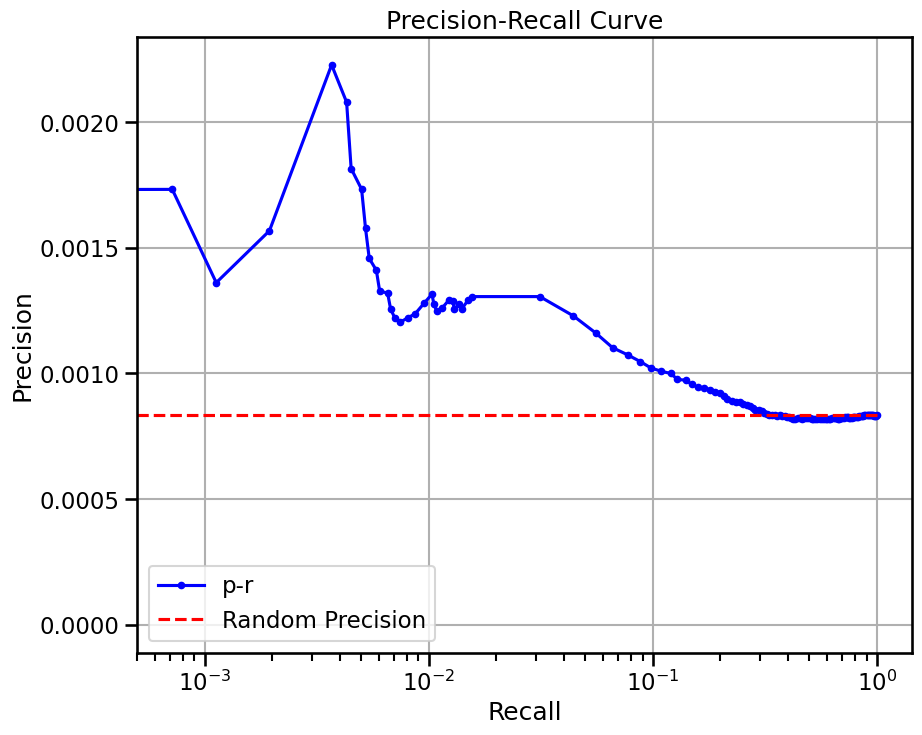

base enrichment


Top central genes: []


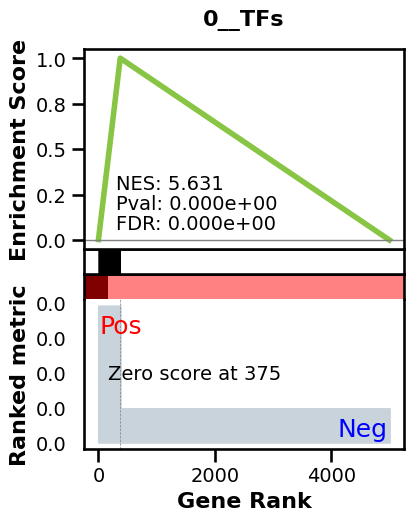

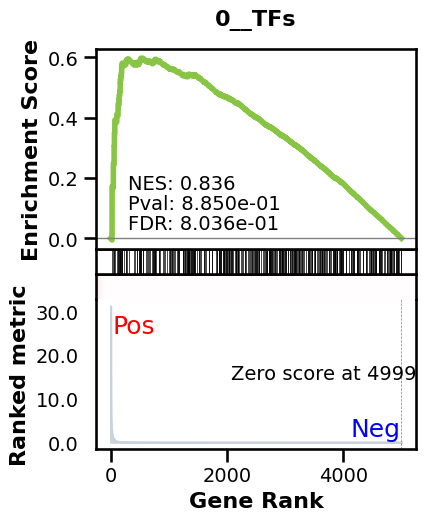

_________________________________________
TF specific enrichment


found some significant results for  7.6923076923076925 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3423 genes
intersection pct: 0.6846
precision:  0.004295594991542786 
recall:  0.4727626459143969 
random precision: 0.0008337384212719915



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▌         | 7/128 [00:00<00:01, 61.31it/s]


 11%|█         | 14/128 [00:00<00:01, 61.25it/s]


 16%|█▋        | 21/128 [00:00<00:01, 61.29it/s]


 22%|██▏       | 28/128 [00:00<00:01, 61.18it/s]


 27%|██▋       | 35/128 [00:00<00:01, 61.19it/s]


 33%|███▎      | 42/128 [00:00<00:01, 61.22it/s]


 38%|███▊      | 49/128 [00:00<00:01, 61.25it/s]


 44%|████▍     | 56/128 [00:00<00:01, 61.27it/s]


 49%|████▉     | 63/128 [00:01<00:01, 61.32it/s]


 55%|█████▍    | 70/128 [00:01<00:00, 61.31it/s]


 60%|██████    | 77/128 [00:01<00:00, 61.25it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 61.26it/s]


 71%|███████   | 91/128 [00:01<00:00, 61.24it/s]


 77%|███████▋  | 98/128 [00:01<00:00, 61.11it/s]


 82%|████████▏ | 105/128 [00:01<00:00, 61.16it/s]


 88%|████████▊ | 112/128 [00:01<00:00, 61.20it/s]


 93%|█████████▎| 119/128 [00:01<00:00, 61.22it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 61.30it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 61.21it/s]

Average Precision (AP):  0.0029910303677130124
Area Under Precision-Recall Curve (AUPRC):  0.0026348180475252335
EPR: 10.351980256843584


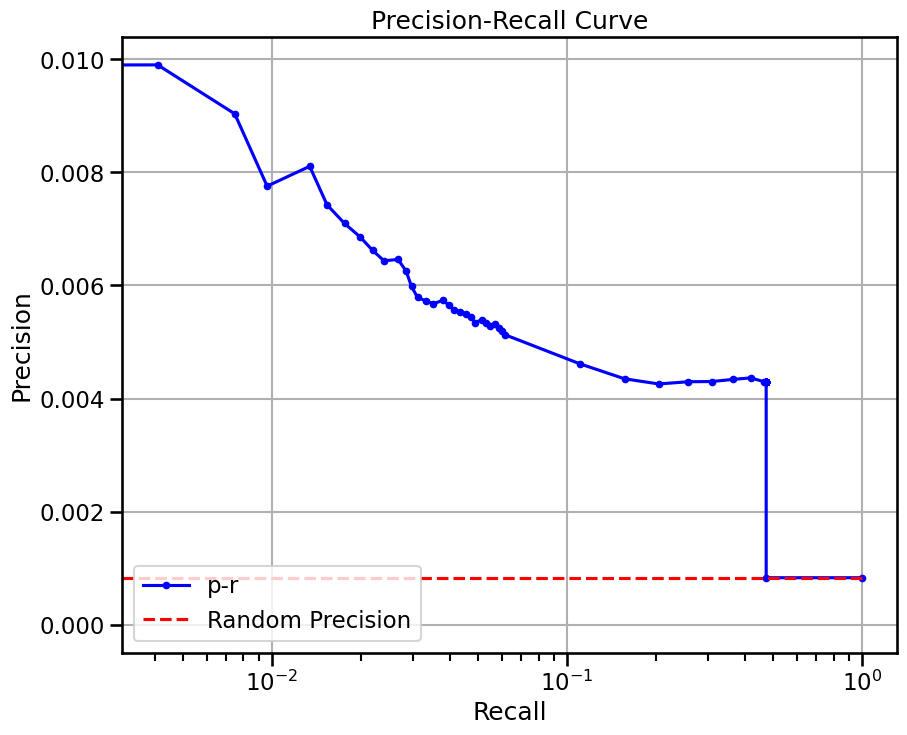

base enrichment


Top central genes: []
The DataFrame contains only the same values.


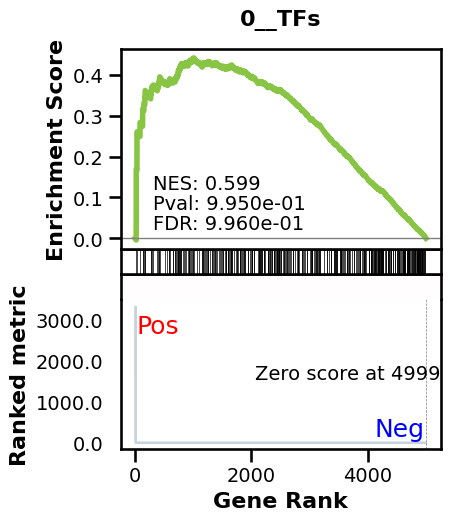

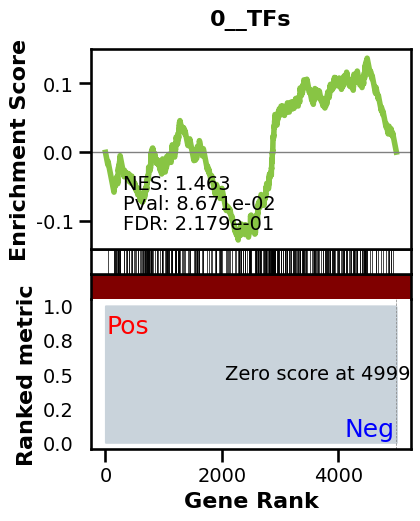

_________________________________________
TF specific enrichment


found some significant results for  7.6923076923076925 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3423 genes
intersection pct: 0.6846
precision:  0.0008334948517653389 
recall:  1.0 
random precision: 0.0008337384212719915



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▌         | 7/128 [00:00<00:01, 61.18it/s]


 11%|█         | 14/128 [00:00<00:01, 61.71it/s]


 16%|█▋        | 21/128 [00:00<00:01, 61.67it/s]


 22%|██▏       | 28/128 [00:00<00:01, 61.91it/s]


 27%|██▋       | 35/128 [00:00<00:01, 61.92it/s]


 33%|███▎      | 42/128 [00:00<00:01, 61.69it/s]


 38%|███▊      | 49/128 [00:00<00:01, 61.53it/s]


 44%|████▍     | 56/128 [00:00<00:01, 61.39it/s]


 49%|████▉     | 63/128 [00:01<00:01, 61.68it/s]


 55%|█████▍    | 70/128 [00:01<00:00, 61.51it/s]


 60%|██████    | 77/128 [00:01<00:00, 61.76it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 61.83it/s]


 71%|███████   | 91/128 [00:01<00:00, 61.73it/s]


 77%|███████▋  | 98/128 [00:01<00:00, 61.54it/s]


 82%|████████▏ | 105/128 [00:01<00:00, 61.80it/s]


 88%|████████▊ | 112/128 [00:01<00:00, 61.61it/s]


 93%|█████████▎| 119/128 [00:01<00:00, 61.86it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 61.88it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 61.69it/s]

Average Precision (AP):  0.0009685434341484623
Area Under Precision-Recall Curve (AUPRC):  0.0009588631126320158
EPR: 5.319019774843278


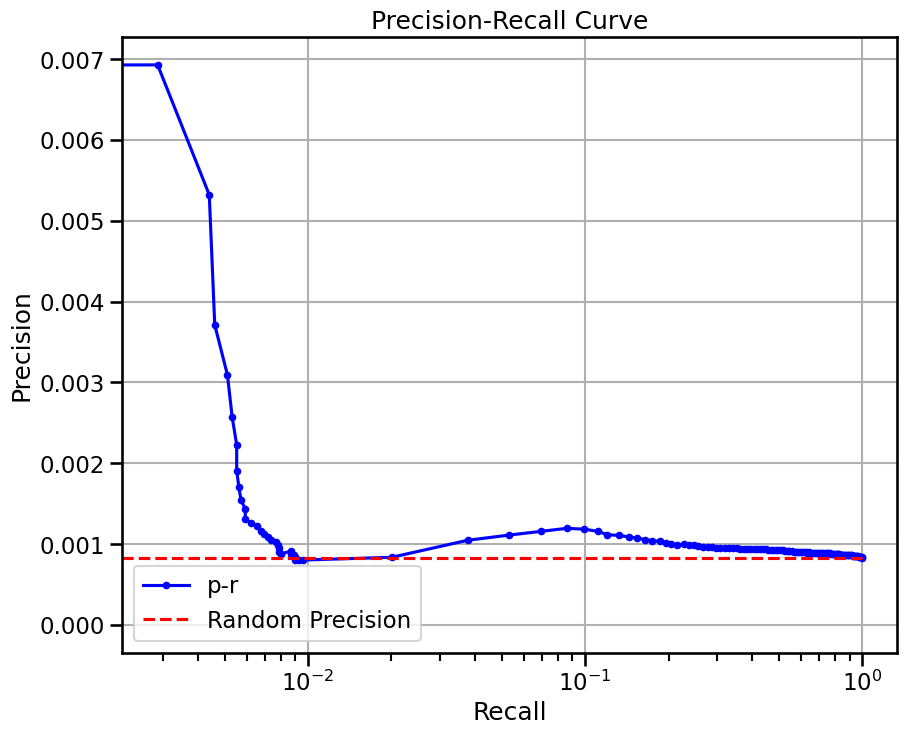

base enrichment


Top central genes: []


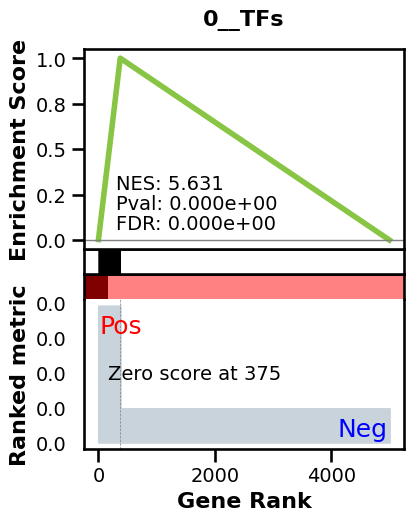

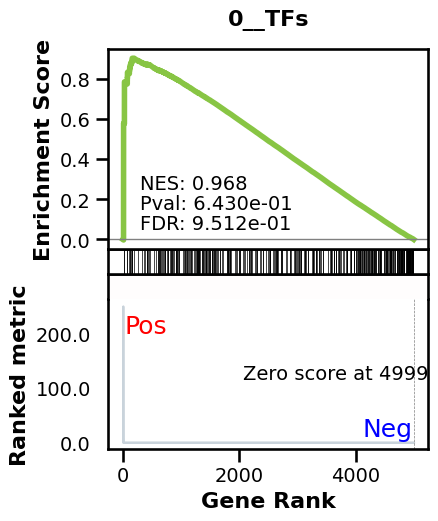

_________________________________________
TF specific enrichment


found some significant results for  3.8461538461538463 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3423 genes
intersection pct: 0.6846
precision:  0.004295594991542786 
recall:  0.4727626459143969 
random precision: 0.0008337384212719915



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 58.27it/s]


  9%|▉         | 12/128 [00:00<00:01, 59.21it/s]


 15%|█▍        | 19/128 [00:00<00:01, 60.10it/s]


 20%|██        | 26/128 [00:00<00:01, 60.45it/s]


 26%|██▌       | 33/128 [00:00<00:01, 60.78it/s]


 31%|███▏      | 40/128 [00:00<00:01, 60.44it/s]


 37%|███▋      | 47/128 [00:00<00:01, 60.21it/s]


 42%|████▏     | 54/128 [00:00<00:01, 60.19it/s]


 48%|████▊     | 61/128 [00:01<00:01, 60.08it/s]


 53%|█████▎    | 68/128 [00:01<00:01, 59.91it/s]


 58%|█████▊    | 74/128 [00:01<00:00, 59.89it/s]


 62%|██████▎   | 80/128 [00:01<00:00, 59.81it/s]


 68%|██████▊   | 87/128 [00:01<00:00, 60.15it/s]


 73%|███████▎  | 94/128 [00:01<00:00, 60.41it/s]


 79%|███████▉  | 101/128 [00:01<00:00, 60.68it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 60.63it/s]


 90%|████████▉ | 115/128 [00:01<00:00, 60.45it/s]


 95%|█████████▌| 122/128 [00:02<00:00, 60.26it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 60.18it/s]

Average Precision (AP):  0.003970621029828838
Area Under Precision-Recall Curve (AUPRC):  0.003497649942138272
EPR: 18.57911694960466


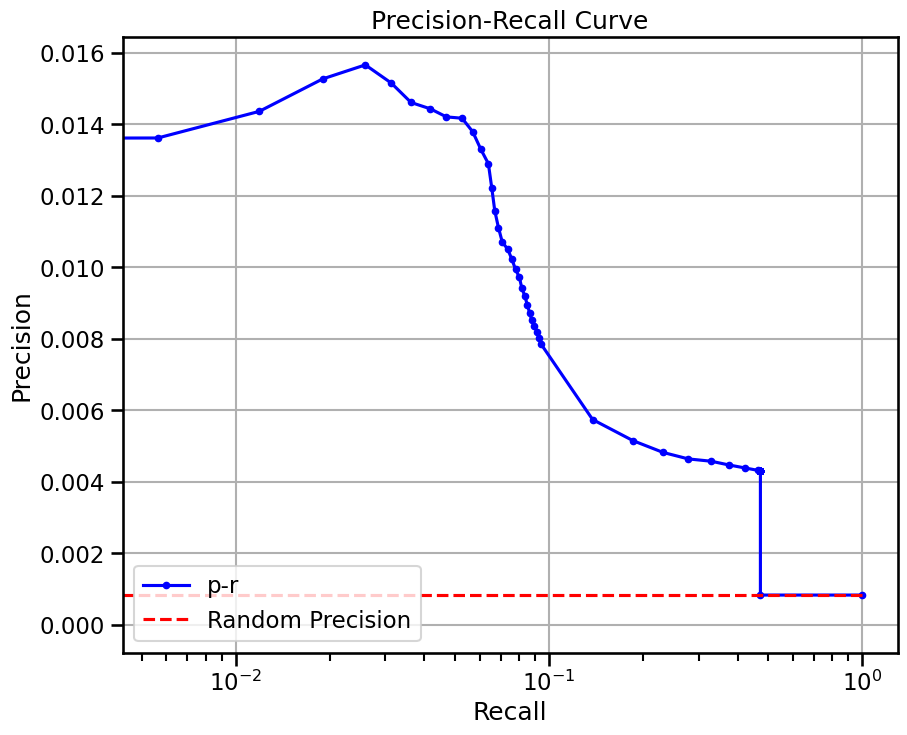


  0%|          | 0/11 [00:00<?, ?it/s]


  9%|▉         | 1/11 [00:02<00:22,  2.26s/it]


 18%|█▊        | 2/11 [00:03<00:12,  1.41s/it]


 27%|██▋       | 3/11 [00:03<00:08,  1.12s/it]


 36%|███▋      | 4/11 [00:04<00:06,  1.01it/s]


 45%|████▌     | 5/11 [00:05<00:05,  1.08it/s]


 55%|█████▍    | 6/11 [00:06<00:04,  1.15it/s]


 64%|██████▎   | 7/11 [00:07<00:03,  1.18it/s]


 73%|███████▎  | 8/11 [00:07<00:02,  1.19it/s]


 82%|████████▏ | 9/11 [00:08<00:01,  1.22it/s]


 91%|█████████ | 10/11 [00:09<00:00,  1.23it/s]


100%|██████████| 11/11 [00:10<00:00,  1.29it/s]


100%|██████████| 11/11 [00:10<00:00,  1.07it/s]

avg link count: 536246649, sparsity: 1.0


base enrichment


too many genes for central computation


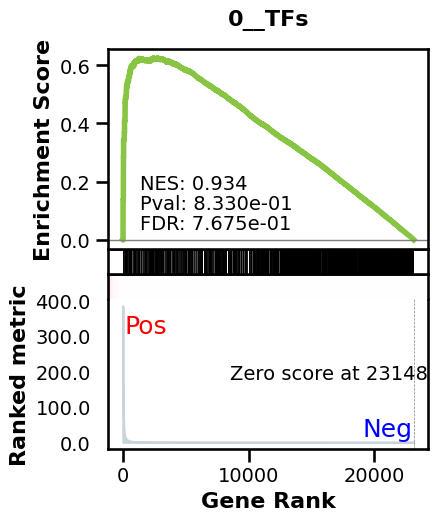

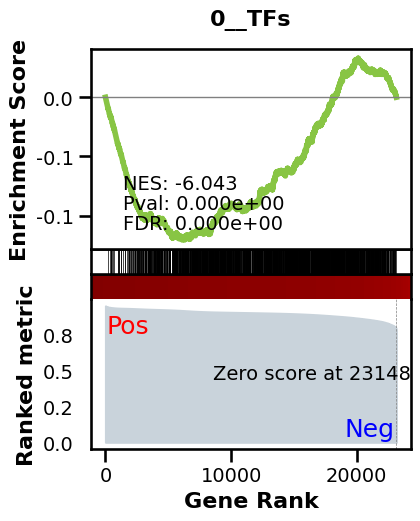

_________________________________________
TF specific enrichment


found some significant results for  61.607142857142854 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12455 genes
intersection pct: 0.5380362002678302


precision:  0.0008896322223674437 
recall:  1.0 
random precision: 0.0008897036558203398



  0%|          | 0/128 [00:00<?, ?it/s]


  1%|          | 1/128 [00:00<00:34,  3.73it/s]


  2%|▏         | 2/128 [00:00<00:30,  4.12it/s]


  2%|▏         | 3/128 [00:00<00:29,  4.27it/s]


  3%|▎         | 4/128 [00:00<00:28,  4.35it/s]


  4%|▍         | 5/128 [00:01<00:27,  4.41it/s]


  5%|▍         | 6/128 [00:01<00:27,  4.41it/s]


  5%|▌         | 7/128 [00:01<00:27,  4.41it/s]


  6%|▋         | 8/128 [00:01<00:27,  4.40it/s]


  7%|▋         | 9/128 [00:02<00:26,  4.41it/s]


  8%|▊         | 10/128 [00:02<00:26,  4.41it/s]


  9%|▊         | 11/128 [00:02<00:26,  4.41it/s]


  9%|▉         | 12/128 [00:02<00:26,  4.42it/s]


 10%|█         | 13/128 [00:02<00:26,  4.42it/s]


 11%|█         | 14/128 [00:03<00:25,  4.42it/s]


 12%|█▏        | 15/128 [00:03<00:25,  4.43it/s]


 12%|█▎        | 16/128 [00:03<00:25,  4.43it/s]


 13%|█▎        | 17/128 [00:03<00:25,  4.43it/s]


 14%|█▍        | 18/128 [00:04<00:24,  4.43it/s]


 15%|█▍        | 19/128 [00:04<00:24,  4.43it/s]


 16%|█▌        | 20/128 [00:04<00:24,  4.44it/s]


 16%|█▋        | 21/128 [00:04<00:24,  4.44it/s]


 17%|█▋        | 22/128 [00:04<00:23,  4.45it/s]


 18%|█▊        | 23/128 [00:05<00:23,  4.44it/s]


 19%|█▉        | 24/128 [00:05<00:23,  4.43it/s]


 20%|█▉        | 25/128 [00:05<00:23,  4.42it/s]


 20%|██        | 26/128 [00:05<00:23,  4.42it/s]


 21%|██        | 27/128 [00:06<00:22,  4.42it/s]


 22%|██▏       | 28/128 [00:06<00:22,  4.42it/s]


 23%|██▎       | 29/128 [00:06<00:22,  4.42it/s]


 23%|██▎       | 30/128 [00:06<00:22,  4.42it/s]


 24%|██▍       | 31/128 [00:07<00:21,  4.43it/s]


 25%|██▌       | 32/128 [00:07<00:21,  4.43it/s]


 26%|██▌       | 33/128 [00:07<00:21,  4.44it/s]


 27%|██▋       | 34/128 [00:07<00:21,  4.44it/s]


 27%|██▋       | 35/128 [00:07<00:20,  4.44it/s]


 28%|██▊       | 36/128 [00:08<00:20,  4.44it/s]


 29%|██▉       | 37/128 [00:08<00:20,  4.44it/s]


 30%|██▉       | 38/128 [00:08<00:20,  4.45it/s]


 30%|███       | 39/128 [00:08<00:19,  4.45it/s]


 31%|███▏      | 40/128 [00:09<00:19,  4.44it/s]


 32%|███▏      | 41/128 [00:09<00:19,  4.44it/s]


 33%|███▎      | 42/128 [00:09<00:19,  4.42it/s]


 34%|███▎      | 43/128 [00:09<00:19,  4.42it/s]


 34%|███▍      | 44/128 [00:09<00:19,  4.41it/s]


 35%|███▌      | 45/128 [00:10<00:18,  4.42it/s]


 36%|███▌      | 46/128 [00:10<00:18,  4.41it/s]


 37%|███▋      | 47/128 [00:10<00:18,  4.42it/s]


 38%|███▊      | 48/128 [00:10<00:18,  4.42it/s]


 38%|███▊      | 49/128 [00:11<00:17,  4.43it/s]


 39%|███▉      | 50/128 [00:11<00:17,  4.43it/s]


 40%|███▉      | 51/128 [00:11<00:17,  4.43it/s]


 41%|████      | 52/128 [00:11<00:17,  4.43it/s]


 41%|████▏     | 53/128 [00:11<00:16,  4.43it/s]


 42%|████▏     | 54/128 [00:12<00:16,  4.43it/s]


 43%|████▎     | 55/128 [00:12<00:16,  4.44it/s]


 44%|████▍     | 56/128 [00:12<00:16,  4.44it/s]


 45%|████▍     | 57/128 [00:12<00:16,  4.42it/s]


 45%|████▌     | 58/128 [00:13<00:15,  4.42it/s]


 46%|████▌     | 59/128 [00:13<00:15,  4.41it/s]


 47%|████▋     | 60/128 [00:13<00:15,  4.42it/s]


 48%|████▊     | 61/128 [00:13<00:15,  4.40it/s]


 48%|████▊     | 62/128 [00:14<00:14,  4.41it/s]


 49%|████▉     | 63/128 [00:14<00:14,  4.42it/s]


 50%|█████     | 64/128 [00:14<00:14,  4.42it/s]


 51%|█████     | 65/128 [00:14<00:14,  4.42it/s]


 52%|█████▏    | 66/128 [00:14<00:14,  4.43it/s]


 52%|█████▏    | 67/128 [00:15<00:13,  4.43it/s]


 53%|█████▎    | 68/128 [00:15<00:13,  4.43it/s]


 54%|█████▍    | 69/128 [00:15<00:13,  4.43it/s]


 55%|█████▍    | 70/128 [00:15<00:13,  4.43it/s]


 55%|█████▌    | 71/128 [00:16<00:12,  4.43it/s]


 56%|█████▋    | 72/128 [00:16<00:12,  4.43it/s]


 57%|█████▋    | 73/128 [00:16<00:12,  4.44it/s]


 58%|█████▊    | 74/128 [00:16<00:12,  4.43it/s]


 59%|█████▊    | 75/128 [00:16<00:11,  4.43it/s]


 59%|█████▉    | 76/128 [00:17<00:11,  4.42it/s]


 60%|██████    | 77/128 [00:17<00:11,  4.41it/s]


 61%|██████    | 78/128 [00:17<00:11,  4.41it/s]


 62%|██████▏   | 79/128 [00:17<00:11,  4.40it/s]


 62%|██████▎   | 80/128 [00:18<00:10,  4.41it/s]


 63%|██████▎   | 81/128 [00:18<00:10,  4.42it/s]


 64%|██████▍   | 82/128 [00:18<00:10,  4.42it/s]


 65%|██████▍   | 83/128 [00:18<00:10,  4.42it/s]


 66%|██████▌   | 84/128 [00:19<00:09,  4.42it/s]


 66%|██████▋   | 85/128 [00:19<00:09,  4.43it/s]


 67%|██████▋   | 86/128 [00:19<00:09,  4.43it/s]


 68%|██████▊   | 87/128 [00:19<00:09,  4.43it/s]


 69%|██████▉   | 88/128 [00:19<00:09,  4.44it/s]


 70%|██████▉   | 89/128 [00:20<00:08,  4.44it/s]


 70%|███████   | 90/128 [00:20<00:08,  4.44it/s]


 71%|███████   | 91/128 [00:20<00:08,  4.44it/s]


 72%|███████▏  | 92/128 [00:20<00:08,  4.42it/s]


 73%|███████▎  | 93/128 [00:21<00:07,  4.41it/s]


 73%|███████▎  | 94/128 [00:21<00:07,  4.41it/s]


 74%|███████▍  | 95/128 [00:21<00:07,  4.40it/s]


 75%|███████▌  | 96/128 [00:21<00:07,  4.41it/s]


 76%|███████▌  | 97/128 [00:21<00:07,  4.42it/s]


 77%|███████▋  | 98/128 [00:22<00:06,  4.42it/s]


 77%|███████▋  | 99/128 [00:22<00:06,  4.43it/s]


 78%|███████▊  | 100/128 [00:22<00:06,  4.43it/s]


 79%|███████▉  | 101/128 [00:22<00:06,  4.43it/s]


 80%|███████▉  | 102/128 [00:23<00:05,  4.43it/s]


 80%|████████  | 103/128 [00:23<00:05,  4.43it/s]


 81%|████████▏ | 104/128 [00:23<00:05,  4.43it/s]


 82%|████████▏ | 105/128 [00:23<00:05,  4.43it/s]


 83%|████████▎ | 106/128 [00:23<00:05,  4.33it/s]


 84%|████████▎ | 107/128 [00:24<00:04,  4.36it/s]


 84%|████████▍ | 108/128 [00:24<00:04,  4.38it/s]


 85%|████████▌ | 109/128 [00:24<00:04,  4.38it/s]


 86%|████████▌ | 110/128 [00:24<00:04,  4.30it/s]


 87%|████████▋ | 111/128 [00:25<00:04,  4.21it/s]


 88%|████████▊ | 112/128 [00:25<00:03,  4.26it/s]


 88%|████████▊ | 113/128 [00:25<00:03,  4.31it/s]


 89%|████████▉ | 114/128 [00:25<00:03,  4.35it/s]


 90%|████████▉ | 115/128 [00:26<00:02,  4.37it/s]


 91%|█████████ | 116/128 [00:26<00:02,  4.39it/s]


 91%|█████████▏| 117/128 [00:26<00:02,  4.40it/s]


 92%|█████████▏| 118/128 [00:26<00:02,  4.41it/s]


 93%|█████████▎| 119/128 [00:26<00:02,  4.42it/s]


 94%|█████████▍| 120/128 [00:27<00:01,  4.42it/s]


 95%|█████████▍| 121/128 [00:27<00:01,  4.41it/s]


 95%|█████████▌| 122/128 [00:27<00:01,  4.42it/s]


 96%|█████████▌| 123/128 [00:27<00:01,  4.44it/s]


 97%|█████████▋| 124/128 [00:28<00:00,  4.44it/s]


 98%|█████████▊| 125/128 [00:28<00:00,  4.44it/s]


 98%|█████████▊| 126/128 [00:28<00:00,  4.43it/s]


 99%|█████████▉| 127/128 [00:28<00:00,  4.43it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()



100%|██████████| 128/128 [00:29<00:00,  4.41it/s]


100%|██████████| 128/128 [00:29<00:00,  4.41it/s]

Average Precision (AP):  0.0010321208403581631
Area Under Precision-Recall Curve (AUPRC):  0.0010320072209051186


EPR: 1.8515675265406064


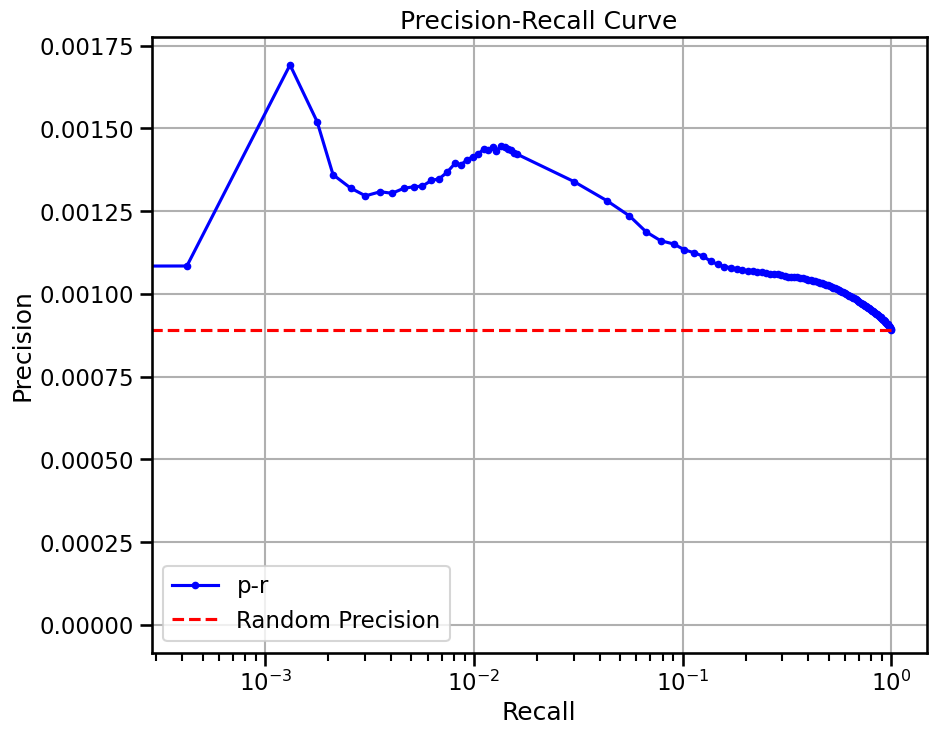


  0%|          | 0/22 [00:00<?, ?it/s]


  5%|▍         | 1/22 [00:02<00:57,  2.73s/it]


  9%|▉         | 2/22 [00:04<00:38,  1.91s/it]


 14%|█▎        | 3/22 [00:05<00:31,  1.65s/it]


 18%|█▊        | 4/22 [00:06<00:27,  1.53s/it]


 23%|██▎       | 5/22 [00:08<00:24,  1.46s/it]


 27%|██▋       | 6/22 [00:09<00:22,  1.42s/it]


 32%|███▏      | 7/22 [00:10<00:21,  1.41s/it]


 36%|███▋      | 8/22 [00:12<00:19,  1.39s/it]


 41%|████      | 9/22 [00:13<00:17,  1.37s/it]


 45%|████▌     | 10/22 [00:14<00:16,  1.35s/it]


 50%|█████     | 11/22 [00:16<00:14,  1.35s/it]


 55%|█████▍    | 12/22 [00:17<00:13,  1.34s/it]


 59%|█████▉    | 13/22 [00:18<00:12,  1.34s/it]


 64%|██████▎   | 14/22 [00:20<00:10,  1.34s/it]


 68%|██████▊   | 15/22 [00:21<00:09,  1.34s/it]


 73%|███████▎  | 16/22 [00:22<00:08,  1.34s/it]


 77%|███████▋  | 17/22 [00:24<00:06,  1.34s/it]


 82%|████████▏ | 18/22 [00:25<00:05,  1.33s/it]


 86%|████████▋ | 19/22 [00:26<00:04,  1.33s/it]


 91%|█████████ | 20/22 [00:28<00:02,  1.34s/it]


 95%|█████████▌| 21/22 [00:29<00:01,  1.34s/it]


100%|██████████| 22/22 [00:30<00:00,  1.22s/it]


100%|██████████| 22/22 [00:30<00:00,  1.39s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


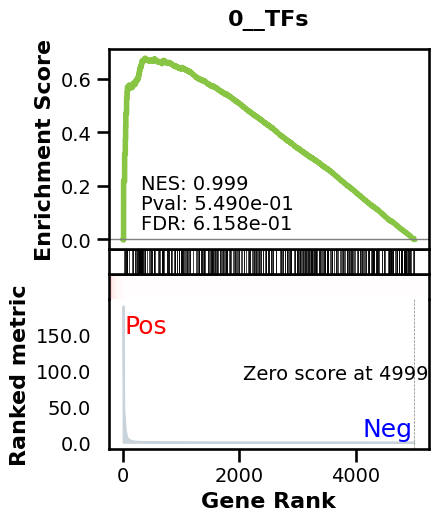

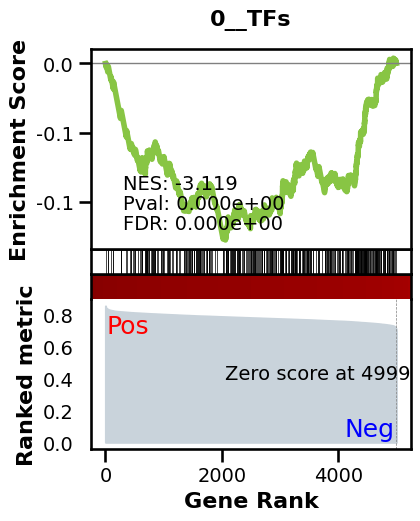

_________________________________________
TF specific enrichment


found some significant results for  15.625 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3518 genes
intersection pct: 0.7036
precision:  0.0012585320164533508 
recall:  1.0 
random precision: 0.001258889858937415



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 55.41it/s]


  9%|▉         | 12/128 [00:00<00:02, 55.63it/s]


 14%|█▍        | 18/128 [00:00<00:01, 55.86it/s]


 19%|█▉        | 24/128 [00:00<00:01, 56.19it/s]


 23%|██▎       | 30/128 [00:00<00:01, 56.27it/s]


 28%|██▊       | 36/128 [00:00<00:01, 56.39it/s]


 33%|███▎      | 42/128 [00:00<00:01, 56.44it/s]


 38%|███▊      | 48/128 [00:00<00:01, 56.22it/s]


 42%|████▏     | 54/128 [00:00<00:01, 56.35it/s]


 47%|████▋     | 60/128 [00:01<00:01, 56.47it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 56.43it/s]


 56%|█████▋    | 72/128 [00:01<00:00, 56.49it/s]


 61%|██████    | 78/128 [00:01<00:00, 56.27it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 56.37it/s]


 70%|███████   | 90/128 [00:01<00:00, 56.46it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 56.45it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 56.50it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 56.40it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 56.55it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 56.39it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 56.29it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 56.32it/s]

Average Precision (AP):  0.0014005163863877576
Area Under Precision-Recall Curve (AUPRC):  0.0013994279508707103


EPR: 0.7134623715815356


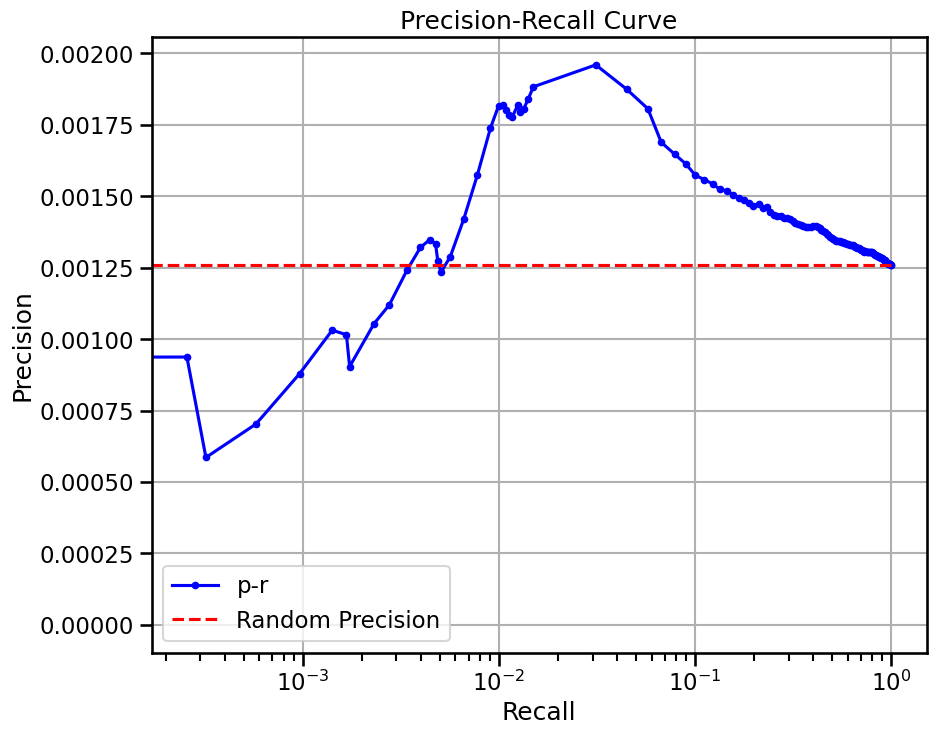

base enrichment


Top central genes: []


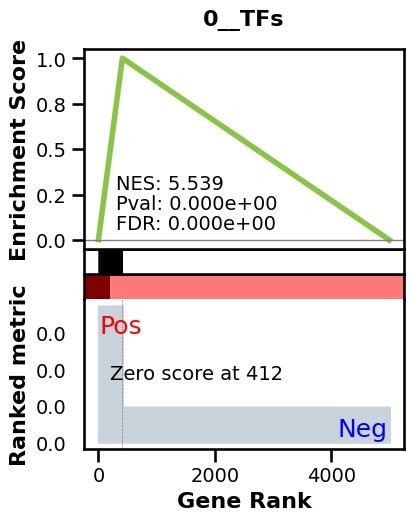

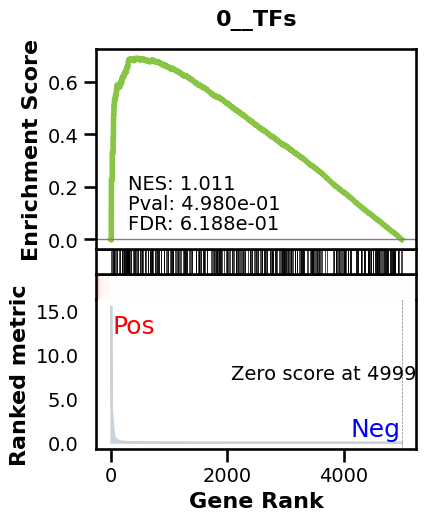

_________________________________________
TF specific enrichment


found some significant results for  9.375 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3518 genes
intersection pct: 0.7036
precision:  0.005945748396004223 
recall:  0.4700179763739086 
random precision: 0.001258889858937415



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 57.95it/s]


  9%|▉         | 12/128 [00:00<00:01, 58.05it/s]


 14%|█▍        | 18/128 [00:00<00:01, 58.01it/s]


 19%|█▉        | 24/128 [00:00<00:01, 58.00it/s]


 23%|██▎       | 30/128 [00:00<00:01, 58.07it/s]


 28%|██▊       | 36/128 [00:00<00:01, 58.08it/s]


 33%|███▎      | 42/128 [00:00<00:01, 58.07it/s]


 38%|███▊      | 48/128 [00:00<00:01, 58.06it/s]


 42%|████▏     | 54/128 [00:00<00:01, 58.09it/s]


 47%|████▋     | 60/128 [00:01<00:01, 58.02it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 57.85it/s]


 56%|█████▋    | 72/128 [00:01<00:00, 57.67it/s]


 61%|██████    | 78/128 [00:01<00:00, 57.85it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 57.96it/s]


 70%|███████   | 90/128 [00:01<00:00, 58.05it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 58.12it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 58.14it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 58.14it/s]


 89%|████████▉ | 114/128 [00:01<00:00, 58.15it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 58.16it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 58.16it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 58.03it/s]

Average Precision (AP):  0.0044301401795336735
Area Under Precision-Recall Curve (AUPRC):  0.004011650195614572
EPR: 7.304393703429819


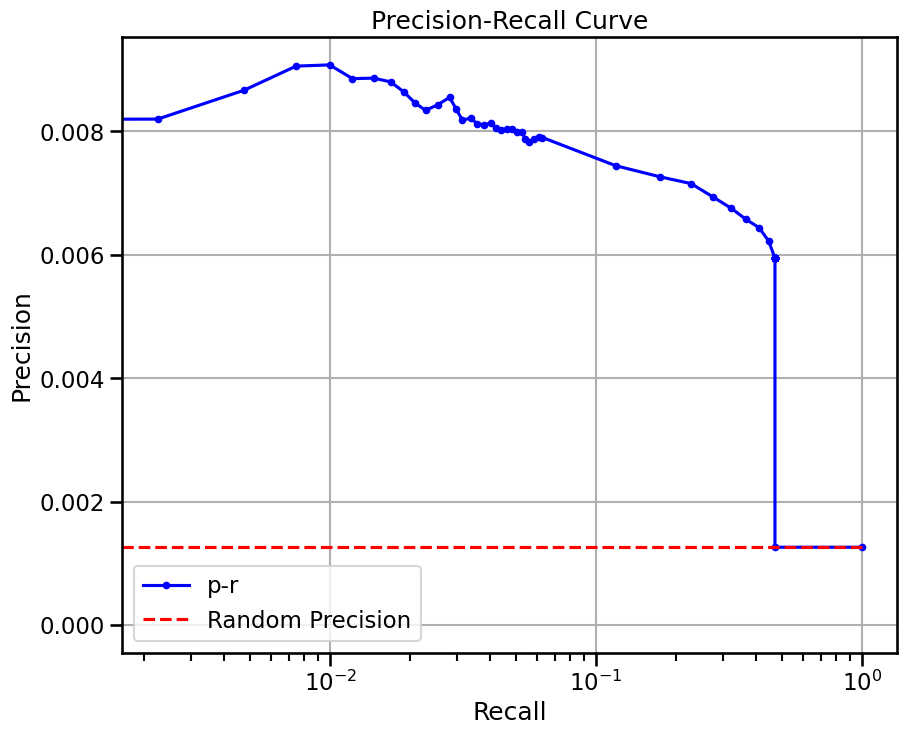

base enrichment


Top central genes: []
The DataFrame contains only the same values.


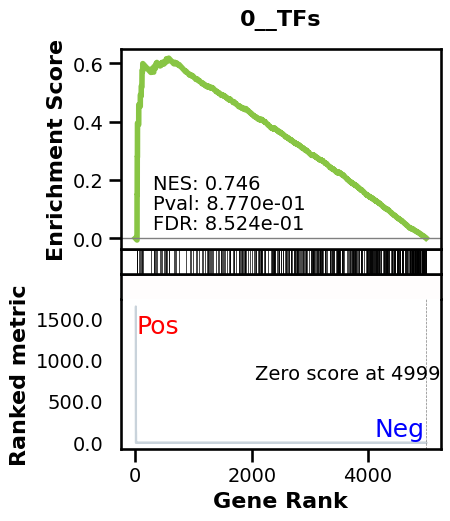

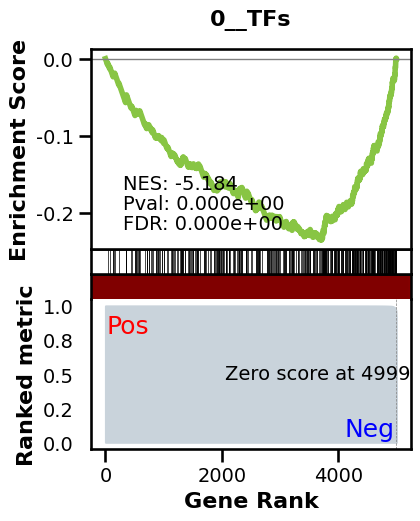

_________________________________________
TF specific enrichment


found some significant results for  6.25 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3518 genes
intersection pct: 0.7036
precision:  0.0012585320164533508 
recall:  1.0 
random precision: 0.001258889858937415



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 53.05it/s]


  9%|▉         | 12/128 [00:00<00:02, 54.00it/s]


 14%|█▍        | 18/128 [00:00<00:02, 54.66it/s]


 19%|█▉        | 24/128 [00:00<00:01, 55.04it/s]


 23%|██▎       | 30/128 [00:00<00:01, 54.84it/s]


 28%|██▊       | 36/128 [00:00<00:01, 54.39it/s]


 33%|███▎      | 42/128 [00:00<00:01, 54.00it/s]


 38%|███▊      | 48/128 [00:00<00:01, 53.77it/s]


 42%|████▏     | 54/128 [00:00<00:01, 53.58it/s]


 47%|████▋     | 60/128 [00:01<00:01, 53.45it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 53.33it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 53.83it/s]


 61%|██████    | 78/128 [00:01<00:00, 54.26it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 54.60it/s]


 70%|███████   | 90/128 [00:01<00:00, 54.72it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 54.31it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 54.02it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 53.79it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 53.62it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 53.50it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 53.40it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 53.92it/s]

Average Precision (AP):  0.0018890277141562105
Area Under Precision-Recall Curve (AUPRC):  0.0018894344532951646
EPR: 1.7371594010847209


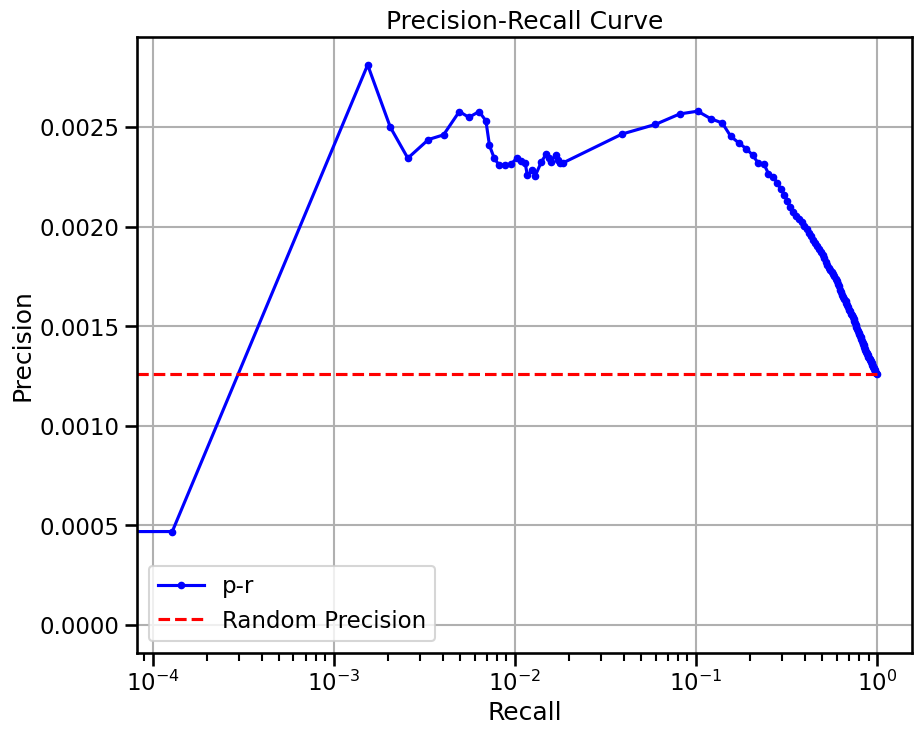

base enrichment


Top central genes: []


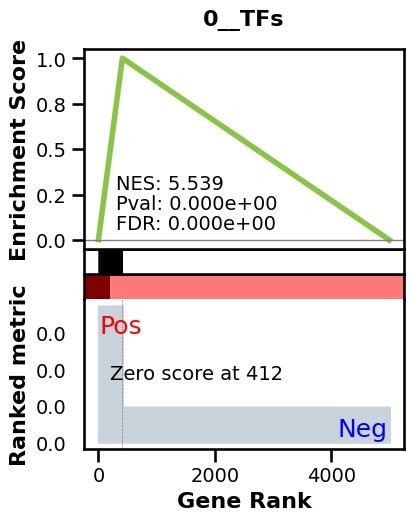

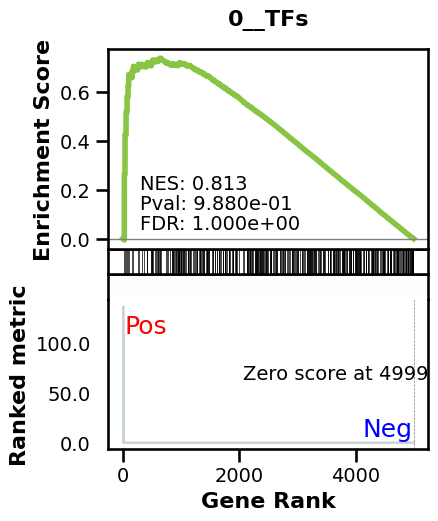

_________________________________________
TF specific enrichment


found some significant results for  4.6875 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3518 genes
intersection pct: 0.7036
precision:  0.005945748396004223 
recall:  0.4700179763739086 
random precision: 0.001258889858937415



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 54.93it/s]


  9%|▉         | 12/128 [00:00<00:02, 55.66it/s]


 14%|█▍        | 18/128 [00:00<00:01, 55.52it/s]


 19%|█▉        | 24/128 [00:00<00:01, 55.54it/s]


 23%|██▎       | 30/128 [00:00<00:01, 55.45it/s]


 28%|██▊       | 36/128 [00:00<00:01, 55.45it/s]


 33%|███▎      | 42/128 [00:00<00:01, 55.46it/s]


 38%|███▊      | 48/128 [00:00<00:01, 55.50it/s]


 42%|████▏     | 54/128 [00:00<00:01, 55.45it/s]


 47%|████▋     | 60/128 [00:01<00:01, 55.69it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 55.68it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 55.64it/s]


 61%|██████    | 78/128 [00:01<00:00, 55.60it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 55.57it/s]


 70%|███████   | 90/128 [00:01<00:00, 55.62it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 55.63it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 55.06it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 55.28it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 55.33it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 55.47it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 55.39it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 55.44it/s]

Average Precision (AP):  0.0060094456180633795
Area Under Precision-Recall Curve (AUPRC):  0.005570685819748773
EPR: 12.3237295387727


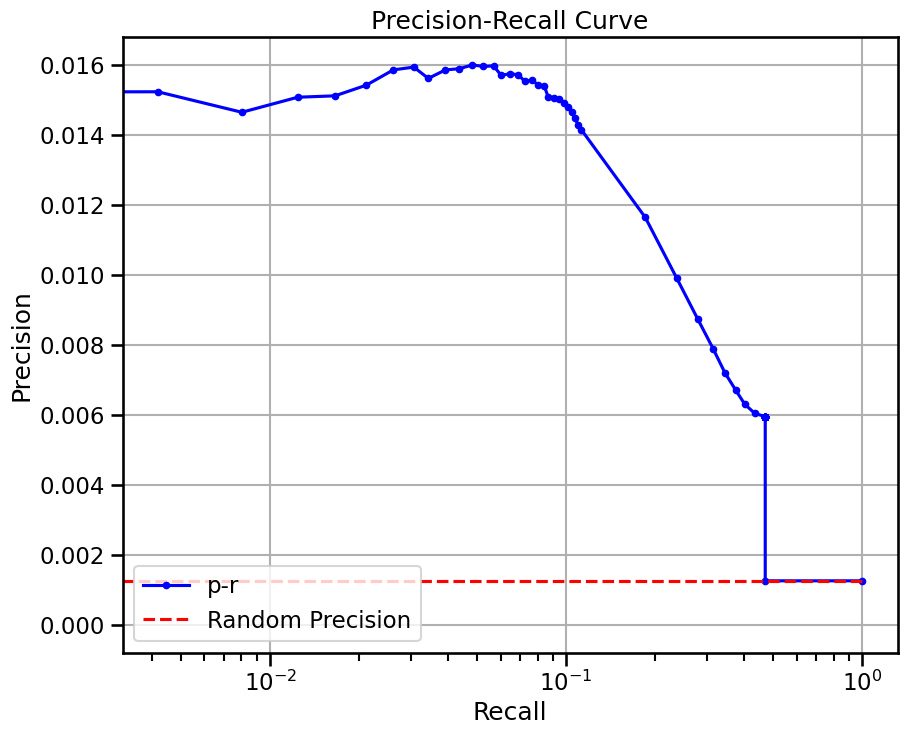


  0%|          | 0/1 [00:00<?, ?it/s]


100%|██████████| 1/1 [00:01<00:00,  1.52s/it]


100%|██████████| 1/1 [00:01<00:00,  1.70s/it]

avg link count: 101868649, sparsity: 1.0


base enrichment
too many genes for central computation


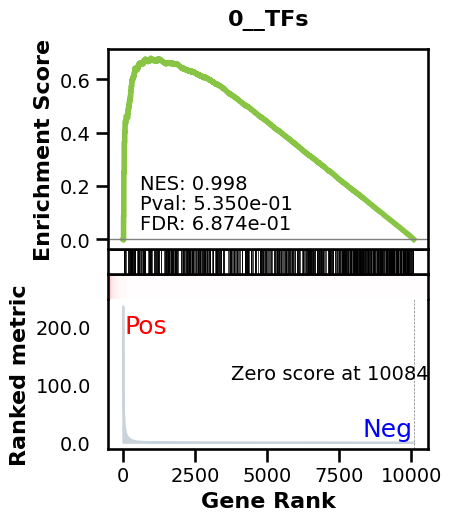

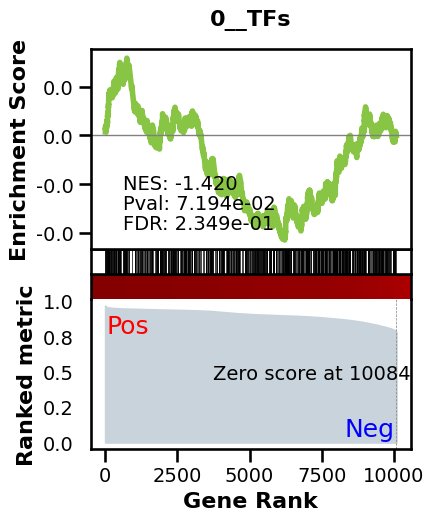

_________________________________________
TF specific enrichment


found some significant results for  44.44444444444444 % TFs

_________________________________________
loading GT,  omnipath


intersection of 5924 genes
intersection pct: 0.5874070401586514
precision:  0.001020636821754376 
recall:  1.0 
random precision: 0.0010208091392998352



  0%|          | 0/128 [00:00<?, ?it/s]


  2%|▏         | 2/128 [00:00<00:06, 18.74it/s]


  3%|▎         | 4/128 [00:00<00:06, 18.73it/s]


  5%|▍         | 6/128 [00:00<00:06, 18.72it/s]


  6%|▋         | 8/128 [00:00<00:06, 18.78it/s]


  8%|▊         | 10/128 [00:00<00:06, 18.78it/s]


  9%|▉         | 12/128 [00:00<00:06, 18.72it/s]


 11%|█         | 14/128 [00:00<00:06, 18.66it/s]


 12%|█▎        | 16/128 [00:00<00:06, 18.62it/s]


 14%|█▍        | 18/128 [00:00<00:05, 18.63it/s]


 16%|█▌        | 20/128 [00:01<00:05, 18.62it/s]


 17%|█▋        | 22/128 [00:01<00:05, 18.61it/s]


 19%|█▉        | 24/128 [00:01<00:05, 18.64it/s]


 20%|██        | 26/128 [00:01<00:05, 18.65it/s]


 22%|██▏       | 28/128 [00:01<00:05, 18.71it/s]


 23%|██▎       | 30/128 [00:01<00:05, 18.69it/s]


 25%|██▌       | 32/128 [00:01<00:05, 18.68it/s]


 27%|██▋       | 34/128 [00:01<00:05, 18.67it/s]


 28%|██▊       | 36/128 [00:01<00:04, 18.71it/s]


 30%|██▉       | 38/128 [00:02<00:04, 18.72it/s]


 31%|███▏      | 40/128 [00:02<00:04, 18.73it/s]


 33%|███▎      | 42/128 [00:02<00:04, 18.73it/s]


 34%|███▍      | 44/128 [00:02<00:04, 18.69it/s]


 36%|███▌      | 46/128 [00:02<00:04, 18.62it/s]


 38%|███▊      | 48/128 [00:02<00:04, 18.62it/s]


 39%|███▉      | 50/128 [00:02<00:04, 18.61it/s]


 41%|████      | 52/128 [00:02<00:04, 18.69it/s]


 42%|████▏     | 54/128 [00:02<00:03, 18.69it/s]


 44%|████▍     | 56/128 [00:02<00:03, 18.70it/s]


 45%|████▌     | 58/128 [00:03<00:03, 18.69it/s]


 47%|████▋     | 60/128 [00:03<00:03, 18.68it/s]


 48%|████▊     | 62/128 [00:03<00:03, 18.65it/s]


 50%|█████     | 64/128 [00:03<00:03, 18.75it/s]


 52%|█████▏    | 66/128 [00:03<00:03, 18.79it/s]


 53%|█████▎    | 68/128 [00:03<00:03, 18.81it/s]


 55%|█████▍    | 70/128 [00:03<00:03, 18.84it/s]


 56%|█████▋    | 72/128 [00:03<00:03, 16.34it/s]


 58%|█████▊    | 74/128 [00:04<00:03, 17.02it/s]


 59%|█████▉    | 76/128 [00:04<00:02, 17.48it/s]


 61%|██████    | 78/128 [00:04<00:02, 17.84it/s]


 62%|██████▎   | 80/128 [00:04<00:02, 18.16it/s]


 64%|██████▍   | 82/128 [00:04<00:02, 18.35it/s]


 66%|██████▌   | 84/128 [00:04<00:02, 18.47it/s]


 67%|██████▋   | 86/128 [00:04<00:02, 18.57it/s]


 69%|██████▉   | 88/128 [00:04<00:02, 18.70it/s]


 70%|███████   | 90/128 [00:04<00:02, 18.81it/s]


 72%|███████▏  | 92/128 [00:04<00:01, 18.84it/s]


 73%|███████▎  | 94/128 [00:05<00:01, 18.89it/s]


 75%|███████▌  | 96/128 [00:05<00:01, 18.84it/s]


 77%|███████▋  | 98/128 [00:05<00:01, 18.87it/s]


 78%|███████▊  | 100/128 [00:05<00:01, 18.86it/s]


 80%|███████▉  | 102/128 [00:05<00:01, 18.88it/s]


 81%|████████▏ | 104/128 [00:05<00:01, 18.87it/s]


 83%|████████▎ | 106/128 [00:05<00:01, 18.89it/s]


 84%|████████▍ | 108/128 [00:05<00:01, 18.84it/s]


 86%|████████▌ | 110/128 [00:05<00:00, 18.89it/s]


 88%|████████▊ | 112/128 [00:06<00:00, 18.83it/s]


 89%|████████▉ | 114/128 [00:06<00:00, 18.87it/s]


 91%|█████████ | 116/128 [00:06<00:00, 18.77it/s]


 92%|█████████▏| 118/128 [00:06<00:00, 18.79it/s]


 94%|█████████▍| 120/128 [00:06<00:00, 18.80it/s]


 95%|█████████▌| 122/128 [00:06<00:00, 18.81it/s]


 97%|█████████▋| 124/128 [00:06<00:00, 18.81it/s]


 98%|█████████▊| 126/128 [00:06<00:00, 18.81it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()



100%|██████████| 128/128 [00:06<00:00, 18.82it/s]


100%|██████████| 128/128 [00:06<00:00, 18.62it/s]

Average Precision (AP):  0.0010837970921083273
Area Under Precision-Recall Curve (AUPRC):  0.0010838873894319441


EPR: 1.203891725449651


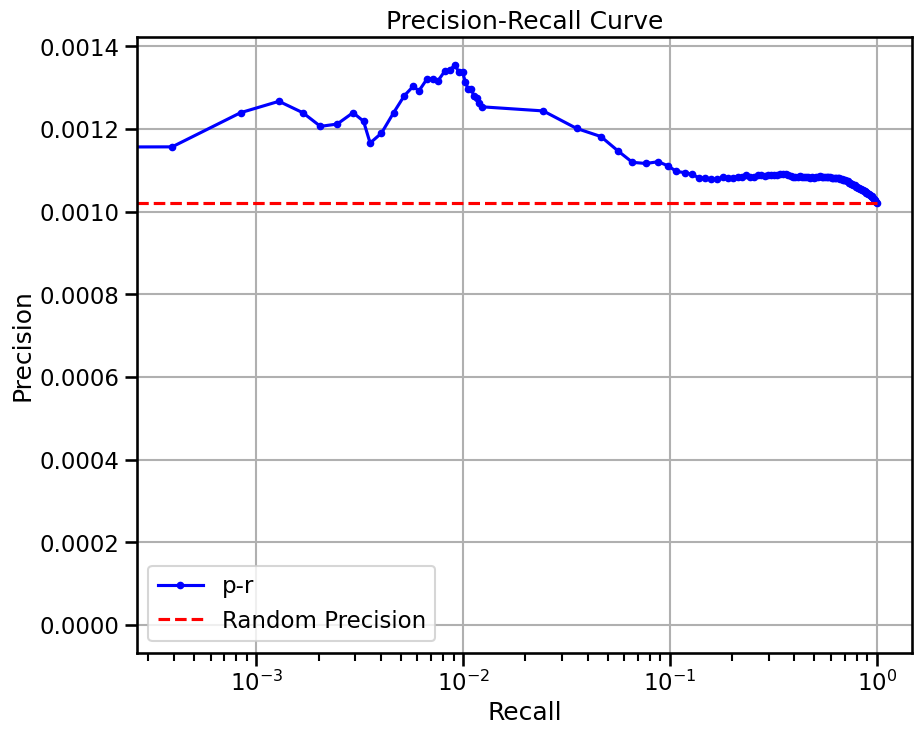


  0%|          | 0/1 [00:00<?, ?it/s]


100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


100%|██████████| 1/1 [00:01<00:00,  1.79s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


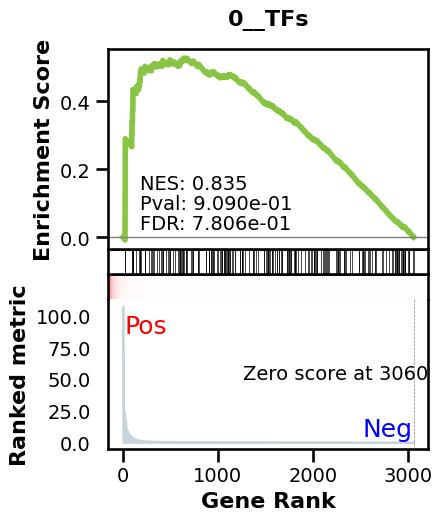

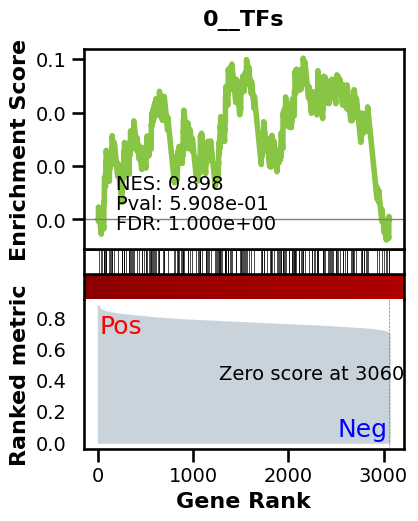

_________________________________________
TF specific enrichment


found some significant results for  28.125 % TFs

_________________________________________
loading GT,  omnipath


intersection of 2191 genes
intersection pct: 0.7157791571381902
precision:  0.0012190445082482359 
recall:  1.0 
random precision: 0.0012196011495762033



  0%|          | 0/128 [00:00<?, ?it/s]


 12%|█▎        | 16/128 [00:00<00:00, 152.11it/s]


 25%|██▌       | 32/128 [00:00<00:00, 152.34it/s]


 38%|███▊      | 48/128 [00:00<00:00, 151.57it/s]


 50%|█████     | 64/128 [00:00<00:00, 151.95it/s]


 62%|██████▎   | 80/128 [00:00<00:00, 152.11it/s]


 75%|███████▌  | 96/128 [00:00<00:00, 152.10it/s]


 88%|████████▊ | 112/128 [00:00<00:00, 152.17it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:00<00:00, 151.87it/s]


100%|██████████| 128/128 [00:00<00:00, 151.88it/s]

Average Precision (AP):  0.001460172300730301
Area Under Precision-Recall Curve (AUPRC):  0.0014586600524870985
EPR: 0.8403496798721056


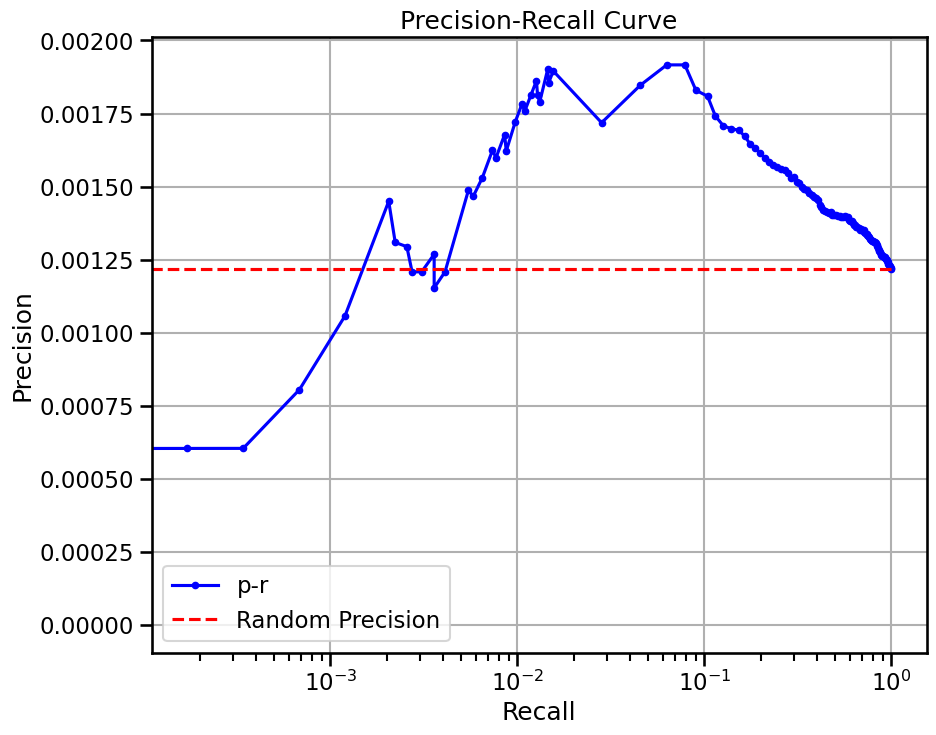

base enrichment


Top central genes: []


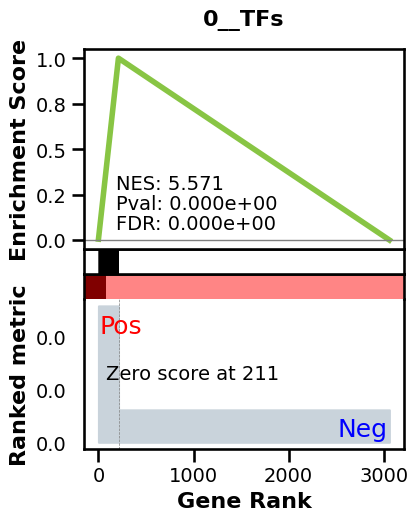

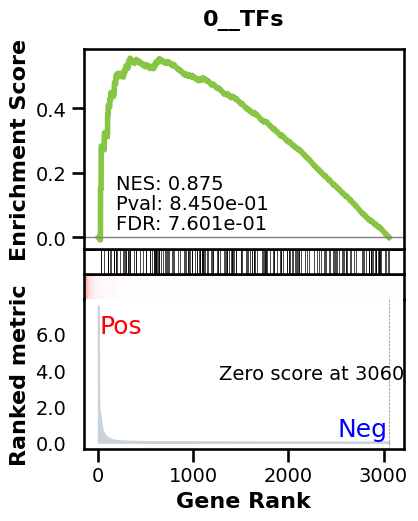

_________________________________________
TF specific enrichment


found some significant results for  6.25 % TFs

_________________________________________
loading GT,  omnipath


intersection of 2191 genes
intersection pct: 0.7157791571381902
precision:  0.007964650593587152 
recall:  0.5427204374572796 
random precision: 0.0012196011495762033



  0%|          | 0/128 [00:00<?, ?it/s]


 12%|█▎        | 16/128 [00:00<00:00, 152.68it/s]


 25%|██▌       | 32/128 [00:00<00:00, 153.24it/s]


 38%|███▊      | 48/128 [00:00<00:00, 153.23it/s]


 50%|█████     | 64/128 [00:00<00:00, 153.22it/s]


 62%|██████▎   | 80/128 [00:00<00:00, 153.21it/s]


 75%|███████▌  | 96/128 [00:00<00:00, 153.26it/s]


 88%|████████▊ | 112/128 [00:00<00:00, 153.44it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:00<00:00, 153.43it/s]


100%|██████████| 128/128 [00:00<00:00, 153.21it/s]

Average Precision (AP):  0.0069079223859863205
Area Under Precision-Recall Curve (AUPRC):  0.006470890928226993
EPR: 12.975677218791299


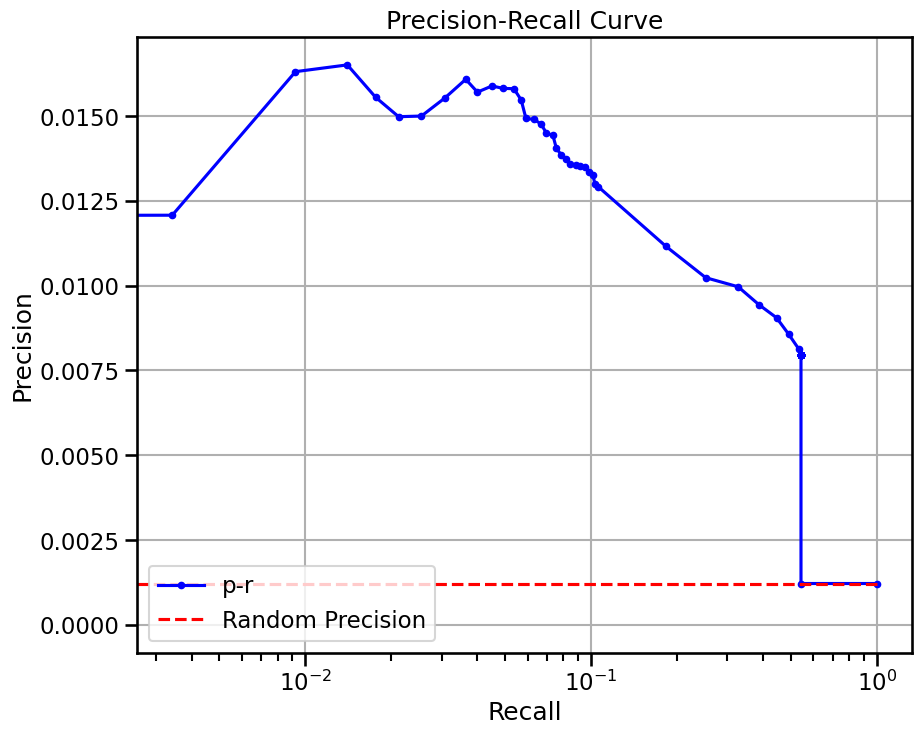

base enrichment


Top central genes: []
The DataFrame contains only the same values.


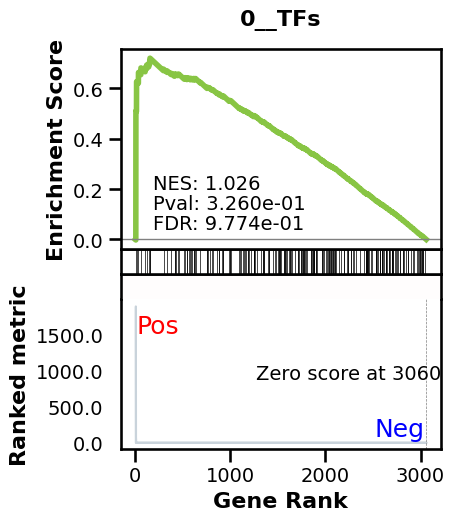

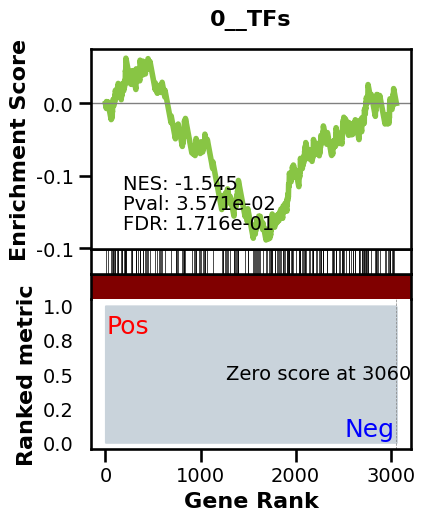

_________________________________________
TF specific enrichment


found some significant results for  3.125 % TFs

_________________________________________
loading GT,  omnipath


intersection of 2191 genes
intersection pct: 0.7157791571381902
precision:  0.0012190445082482359 
recall:  1.0 
random precision: 0.0012196011495762033



  0%|          | 0/128 [00:00<?, ?it/s]


 12%|█▎        | 16/128 [00:00<00:00, 152.16it/s]


 25%|██▌       | 32/128 [00:00<00:00, 152.23it/s]


 38%|███▊      | 48/128 [00:00<00:00, 152.30it/s]


 50%|█████     | 64/128 [00:00<00:00, 151.86it/s]


 62%|██████▎   | 80/128 [00:00<00:00, 152.11it/s]


 75%|███████▌  | 96/128 [00:00<00:00, 152.20it/s]


 88%|████████▊ | 112/128 [00:00<00:00, 152.33it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:00<00:00, 152.24it/s]


100%|██████████| 128/128 [00:00<00:00, 152.09it/s]

Average Precision (AP):  0.002002870799318832
Area Under Precision-Recall Curve (AUPRC):  0.001998258205953226
EPR: 4.664940253410134


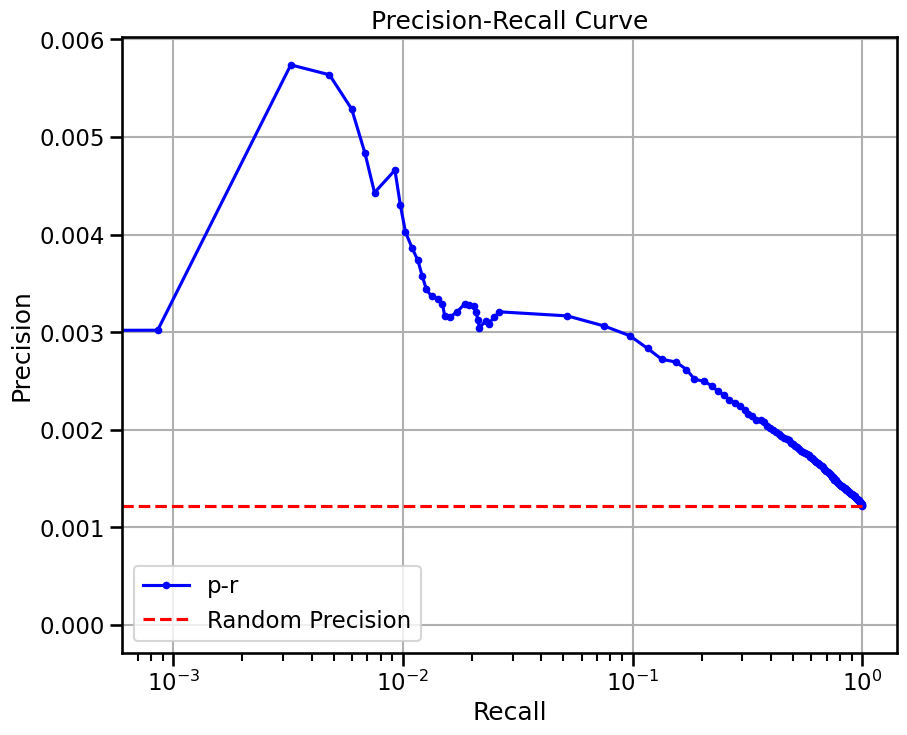

base enrichment


Top central genes: []


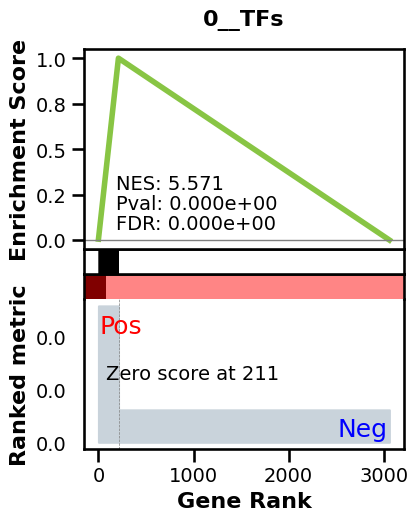

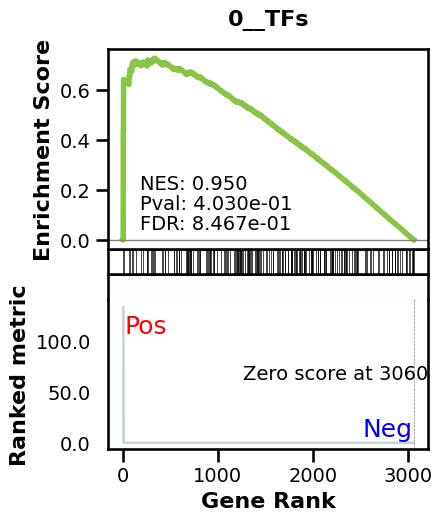

_________________________________________
TF specific enrichment


found some significant results for  9.375 % TFs

_________________________________________
loading GT,  omnipath


intersection of 2191 genes
intersection pct: 0.7157791571381902
precision:  0.007964650593587152 
recall:  0.5427204374572796 
random precision: 0.0012196011495762033



  0%|          | 0/128 [00:00<?, ?it/s]


 12%|█▎        | 16/128 [00:00<00:00, 150.60it/s]


 25%|██▌       | 32/128 [00:00<00:00, 151.03it/s]


 38%|███▊      | 48/128 [00:00<00:00, 151.37it/s]


 50%|█████     | 64/128 [00:00<00:00, 151.54it/s]


 62%|██████▎   | 80/128 [00:00<00:00, 151.65it/s]


 75%|███████▌  | 96/128 [00:00<00:00, 151.53it/s]


 88%|████████▊ | 112/128 [00:00<00:00, 151.33it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:00<00:00, 151.27it/s]


100%|██████████| 128/128 [00:00<00:00, 151.24it/s]

Average Precision (AP):  0.009125104384650596
Area Under Precision-Recall Curve (AUPRC):  0.008464423439489705
EPR: 21.31038418385053


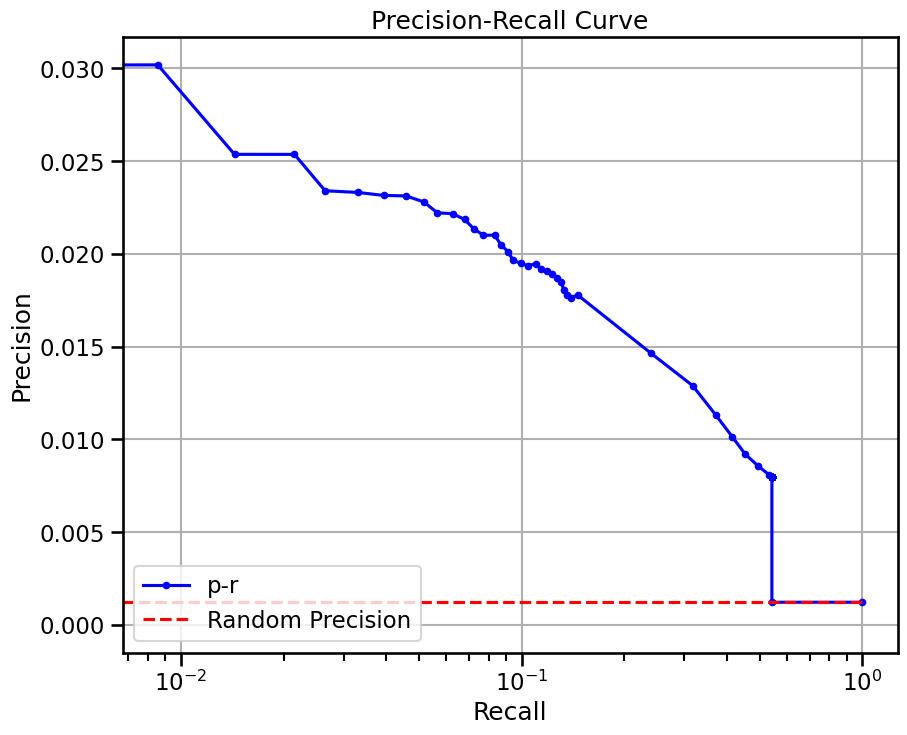


  0%|          | 0/7 [00:00<?, ?it/s]


 14%|█▍        | 1/7 [00:02<00:12,  2.08s/it]


 29%|██▊       | 2/7 [00:02<00:06,  1.29s/it]


 43%|████▎     | 3/7 [00:03<00:04,  1.05s/it]


 57%|█████▋    | 4/7 [00:04<00:02,  1.08it/s]


 71%|███████▏  | 5/7 [00:05<00:01,  1.16it/s]


 86%|████████▌ | 6/7 [00:05<00:00,  1.22it/s]


100%|██████████| 7/7 [00:06<00:00,  1.32it/s]


100%|██████████| 7/7 [00:06<00:00,  1.06it/s]

avg link count: 536246649, sparsity: 1.0


base enrichment


too many genes for central computation


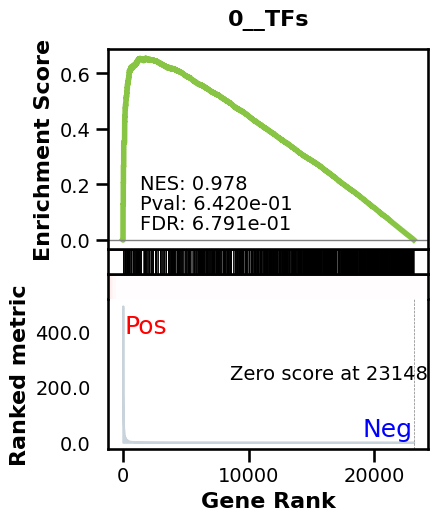

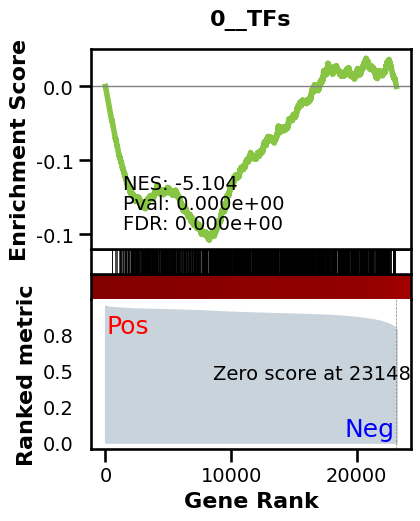

_________________________________________
TF specific enrichment


found some significant results for  60.714285714285715 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12455 genes
intersection pct: 0.5380362002678302


precision:  0.0008896322223674437 
recall:  1.0 
random precision: 0.0008897036558203398



  0%|          | 0/128 [00:00<?, ?it/s]


  1%|          | 1/128 [00:00<00:29,  4.36it/s]


  2%|▏         | 2/128 [00:00<00:29,  4.32it/s]


  2%|▏         | 3/128 [00:00<00:29,  4.31it/s]


  3%|▎         | 4/128 [00:00<00:28,  4.31it/s]


  4%|▍         | 5/128 [00:01<00:28,  4.31it/s]


  5%|▍         | 6/128 [00:01<00:28,  4.32it/s]


  5%|▌         | 7/128 [00:01<00:28,  4.31it/s]


  6%|▋         | 8/128 [00:01<00:27,  4.32it/s]


  7%|▋         | 9/128 [00:02<00:27,  4.31it/s]


  8%|▊         | 10/128 [00:02<00:27,  4.31it/s]


  9%|▊         | 11/128 [00:02<00:27,  4.31it/s]


  9%|▉         | 12/128 [00:02<00:26,  4.32it/s]


 10%|█         | 13/128 [00:03<00:26,  4.30it/s]


 11%|█         | 14/128 [00:03<00:26,  4.31it/s]


 12%|█▏        | 15/128 [00:03<00:26,  4.31it/s]


 12%|█▎        | 16/128 [00:03<00:25,  4.31it/s]


 13%|█▎        | 17/128 [00:03<00:25,  4.31it/s]


 14%|█▍        | 18/128 [00:04<00:25,  4.32it/s]


 15%|█▍        | 19/128 [00:04<00:25,  4.31it/s]


 16%|█▌        | 20/128 [00:04<00:24,  4.32it/s]


 16%|█▋        | 21/128 [00:04<00:24,  4.32it/s]


 17%|█▋        | 22/128 [00:05<00:24,  4.33it/s]


 18%|█▊        | 23/128 [00:05<00:24,  4.33it/s]


 19%|█▉        | 24/128 [00:05<00:23,  4.34it/s]


 20%|█▉        | 25/128 [00:05<00:23,  4.32it/s]


 20%|██        | 26/128 [00:06<00:23,  4.32it/s]


 21%|██        | 27/128 [00:06<00:23,  4.33it/s]


 22%|██▏       | 28/128 [00:06<00:23,  4.32it/s]


 23%|██▎       | 29/128 [00:06<00:22,  4.32it/s]


 23%|██▎       | 30/128 [00:06<00:22,  4.32it/s]


 24%|██▍       | 31/128 [00:07<00:22,  4.32it/s]


 25%|██▌       | 32/128 [00:07<00:22,  4.31it/s]


 26%|██▌       | 33/128 [00:07<00:22,  4.32it/s]


 27%|██▋       | 34/128 [00:07<00:21,  4.32it/s]


 27%|██▋       | 35/128 [00:08<00:21,  4.32it/s]


 28%|██▊       | 36/128 [00:08<00:21,  4.32it/s]


 29%|██▉       | 37/128 [00:08<00:21,  4.32it/s]


 30%|██▉       | 38/128 [00:08<00:20,  4.31it/s]


 30%|███       | 39/128 [00:09<00:20,  4.31it/s]


 31%|███▏      | 40/128 [00:09<00:20,  4.32it/s]


 32%|███▏      | 41/128 [00:09<00:20,  4.31it/s]


 33%|███▎      | 42/128 [00:09<00:19,  4.32it/s]


 34%|███▎      | 43/128 [00:09<00:19,  4.32it/s]


 34%|███▍      | 44/128 [00:10<00:19,  4.32it/s]


 35%|███▌      | 45/128 [00:10<00:19,  4.31it/s]


 36%|███▌      | 46/128 [00:10<00:19,  4.31it/s]


 37%|███▋      | 47/128 [00:10<00:18,  4.32it/s]


 38%|███▊      | 48/128 [00:11<00:18,  4.32it/s]


 38%|███▊      | 49/128 [00:11<00:18,  4.32it/s]


 39%|███▉      | 50/128 [00:11<00:18,  4.32it/s]


 40%|███▉      | 51/128 [00:11<00:17,  4.32it/s]


 41%|████      | 52/128 [00:12<00:17,  4.33it/s]


 41%|████▏     | 53/128 [00:12<00:17,  4.32it/s]


 42%|████▏     | 54/128 [00:12<00:17,  4.33it/s]


 43%|████▎     | 55/128 [00:12<00:16,  4.32it/s]


 44%|████▍     | 56/128 [00:12<00:16,  4.33it/s]


 45%|████▍     | 57/128 [00:13<00:16,  4.32it/s]


 45%|████▌     | 58/128 [00:13<00:16,  4.32it/s]


 46%|████▌     | 59/128 [00:13<00:15,  4.32it/s]


 47%|████▋     | 60/128 [00:13<00:15,  4.32it/s]


 48%|████▊     | 61/128 [00:14<00:15,  4.33it/s]


 48%|████▊     | 62/128 [00:14<00:15,  4.33it/s]


 49%|████▉     | 63/128 [00:14<00:15,  4.33it/s]


 50%|█████     | 64/128 [00:14<00:14,  4.33it/s]


 51%|█████     | 65/128 [00:15<00:14,  4.32it/s]


 52%|█████▏    | 66/128 [00:15<00:14,  4.32it/s]


 52%|█████▏    | 67/128 [00:15<00:14,  4.33it/s]


 53%|█████▎    | 68/128 [00:15<00:13,  4.33it/s]


 54%|█████▍    | 69/128 [00:15<00:13,  4.33it/s]


 55%|█████▍    | 70/128 [00:16<00:13,  4.33it/s]


 55%|█████▌    | 71/128 [00:16<00:13,  4.32it/s]


 56%|█████▋    | 72/128 [00:16<00:12,  4.33it/s]


 57%|█████▋    | 73/128 [00:16<00:12,  4.33it/s]


 58%|█████▊    | 74/128 [00:17<00:12,  4.32it/s]


 59%|█████▊    | 75/128 [00:17<00:12,  4.33it/s]


 59%|█████▉    | 76/128 [00:17<00:12,  4.32it/s]


 60%|██████    | 77/128 [00:17<00:11,  4.33it/s]


 61%|██████    | 78/128 [00:18<00:11,  4.32it/s]


 62%|██████▏   | 79/128 [00:18<00:11,  4.33it/s]


 62%|██████▎   | 80/128 [00:18<00:11,  4.32it/s]


 63%|██████▎   | 81/128 [00:18<00:10,  4.33it/s]


 64%|██████▍   | 82/128 [00:18<00:10,  4.33it/s]


 65%|██████▍   | 83/128 [00:19<00:10,  4.33it/s]


 66%|██████▌   | 84/128 [00:19<00:10,  4.32it/s]


 66%|██████▋   | 85/128 [00:19<00:09,  4.33it/s]


 67%|██████▋   | 86/128 [00:19<00:09,  4.33it/s]


 68%|██████▊   | 87/128 [00:20<00:09,  4.32it/s]


 69%|██████▉   | 88/128 [00:20<00:09,  4.33it/s]


 70%|██████▉   | 89/128 [00:20<00:09,  4.27it/s]


 70%|███████   | 90/128 [00:20<00:08,  4.29it/s]


 71%|███████   | 91/128 [00:21<00:08,  4.30it/s]


 72%|███████▏  | 92/128 [00:21<00:08,  4.29it/s]


 73%|███████▎  | 93/128 [00:21<00:08,  4.31it/s]


 73%|███████▎  | 94/128 [00:21<00:07,  4.31it/s]


 74%|███████▍  | 95/128 [00:21<00:07,  4.31it/s]


 75%|███████▌  | 96/128 [00:22<00:07,  4.31it/s]


 76%|███████▌  | 97/128 [00:22<00:07,  4.32it/s]


 77%|███████▋  | 98/128 [00:22<00:07,  4.20it/s]


 77%|███████▋  | 99/128 [00:22<00:06,  4.24it/s]


 78%|███████▊  | 100/128 [00:23<00:06,  4.26it/s]


 79%|███████▉  | 101/128 [00:23<00:06,  4.28it/s]


 80%|███████▉  | 102/128 [00:23<00:06,  4.30it/s]


 80%|████████  | 103/128 [00:23<00:05,  4.30it/s]


 81%|████████▏ | 104/128 [00:24<00:05,  4.32it/s]


 82%|████████▏ | 105/128 [00:24<00:05,  4.32it/s]


 83%|████████▎ | 106/128 [00:24<00:05,  4.31it/s]


 84%|████████▎ | 107/128 [00:24<00:04,  4.31it/s]


 84%|████████▍ | 108/128 [00:25<00:04,  4.30it/s]


 85%|████████▌ | 109/128 [00:25<00:04,  4.31it/s]


 86%|████████▌ | 110/128 [00:25<00:04,  4.32it/s]


 87%|████████▋ | 111/128 [00:25<00:03,  4.31it/s]


 88%|████████▊ | 112/128 [00:25<00:03,  4.32it/s]


 88%|████████▊ | 113/128 [00:26<00:03,  4.32it/s]


 89%|████████▉ | 114/128 [00:26<00:03,  4.33it/s]


 90%|████████▉ | 115/128 [00:26<00:03,  4.33it/s]


 91%|█████████ | 116/128 [00:26<00:02,  4.31it/s]


 91%|█████████▏| 117/128 [00:27<00:02,  4.32it/s]


 92%|█████████▏| 118/128 [00:27<00:02,  4.33it/s]


 93%|█████████▎| 119/128 [00:27<00:02,  4.33it/s]


 94%|█████████▍| 120/128 [00:27<00:01,  4.34it/s]


 95%|█████████▍| 121/128 [00:28<00:01,  4.32it/s]


 95%|█████████▌| 122/128 [00:28<00:01,  4.32it/s]


 96%|█████████▌| 123/128 [00:28<00:01,  4.33it/s]


 97%|█████████▋| 124/128 [00:28<00:00,  4.34it/s]


 98%|█████████▊| 125/128 [00:28<00:00,  4.19it/s]


 98%|█████████▊| 126/128 [00:29<00:00,  4.23it/s]


 99%|█████████▉| 127/128 [00:29<00:00,  4.26it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()



100%|██████████| 128/128 [00:29<00:00,  4.28it/s]


100%|██████████| 128/128 [00:29<00:00,  4.31it/s]

Average Precision (AP):  0.0010604011205140095
Area Under Precision-Recall Curve (AUPRC):  0.0010601510439691186


EPR: 1.7370207552608286


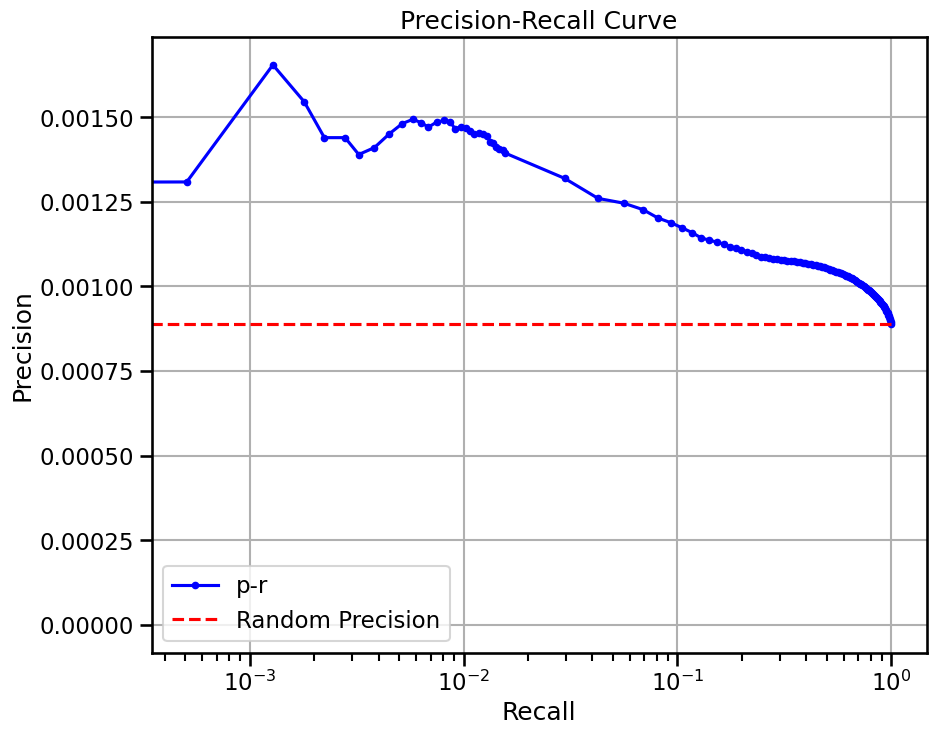


  0%|          | 0/14 [00:00<?, ?it/s]


  7%|▋         | 1/14 [00:02<00:34,  2.67s/it]


 14%|█▍        | 2/14 [00:03<00:22,  1.84s/it]


 21%|██▏       | 3/14 [00:05<00:17,  1.58s/it]


 29%|██▊       | 4/14 [00:06<00:14,  1.45s/it]


 36%|███▌      | 5/14 [00:07<00:12,  1.38s/it]


 43%|████▎     | 6/14 [00:08<00:10,  1.35s/it]


 50%|█████     | 7/14 [00:10<00:09,  1.32s/it]


 57%|█████▋    | 8/14 [00:11<00:07,  1.30s/it]


 64%|██████▍   | 9/14 [00:12<00:06,  1.29s/it]


 71%|███████▏  | 10/14 [00:14<00:05,  1.28s/it]


 79%|███████▊  | 11/14 [00:15<00:03,  1.27s/it]


 86%|████████▌ | 12/14 [00:16<00:02,  1.26s/it]


 93%|█████████▎| 13/14 [00:17<00:01,  1.26s/it]


100%|██████████| 14/14 [00:18<00:00,  1.14s/it]


100%|██████████| 14/14 [00:18<00:00,  1.35s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


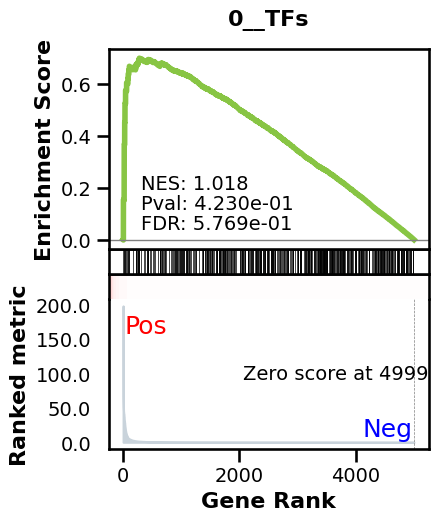

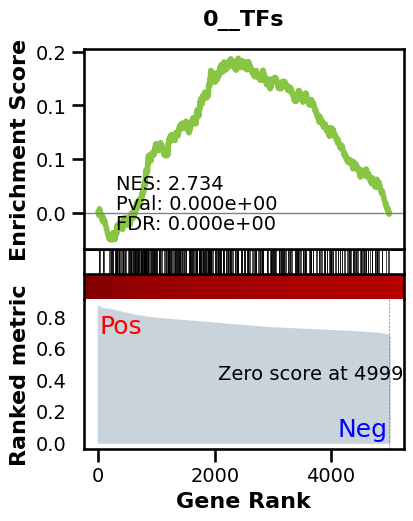

_________________________________________
TF specific enrichment


found some significant results for  29.09090909090909 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3538 genes
intersection pct: 0.7076
precision:  0.0015724456206874184 
recall:  1.0 
random precision: 0.0015728901911201826



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 52.01it/s]


  9%|▉         | 12/128 [00:00<00:02, 53.16it/s]


 14%|█▍        | 18/128 [00:00<00:02, 53.55it/s]


 19%|█▉        | 24/128 [00:00<00:01, 53.65it/s]


 23%|██▎       | 30/128 [00:00<00:01, 51.91it/s]


 28%|██▊       | 36/128 [00:00<00:01, 52.64it/s]


 33%|███▎      | 42/128 [00:00<00:01, 53.10it/s]


 38%|███▊      | 48/128 [00:00<00:01, 53.36it/s]


 42%|████▏     | 54/128 [00:01<00:01, 53.35it/s]


 47%|████▋     | 60/128 [00:01<00:01, 53.73it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 53.82it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 53.88it/s]


 61%|██████    | 78/128 [00:01<00:00, 53.43it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 53.61it/s]


 70%|███████   | 90/128 [00:01<00:00, 53.73it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 53.85it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 53.85it/s]


 84%|████████▍ | 108/128 [00:02<00:00, 53.85it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 53.90it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 44.12it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 46.73it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 51.77it/s]

Average Precision (AP):  0.001738965808926596
Area Under Precision-Recall Curve (AUPRC):  0.001736668534407967
EPR: 1.618165553046366


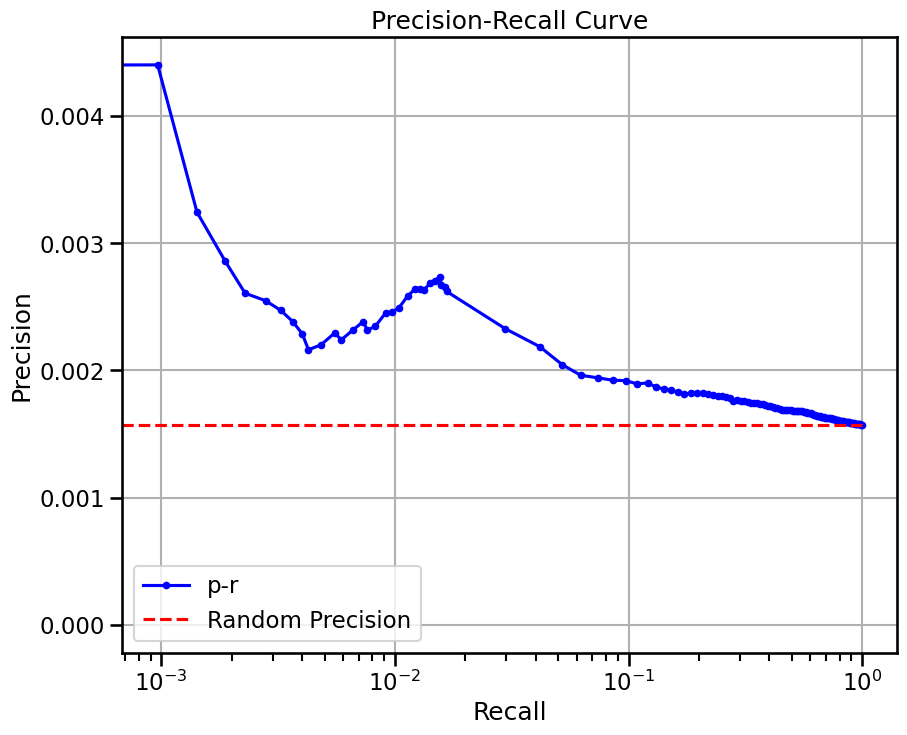

base enrichment


Top central genes: []


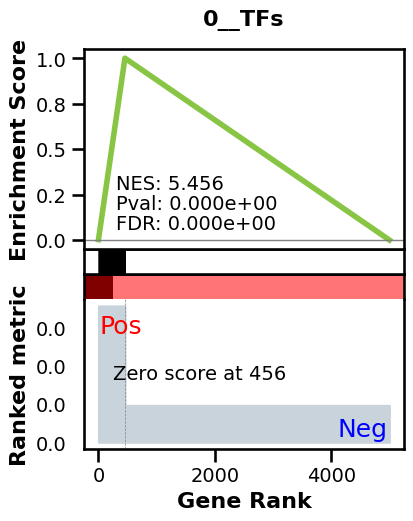

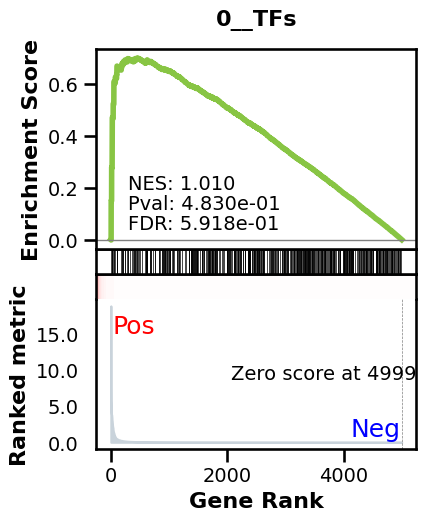

_________________________________________
TF specific enrichment


found some significant results for  9.090909090909092 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3538 genes
intersection pct: 0.7076
precision:  0.007216602122232253 
recall:  0.5214652237971854 
random precision: 0.0015728901911201826



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 53.81it/s]


  9%|▉         | 12/128 [00:00<00:02, 53.58it/s]


 14%|█▍        | 18/128 [00:00<00:02, 53.73it/s]


 19%|█▉        | 24/128 [00:00<00:01, 53.80it/s]


 23%|██▎       | 30/128 [00:00<00:01, 53.78it/s]


 28%|██▊       | 36/128 [00:00<00:01, 53.77it/s]


 33%|███▎      | 42/128 [00:00<00:01, 53.76it/s]


 38%|███▊      | 48/128 [00:00<00:01, 53.80it/s]


 42%|████▏     | 54/128 [00:01<00:01, 53.88it/s]


 47%|████▋     | 60/128 [00:01<00:01, 53.97it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 53.80it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 53.87it/s]


 61%|██████    | 78/128 [00:01<00:00, 53.91it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 53.94it/s]


 70%|███████   | 90/128 [00:01<00:00, 53.86it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 53.90it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 53.93it/s]


 84%|████████▍ | 108/128 [00:02<00:00, 53.95it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 53.92it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 53.76it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 53.77it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 53.81it/s]

Average Precision (AP):  0.005506767044873202
Area Under Precision-Recall Curve (AUPRC):  0.005075542948873533
EPR: 7.582059873710058


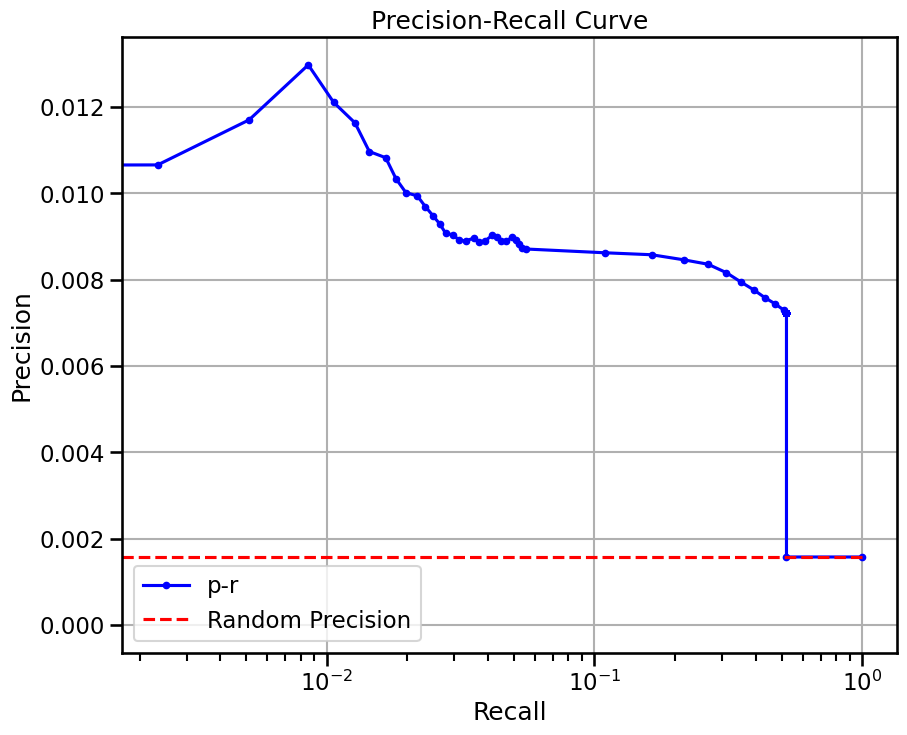

base enrichment


Top central genes: []
The DataFrame contains only the same values.


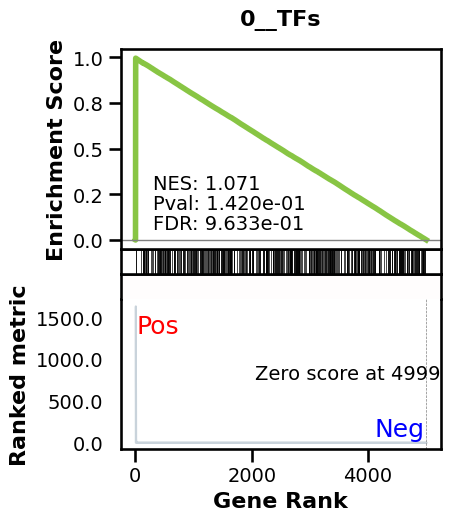

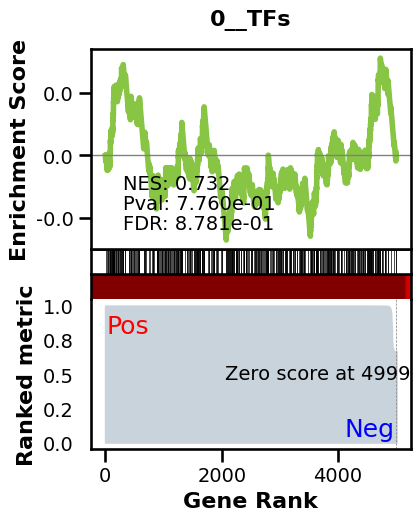

_________________________________________
TF specific enrichment


found some significant results for  14.545454545454545 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3538 genes
intersection pct: 0.7076
precision:  0.0015724456206874184 
recall:  1.0 
random precision: 0.0015728901911201826



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 54.09it/s]


  9%|▉         | 12/128 [00:00<00:02, 54.00it/s]


 14%|█▍        | 18/128 [00:00<00:02, 54.03it/s]


 19%|█▉        | 24/128 [00:00<00:01, 54.05it/s]


 23%|██▎       | 30/128 [00:00<00:01, 54.00it/s]


 28%|██▊       | 36/128 [00:00<00:01, 53.97it/s]


 33%|███▎      | 42/128 [00:00<00:01, 53.96it/s]


 38%|███▊      | 48/128 [00:00<00:01, 53.96it/s]


 42%|████▏     | 54/128 [00:01<00:01, 53.94it/s]


 47%|████▋     | 60/128 [00:01<00:01, 53.97it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 54.00it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 53.99it/s]


 61%|██████    | 78/128 [00:01<00:00, 53.97it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 53.99it/s]


 70%|███████   | 90/128 [00:01<00:00, 53.97it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 53.97it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 53.97it/s]


 84%|████████▍ | 108/128 [00:02<00:00, 54.01it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 54.05it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 54.01it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 53.97it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 53.96it/s]

Average Precision (AP):  0.0020381658248595524
Area Under Precision-Recall Curve (AUPRC):  0.002032308960959235
EPR: 2.0089823089392


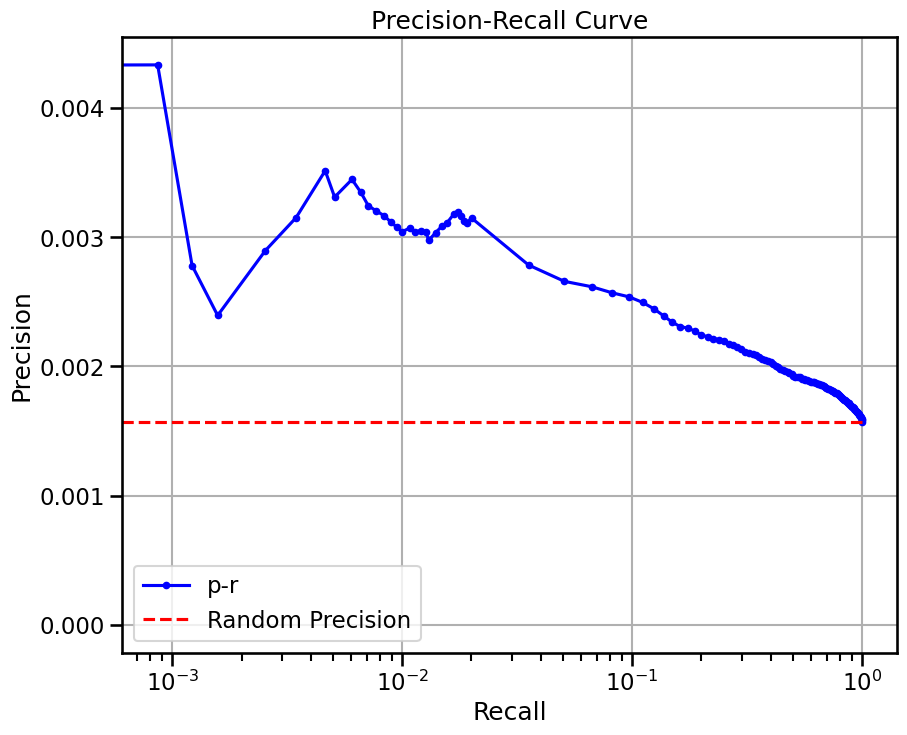

base enrichment


Top central genes: []


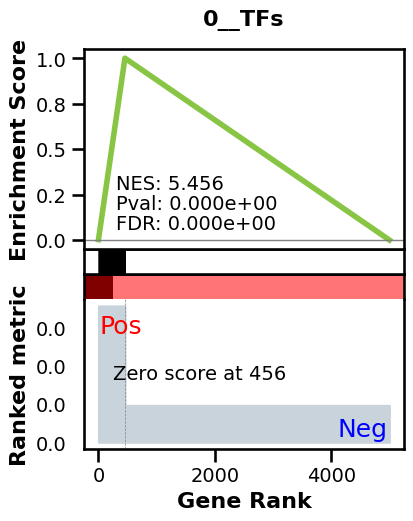

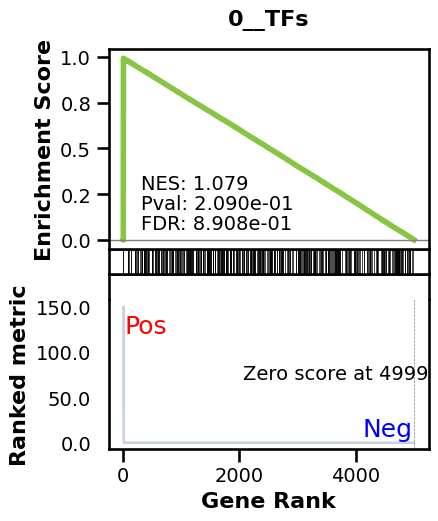

_________________________________________
TF specific enrichment


found some significant results for  7.2727272727272725 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3538 genes
intersection pct: 0.7076
precision:  0.007216602122232253 
recall:  0.5214652237971854 
random precision: 0.0015728901911201826



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 53.36it/s]


  9%|▉         | 12/128 [00:00<00:02, 53.35it/s]


 14%|█▍        | 18/128 [00:00<00:02, 53.47it/s]


 19%|█▉        | 24/128 [00:00<00:01, 53.39it/s]


 23%|██▎       | 30/128 [00:00<00:01, 53.45it/s]


 28%|██▊       | 36/128 [00:00<00:01, 53.46it/s]


 33%|███▎      | 42/128 [00:00<00:01, 53.39it/s]


 38%|███▊      | 48/128 [00:00<00:01, 53.37it/s]


 42%|████▏     | 54/128 [00:01<00:01, 53.41it/s]


 47%|████▋     | 60/128 [00:01<00:01, 53.42it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 53.29it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 53.35it/s]


 61%|██████    | 78/128 [00:01<00:00, 53.39it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 53.41it/s]


 70%|███████   | 90/128 [00:01<00:00, 53.28it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 53.33it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 53.36it/s]


 84%|████████▍ | 108/128 [00:02<00:00, 53.20it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 53.10it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 53.19it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 53.26it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 53.29it/s]

Average Precision (AP):  0.006142174071692528
Area Under Precision-Recall Curve (AUPRC):  0.00573239588002909
EPR: 9.073572668362264


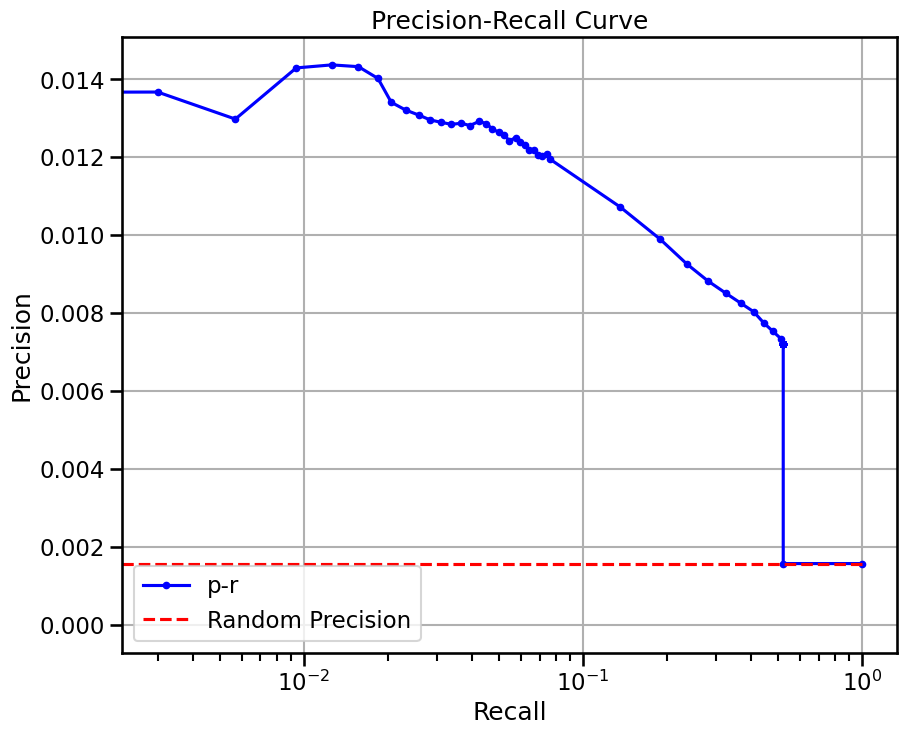


  0%|          | 0/11 [00:00<?, ?it/s]


  9%|▉         | 1/11 [00:02<00:22,  2.29s/it]


 18%|█▊        | 2/11 [00:03<00:12,  1.39s/it]


 27%|██▋       | 3/11 [00:03<00:08,  1.10s/it]


 36%|███▋      | 4/11 [00:04<00:06,  1.04it/s]


 45%|████▌     | 5/11 [00:05<00:05,  1.14it/s]


 55%|█████▍    | 6/11 [00:06<00:04,  1.21it/s]


 64%|██████▎   | 7/11 [00:06<00:03,  1.23it/s]


 73%|███████▎  | 8/11 [00:07<00:02,  1.27it/s]


 82%|████████▏ | 9/11 [00:08<00:01,  1.30it/s]


 91%|█████████ | 10/11 [00:09<00:00,  1.32it/s]


100%|██████████| 11/11 [00:09<00:00,  1.34it/s]


100%|██████████| 11/11 [00:09<00:00,  1.12it/s]

avg link count: 536246649, sparsity: 1.0


base enrichment


too many genes for central computation


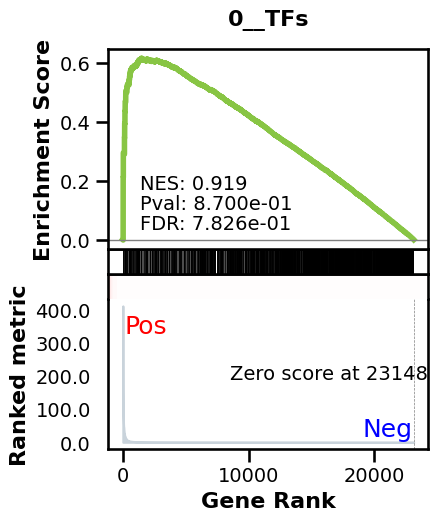

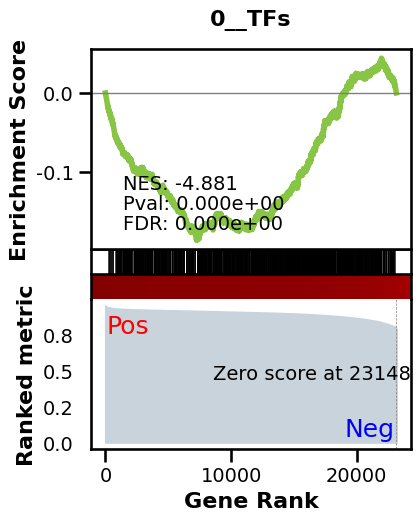

_________________________________________
TF specific enrichment


found some significant results for  64.28571428571429 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12455 genes
intersection pct: 0.5380362002678302


precision:  0.0008896322223674437 
recall:  1.0 
random precision: 0.0008897036558203398



  0%|          | 0/128 [00:00<?, ?it/s]


  1%|          | 1/128 [00:00<00:28,  4.40it/s]


  2%|▏         | 2/128 [00:00<00:28,  4.38it/s]


  2%|▏         | 3/128 [00:00<00:28,  4.37it/s]


  3%|▎         | 4/128 [00:00<00:28,  4.37it/s]


  4%|▍         | 5/128 [00:01<00:28,  4.37it/s]


  5%|▍         | 6/128 [00:01<00:27,  4.36it/s]


  5%|▌         | 7/128 [00:01<00:27,  4.36it/s]


  6%|▋         | 8/128 [00:01<00:27,  4.36it/s]


  7%|▋         | 9/128 [00:02<00:27,  4.37it/s]


  8%|▊         | 10/128 [00:02<00:26,  4.37it/s]


  9%|▊         | 11/128 [00:02<00:26,  4.37it/s]


  9%|▉         | 12/128 [00:02<00:26,  4.37it/s]


 10%|█         | 13/128 [00:02<00:26,  4.37it/s]


 11%|█         | 14/128 [00:03<00:26,  4.37it/s]


 12%|█▏        | 15/128 [00:03<00:25,  4.37it/s]


 12%|█▎        | 16/128 [00:03<00:25,  4.36it/s]


 13%|█▎        | 17/128 [00:03<00:25,  4.37it/s]


 14%|█▍        | 18/128 [00:04<00:25,  4.37it/s]


 15%|█▍        | 19/128 [00:04<00:24,  4.36it/s]


 16%|█▌        | 20/128 [00:04<00:24,  4.36it/s]


 16%|█▋        | 21/128 [00:04<00:24,  4.37it/s]


 17%|█▋        | 22/128 [00:05<00:24,  4.37it/s]


 18%|█▊        | 23/128 [00:05<00:24,  4.37it/s]


 19%|█▉        | 24/128 [00:05<00:23,  4.36it/s]


 20%|█▉        | 25/128 [00:05<00:23,  4.36it/s]


 20%|██        | 26/128 [00:05<00:23,  4.36it/s]


 21%|██        | 27/128 [00:06<00:23,  4.37it/s]


 22%|██▏       | 28/128 [00:06<00:22,  4.37it/s]


 23%|██▎       | 29/128 [00:06<00:22,  4.37it/s]


 23%|██▎       | 30/128 [00:06<00:22,  4.37it/s]


 24%|██▍       | 31/128 [00:07<00:22,  4.37it/s]


 25%|██▌       | 32/128 [00:07<00:21,  4.37it/s]


 26%|██▌       | 33/128 [00:07<00:21,  4.37it/s]


 27%|██▋       | 34/128 [00:07<00:21,  4.37it/s]


 27%|██▋       | 35/128 [00:08<00:21,  4.37it/s]


 28%|██▊       | 36/128 [00:08<00:21,  4.37it/s]


 29%|██▉       | 37/128 [00:08<00:20,  4.37it/s]


 30%|██▉       | 38/128 [00:08<00:20,  4.38it/s]


 30%|███       | 39/128 [00:08<00:20,  4.37it/s]


 31%|███▏      | 40/128 [00:09<00:20,  4.37it/s]


 32%|███▏      | 41/128 [00:09<00:19,  4.37it/s]


 33%|███▎      | 42/128 [00:09<00:19,  4.37it/s]


 34%|███▎      | 43/128 [00:09<00:19,  4.36it/s]


 34%|███▍      | 44/128 [00:10<00:19,  4.36it/s]


 35%|███▌      | 45/128 [00:10<00:19,  4.36it/s]


 36%|███▌      | 46/128 [00:10<00:18,  4.36it/s]


 37%|███▋      | 47/128 [00:10<00:18,  4.37it/s]


 38%|███▊      | 48/128 [00:10<00:18,  4.37it/s]


 38%|███▊      | 49/128 [00:11<00:18,  4.37it/s]


 39%|███▉      | 50/128 [00:11<00:17,  4.37it/s]


 40%|███▉      | 51/128 [00:11<00:17,  4.37it/s]


 41%|████      | 52/128 [00:11<00:17,  4.37it/s]


 41%|████▏     | 53/128 [00:12<00:17,  4.37it/s]


 42%|████▏     | 54/128 [00:12<00:16,  4.37it/s]


 43%|████▎     | 55/128 [00:12<00:16,  4.37it/s]


 44%|████▍     | 56/128 [00:12<00:16,  4.37it/s]


 45%|████▍     | 57/128 [00:13<00:16,  4.37it/s]


 45%|████▌     | 58/128 [00:13<00:16,  4.37it/s]


 46%|████▌     | 59/128 [00:13<00:15,  4.37it/s]


 47%|████▋     | 60/128 [00:13<00:15,  4.37it/s]


 48%|████▊     | 61/128 [00:13<00:15,  4.37it/s]


 48%|████▊     | 62/128 [00:14<00:15,  4.36it/s]


 49%|████▉     | 63/128 [00:14<00:14,  4.37it/s]


 50%|█████     | 64/128 [00:14<00:14,  4.37it/s]


 51%|█████     | 65/128 [00:14<00:14,  4.37it/s]


 52%|█████▏    | 66/128 [00:15<00:14,  4.37it/s]


 52%|█████▏    | 67/128 [00:15<00:13,  4.38it/s]


 53%|█████▎    | 68/128 [00:15<00:13,  4.37it/s]


 54%|█████▍    | 69/128 [00:15<00:13,  4.37it/s]


 55%|█████▍    | 70/128 [00:16<00:13,  4.37it/s]


 55%|█████▌    | 71/128 [00:16<00:13,  4.37it/s]


 56%|█████▋    | 72/128 [00:16<00:12,  4.37it/s]


 57%|█████▋    | 73/128 [00:16<00:12,  4.37it/s]


 58%|█████▊    | 74/128 [00:16<00:12,  4.37it/s]


 59%|█████▊    | 75/128 [00:17<00:12,  4.37it/s]


 59%|█████▉    | 76/128 [00:17<00:11,  4.38it/s]


 60%|██████    | 77/128 [00:17<00:11,  4.37it/s]


 61%|██████    | 78/128 [00:17<00:11,  4.37it/s]


 62%|██████▏   | 79/128 [00:18<00:11,  4.36it/s]


 62%|██████▎   | 80/128 [00:18<00:10,  4.37it/s]


 63%|██████▎   | 81/128 [00:18<00:10,  4.36it/s]


 64%|██████▍   | 82/128 [00:18<00:10,  4.36it/s]


 65%|██████▍   | 83/128 [00:18<00:10,  4.36it/s]


 66%|██████▌   | 84/128 [00:19<00:10,  4.36it/s]


 66%|██████▋   | 85/128 [00:19<00:09,  4.37it/s]


 67%|██████▋   | 86/128 [00:19<00:09,  4.37it/s]


 68%|██████▊   | 87/128 [00:19<00:09,  4.37it/s]


 69%|██████▉   | 88/128 [00:20<00:09,  4.37it/s]


 70%|██████▉   | 89/128 [00:20<00:08,  4.37it/s]


 70%|███████   | 90/128 [00:20<00:08,  4.37it/s]


 71%|███████   | 91/128 [00:20<00:08,  4.38it/s]


 72%|███████▏  | 92/128 [00:21<00:08,  4.37it/s]


 73%|███████▎  | 93/128 [00:21<00:08,  4.37it/s]


 73%|███████▎  | 94/128 [00:21<00:07,  4.37it/s]


 74%|███████▍  | 95/128 [00:21<00:07,  4.38it/s]


 75%|███████▌  | 96/128 [00:21<00:07,  4.37it/s]


 76%|███████▌  | 97/128 [00:22<00:07,  4.37it/s]


 77%|███████▋  | 98/128 [00:22<00:06,  4.37it/s]


 77%|███████▋  | 99/128 [00:22<00:06,  4.37it/s]


 78%|███████▊  | 100/128 [00:22<00:06,  4.37it/s]


 79%|███████▉  | 101/128 [00:23<00:06,  4.36it/s]


 80%|███████▉  | 102/128 [00:23<00:05,  4.37it/s]


 80%|████████  | 103/128 [00:23<00:05,  4.37it/s]


 81%|████████▏ | 104/128 [00:23<00:05,  4.37it/s]


 82%|████████▏ | 105/128 [00:24<00:05,  4.36it/s]


 83%|████████▎ | 106/128 [00:24<00:05,  4.35it/s]


 84%|████████▎ | 107/128 [00:24<00:04,  4.36it/s]


 84%|████████▍ | 108/128 [00:24<00:04,  4.36it/s]


 85%|████████▌ | 109/128 [00:24<00:04,  4.37it/s]


 86%|████████▌ | 110/128 [00:25<00:04,  4.36it/s]


 87%|████████▋ | 111/128 [00:25<00:03,  4.37it/s]


 88%|████████▊ | 112/128 [00:25<00:03,  4.38it/s]


 88%|████████▊ | 113/128 [00:25<00:03,  4.39it/s]


 89%|████████▉ | 114/128 [00:26<00:03,  4.40it/s]


 90%|████████▉ | 115/128 [00:26<00:02,  4.40it/s]


 91%|█████████ | 116/128 [00:26<00:02,  4.41it/s]


 91%|█████████▏| 117/128 [00:26<00:02,  4.39it/s]


 92%|█████████▏| 118/128 [00:27<00:02,  4.38it/s]


 93%|█████████▎| 119/128 [00:27<00:02,  4.37it/s]


 94%|█████████▍| 120/128 [00:27<00:01,  4.36it/s]


 95%|█████████▍| 121/128 [00:27<00:01,  4.36it/s]


 95%|█████████▌| 122/128 [00:27<00:01,  4.36it/s]


 96%|█████████▌| 123/128 [00:28<00:01,  4.35it/s]


 97%|█████████▋| 124/128 [00:28<00:00,  4.35it/s]


 98%|█████████▊| 125/128 [00:28<00:00,  4.35it/s]


 98%|█████████▊| 126/128 [00:28<00:00,  4.35it/s]


 99%|█████████▉| 127/128 [00:29<00:00,  4.36it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()



100%|██████████| 128/128 [00:29<00:00,  4.36it/s]


100%|██████████| 128/128 [00:29<00:00,  4.37it/s]

Average Precision (AP):  0.0010261974186718086
Area Under Precision-Recall Curve (AUPRC):  0.0010253520951744625


EPR: 1.499893287271485


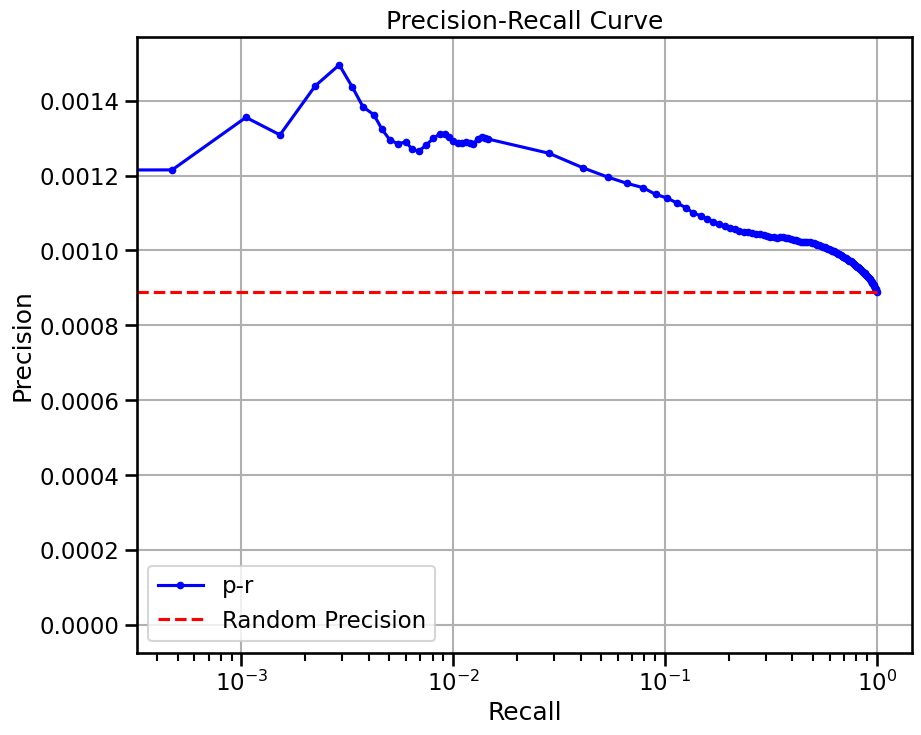


  0%|          | 0/22 [00:00<?, ?it/s]


  5%|▍         | 1/22 [00:02<00:58,  2.78s/it]


  9%|▉         | 2/22 [00:04<00:39,  1.96s/it]


 14%|█▎        | 3/22 [00:05<00:31,  1.66s/it]


 18%|█▊        | 4/22 [00:06<00:27,  1.51s/it]


 23%|██▎       | 5/22 [00:08<00:24,  1.42s/it]


 27%|██▋       | 6/22 [00:09<00:22,  1.40s/it]


 32%|███▏      | 7/22 [00:10<00:20,  1.39s/it]


 36%|███▋      | 8/22 [00:12<00:18,  1.35s/it]


 41%|████      | 9/22 [00:13<00:17,  1.35s/it]


 45%|████▌     | 10/22 [00:14<00:16,  1.36s/it]


 50%|█████     | 11/22 [00:16<00:14,  1.34s/it]


 55%|█████▍    | 12/22 [00:17<00:13,  1.32s/it]


 59%|█████▉    | 13/22 [00:18<00:11,  1.31s/it]


 64%|██████▎   | 14/22 [00:19<00:10,  1.30s/it]


 68%|██████▊   | 15/22 [00:21<00:09,  1.29s/it]


 73%|███████▎  | 16/22 [00:22<00:07,  1.29s/it]


 77%|███████▋  | 17/22 [00:23<00:06,  1.29s/it]


 82%|████████▏ | 18/22 [00:24<00:05,  1.28s/it]


 86%|████████▋ | 19/22 [00:26<00:03,  1.28s/it]


 91%|█████████ | 20/22 [00:27<00:02,  1.28s/it]


 95%|█████████▌| 21/22 [00:28<00:01,  1.28s/it]


100%|██████████| 22/22 [00:30<00:00,  1.26s/it]


100%|██████████| 22/22 [00:30<00:00,  1.37s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


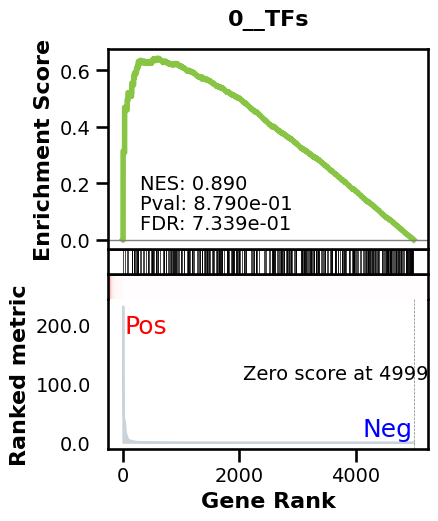

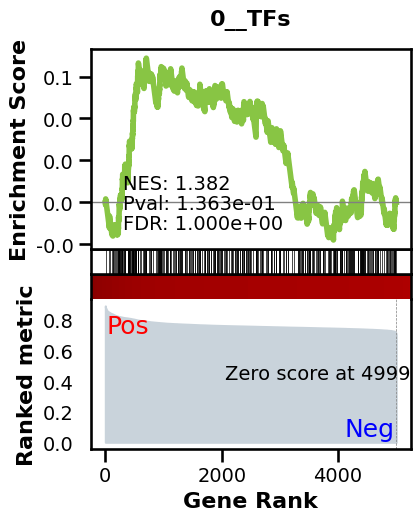

_________________________________________
TF specific enrichment


found some significant results for  22.916666666666668 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3511 genes
intersection pct: 0.7022
precision:  0.0014142799441978382 
recall:  1.0 
random precision: 0.001414682872956869



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 56.58it/s]


  9%|▉         | 12/128 [00:00<00:02, 56.57it/s]


 14%|█▍        | 18/128 [00:00<00:01, 56.51it/s]


 19%|█▉        | 24/128 [00:00<00:01, 56.48it/s]


 23%|██▎       | 30/128 [00:00<00:01, 56.56it/s]


 28%|██▊       | 36/128 [00:00<00:01, 56.60it/s]


 33%|███▎      | 42/128 [00:00<00:01, 56.59it/s]


 38%|███▊      | 48/128 [00:00<00:01, 56.05it/s]


 42%|████▏     | 54/128 [00:00<00:01, 56.16it/s]


 47%|████▋     | 60/128 [00:01<00:01, 56.16it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 56.24it/s]


 56%|█████▋    | 72/128 [00:01<00:00, 56.16it/s]


 61%|██████    | 78/128 [00:01<00:00, 56.12it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 56.21it/s]


 70%|███████   | 90/128 [00:01<00:00, 56.29it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 56.46it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 56.33it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 56.45it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 56.55it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 56.60it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 56.62it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 56.38it/s]

Average Precision (AP):  0.001523750665976051
Area Under Precision-Recall Curve (AUPRC):  0.00152182807740365


EPR: 1.1764091504742658


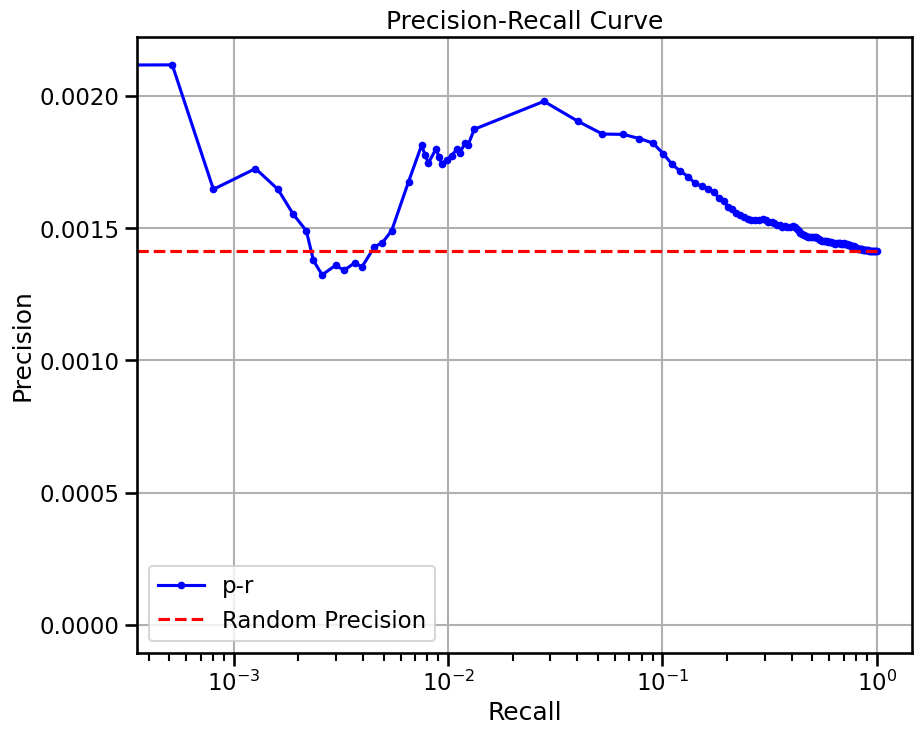

base enrichment


Top central genes: []


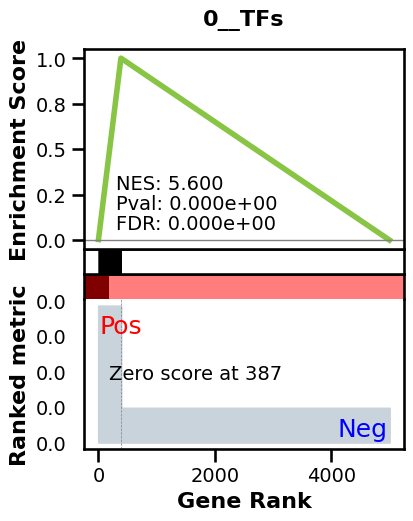

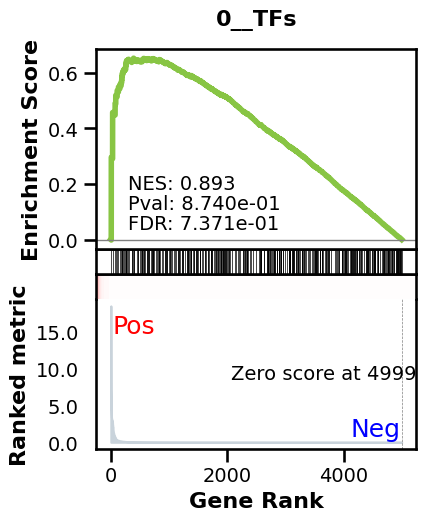

_________________________________________
TF specific enrichment


found some significant results for  4.166666666666667 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3511 genes
intersection pct: 0.7022
precision:  0.007612673505194292 
recall:  0.50745669381668 
random precision: 0.001414682872956869



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 55.18it/s]


  9%|▉         | 12/128 [00:00<00:02, 55.11it/s]


 14%|█▍        | 18/128 [00:00<00:02, 54.81it/s]


 19%|█▉        | 24/128 [00:00<00:01, 54.94it/s]


 23%|██▎       | 30/128 [00:00<00:01, 54.99it/s]


 28%|██▊       | 36/128 [00:00<00:01, 55.02it/s]


 33%|███▎      | 42/128 [00:00<00:01, 55.09it/s]


 38%|███▊      | 48/128 [00:00<00:01, 55.16it/s]


 42%|████▏     | 54/128 [00:00<00:01, 55.16it/s]


 47%|████▋     | 60/128 [00:01<00:01, 55.21it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 55.19it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 54.84it/s]


 61%|██████    | 78/128 [00:01<00:00, 54.91it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 55.01it/s]


 70%|███████   | 90/128 [00:01<00:00, 55.09it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 55.04it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 55.08it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 55.11it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 55.20it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 55.12it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 55.11it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 55.04it/s]

Average Precision (AP):  0.005632885394632145
Area Under Precision-Recall Curve (AUPRC):  0.005065184535349827
EPR: 9.123769079747344


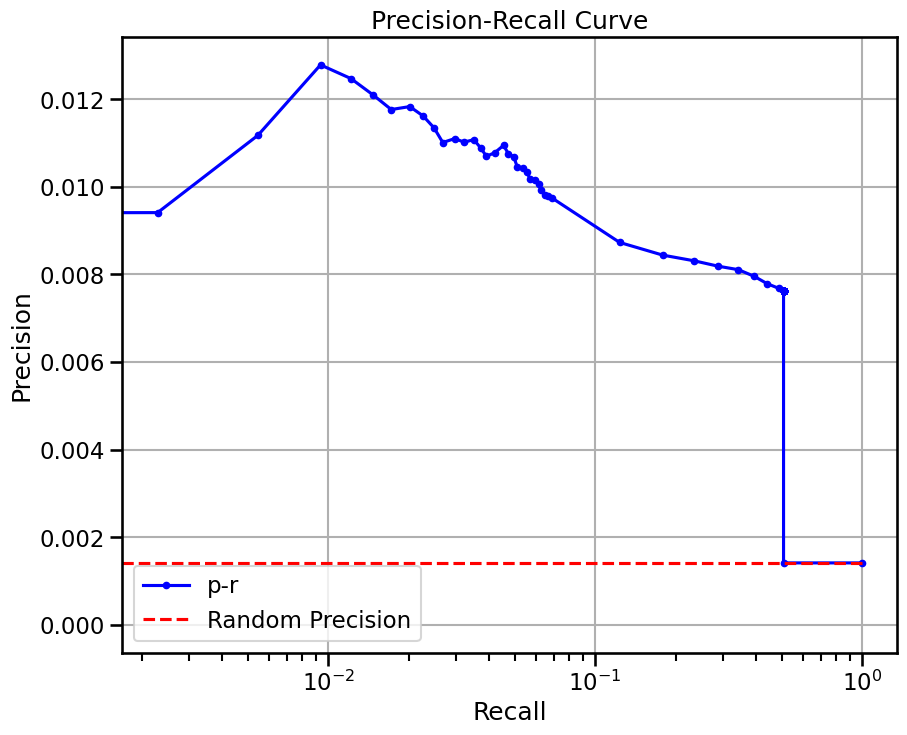

base enrichment


Top central genes: []
The DataFrame contains only the same values.


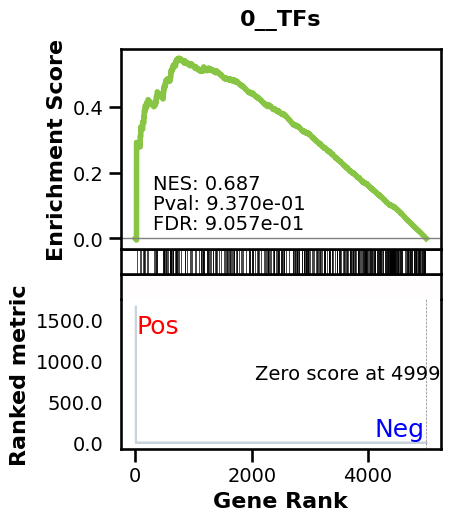

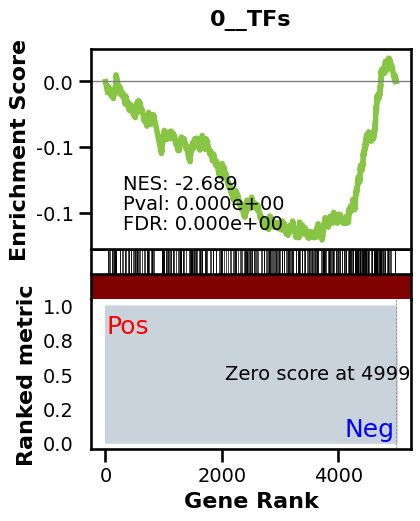

_________________________________________
TF specific enrichment


found some significant results for  8.333333333333334 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3511 genes
intersection pct: 0.7022
precision:  0.0014142799441978382 
recall:  1.0 
random precision: 0.001414682872956869



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 55.36it/s]


  9%|▉         | 12/128 [00:00<00:02, 55.51it/s]


 14%|█▍        | 18/128 [00:00<00:01, 55.63it/s]


 19%|█▉        | 24/128 [00:00<00:01, 55.67it/s]


 23%|██▎       | 30/128 [00:00<00:01, 55.64it/s]


 28%|██▊       | 36/128 [00:00<00:01, 55.63it/s]


 33%|███▎      | 42/128 [00:00<00:01, 55.59it/s]


 38%|███▊      | 48/128 [00:00<00:01, 55.55it/s]


 42%|████▏     | 54/128 [00:00<00:01, 55.61it/s]


 47%|████▋     | 60/128 [00:01<00:01, 55.64it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 55.67it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 55.64it/s]


 61%|██████    | 78/128 [00:01<00:00, 55.63it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 55.62it/s]


 70%|███████   | 90/128 [00:01<00:00, 55.62it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 55.64it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 55.64it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 55.69it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 55.50it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 55.48it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 55.52it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 55.57it/s]

Average Precision (AP):  0.0018704413892922237
Area Under Precision-Recall Curve (AUPRC):  0.0018685022603467556
EPR: 1.7471423519160048


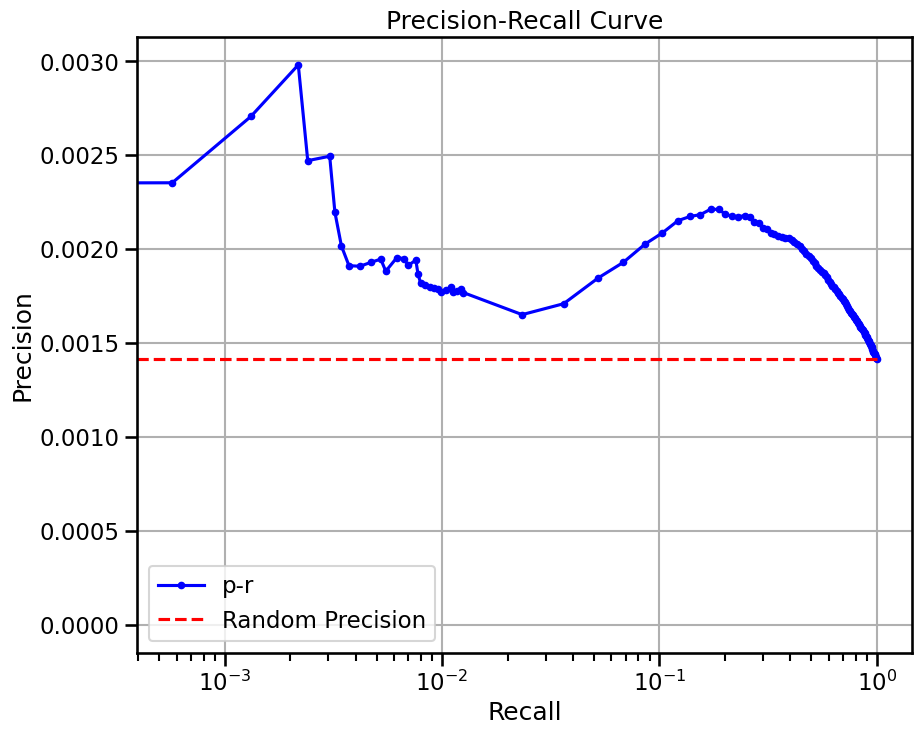

base enrichment


Top central genes: []


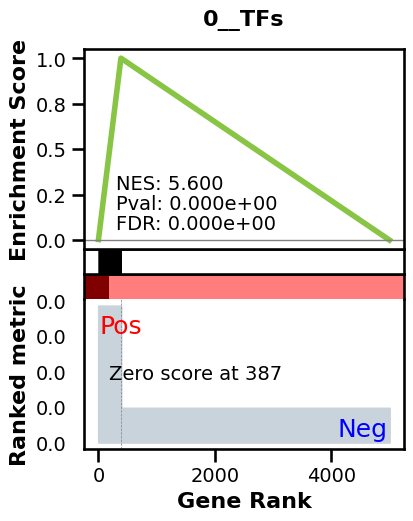

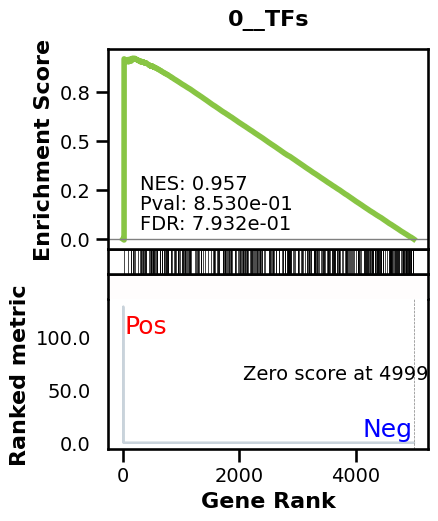

_________________________________________
TF specific enrichment


found some significant results for  2.0833333333333335 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3511 genes
intersection pct: 0.7022
precision:  0.007612673505194292 
recall:  0.50745669381668 
random precision: 0.001414682872956869



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 55.40it/s]


  9%|▉         | 12/128 [00:00<00:02, 55.33it/s]


 14%|█▍        | 18/128 [00:00<00:01, 55.34it/s]


 19%|█▉        | 24/128 [00:00<00:01, 55.37it/s]


 23%|██▎       | 30/128 [00:00<00:01, 55.39it/s]


 28%|██▊       | 36/128 [00:00<00:01, 55.41it/s]


 33%|███▎      | 42/128 [00:00<00:01, 55.34it/s]


 38%|███▊      | 48/128 [00:00<00:01, 55.36it/s]


 42%|████▏     | 54/128 [00:00<00:01, 55.35it/s]


 47%|████▋     | 60/128 [00:01<00:01, 55.36it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 55.41it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 55.39it/s]


 61%|██████    | 78/128 [00:01<00:00, 55.41it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 55.41it/s]


 70%|███████   | 90/128 [00:01<00:00, 55.45it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 55.47it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 55.46it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 55.52it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 55.45it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 55.41it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 55.41it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 55.37it/s]

Average Precision (AP):  0.007888346985998947
Area Under Precision-Recall Curve (AUPRC):  0.0072502405470152385
EPR: 16.012405615818103


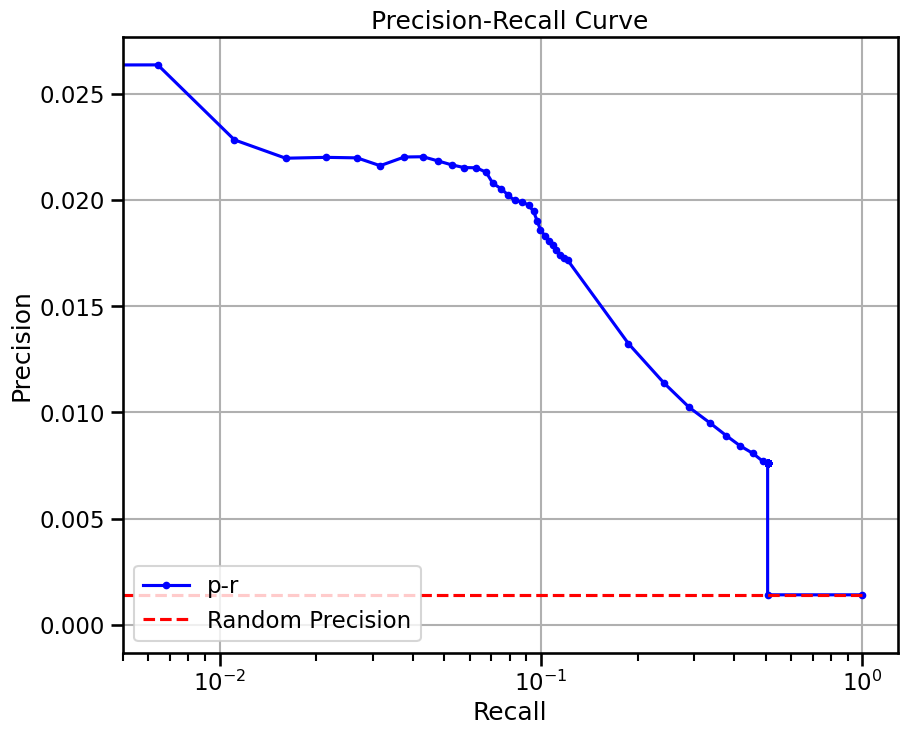


  0%|          | 0/2 [00:00<?, ?it/s]


 50%|█████     | 1/2 [00:02<00:02,  2.14s/it]


100%|██████████| 2/2 [00:02<00:00,  1.09s/it]


100%|██████████| 2/2 [00:02<00:00,  1.32s/it]

avg link count: 488410000, sparsity: 1.0


base enrichment


too many genes for central computation


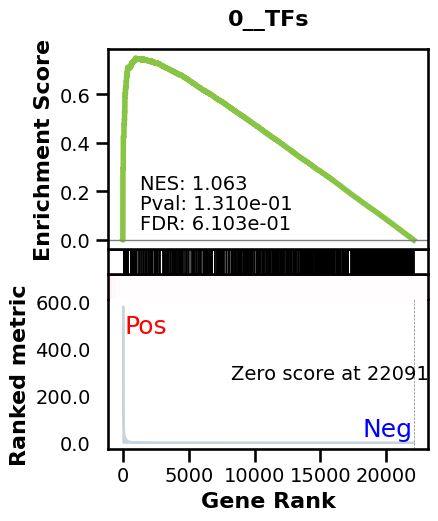

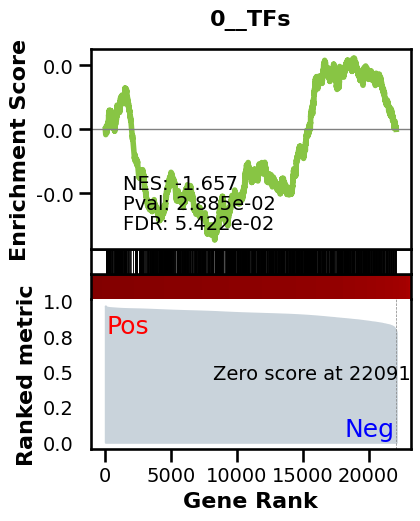

_________________________________________
TF specific enrichment


found some significant results for  57.79816513761468 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12032 genes
intersection pct: 0.5446315408292595


precision:  0.000903667071762534 
recall:  1.0 
random precision: 0.0009037421833136737



  0%|          | 0/128 [00:00<?, ?it/s]


  1%|          | 1/128 [00:00<00:31,  4.08it/s]


  2%|▏         | 2/128 [00:00<00:31,  4.06it/s]


  2%|▏         | 3/128 [00:00<00:30,  4.04it/s]


  3%|▎         | 4/128 [00:00<00:30,  4.08it/s]


  4%|▍         | 5/128 [00:01<00:30,  4.08it/s]


  5%|▍         | 6/128 [00:01<00:30,  4.06it/s]


  5%|▌         | 7/128 [00:01<00:29,  4.05it/s]


  6%|▋         | 8/128 [00:01<00:29,  4.05it/s]


  7%|▋         | 9/128 [00:02<00:29,  4.05it/s]


  8%|▊         | 10/128 [00:02<00:29,  4.05it/s]


  9%|▊         | 11/128 [00:02<00:28,  4.06it/s]


  9%|▉         | 12/128 [00:02<00:28,  4.05it/s]


 10%|█         | 13/128 [00:03<00:28,  4.04it/s]


 11%|█         | 14/128 [00:03<00:28,  4.04it/s]


 12%|█▏        | 15/128 [00:03<00:27,  4.04it/s]


 12%|█▎        | 16/128 [00:03<00:27,  4.05it/s]


 13%|█▎        | 17/128 [00:04<00:27,  4.05it/s]


 14%|█▍        | 18/128 [00:04<00:27,  4.05it/s]


 15%|█▍        | 19/128 [00:04<00:26,  4.05it/s]


 16%|█▌        | 20/128 [00:04<00:26,  4.05it/s]


 16%|█▋        | 21/128 [00:05<00:26,  4.05it/s]


 17%|█▋        | 22/128 [00:05<00:26,  4.06it/s]


 18%|█▊        | 23/128 [00:05<00:25,  4.05it/s]


 19%|█▉        | 24/128 [00:05<00:25,  4.05it/s]


 20%|█▉        | 25/128 [00:06<00:25,  4.05it/s]


 20%|██        | 26/128 [00:06<00:25,  4.06it/s]


 21%|██        | 27/128 [00:06<00:24,  4.05it/s]


 22%|██▏       | 28/128 [00:06<00:24,  4.04it/s]


 23%|██▎       | 29/128 [00:07<00:24,  4.05it/s]


 23%|██▎       | 30/128 [00:07<00:24,  4.05it/s]


 24%|██▍       | 31/128 [00:07<00:23,  4.05it/s]


 25%|██▌       | 32/128 [00:07<00:23,  4.05it/s]


 26%|██▌       | 33/128 [00:08<00:23,  4.05it/s]


 27%|██▋       | 34/128 [00:08<00:23,  4.04it/s]


 27%|██▋       | 35/128 [00:08<00:23,  4.04it/s]


 28%|██▊       | 36/128 [00:08<00:22,  4.05it/s]


 29%|██▉       | 37/128 [00:09<00:22,  4.04it/s]


 30%|██▉       | 38/128 [00:09<00:22,  4.04it/s]


 30%|███       | 39/128 [00:09<00:22,  4.04it/s]


 31%|███▏      | 40/128 [00:09<00:21,  4.04it/s]


 32%|███▏      | 41/128 [00:10<00:21,  4.05it/s]


 33%|███▎      | 42/128 [00:10<00:21,  4.05it/s]


 34%|███▎      | 43/128 [00:10<00:21,  4.04it/s]


 34%|███▍      | 44/128 [00:10<00:20,  4.05it/s]


 35%|███▌      | 45/128 [00:11<00:20,  4.05it/s]


 36%|███▌      | 46/128 [00:11<00:20,  4.05it/s]


 37%|███▋      | 47/128 [00:11<00:19,  4.06it/s]


 38%|███▊      | 48/128 [00:11<00:19,  4.05it/s]


 38%|███▊      | 49/128 [00:12<00:19,  4.04it/s]


 39%|███▉      | 50/128 [00:12<00:19,  4.04it/s]


 40%|███▉      | 51/128 [00:12<00:19,  4.05it/s]


 41%|████      | 52/128 [00:12<00:18,  4.04it/s]


 41%|████▏     | 53/128 [00:13<00:18,  4.05it/s]


 42%|████▏     | 54/128 [00:13<00:18,  4.03it/s]


 43%|████▎     | 55/128 [00:13<00:18,  4.04it/s]


 44%|████▍     | 56/128 [00:13<00:17,  4.04it/s]


 45%|████▍     | 57/128 [00:14<00:17,  4.05it/s]


 45%|████▌     | 58/128 [00:14<00:17,  4.05it/s]


 46%|████▌     | 59/128 [00:14<00:17,  4.05it/s]


 47%|████▋     | 60/128 [00:14<00:16,  4.04it/s]


 48%|████▊     | 61/128 [00:15<00:16,  4.04it/s]


 48%|████▊     | 62/128 [00:15<00:16,  4.05it/s]


 49%|████▉     | 63/128 [00:15<00:15,  4.08it/s]


 50%|█████     | 64/128 [00:15<00:15,  4.06it/s]


 51%|█████     | 65/128 [00:16<00:15,  4.06it/s]


 52%|█████▏    | 66/128 [00:16<00:15,  4.06it/s]


 52%|█████▏    | 67/128 [00:16<00:15,  4.04it/s]


 53%|█████▎    | 68/128 [00:16<00:14,  4.04it/s]


 54%|█████▍    | 69/128 [00:17<00:14,  4.04it/s]


 55%|█████▍    | 70/128 [00:17<00:14,  4.03it/s]


 55%|█████▌    | 71/128 [00:17<00:14,  4.02it/s]


 56%|█████▋    | 72/128 [00:17<00:13,  4.02it/s]


 57%|█████▋    | 73/128 [00:18<00:13,  4.02it/s]


 58%|█████▊    | 74/128 [00:18<00:13,  4.02it/s]


 59%|█████▊    | 75/128 [00:18<00:13,  4.02it/s]


 59%|█████▉    | 76/128 [00:18<00:12,  4.02it/s]


 60%|██████    | 77/128 [00:19<00:12,  4.04it/s]


 61%|██████    | 78/128 [00:19<00:12,  4.05it/s]


 62%|██████▏   | 79/128 [00:19<00:12,  3.91it/s]


 62%|██████▎   | 80/128 [00:19<00:12,  3.95it/s]


 63%|██████▎   | 81/128 [00:20<00:11,  3.98it/s]


 64%|██████▍   | 82/128 [00:20<00:11,  4.00it/s]


 65%|██████▍   | 83/128 [00:20<00:11,  4.02it/s]


 66%|██████▌   | 84/128 [00:20<00:10,  4.03it/s]


 66%|██████▋   | 85/128 [00:21<00:10,  4.03it/s]


 67%|██████▋   | 86/128 [00:21<00:10,  4.04it/s]


 68%|██████▊   | 87/128 [00:21<00:10,  4.03it/s]


 69%|██████▉   | 88/128 [00:21<00:10,  3.97it/s]


 70%|██████▉   | 89/128 [00:22<00:09,  3.99it/s]


 70%|███████   | 90/128 [00:22<00:09,  4.00it/s]


 71%|███████   | 91/128 [00:22<00:09,  4.01it/s]


 72%|███████▏  | 92/128 [00:22<00:08,  4.02it/s]


 73%|███████▎  | 93/128 [00:23<00:08,  4.03it/s]


 73%|███████▎  | 94/128 [00:23<00:08,  4.03it/s]


 74%|███████▍  | 95/128 [00:23<00:08,  4.04it/s]


 75%|███████▌  | 96/128 [00:23<00:07,  4.04it/s]


 76%|███████▌  | 97/128 [00:24<00:07,  4.03it/s]


 77%|███████▋  | 98/128 [00:24<00:07,  4.03it/s]


 77%|███████▋  | 99/128 [00:24<00:07,  4.03it/s]


 78%|███████▊  | 100/128 [00:24<00:06,  4.03it/s]


 79%|███████▉  | 101/128 [00:25<00:06,  4.03it/s]


 80%|███████▉  | 102/128 [00:25<00:06,  4.02it/s]


 80%|████████  | 103/128 [00:25<00:06,  4.03it/s]


 81%|████████▏ | 104/128 [00:25<00:05,  4.04it/s]


 82%|████████▏ | 105/128 [00:26<00:05,  4.04it/s]


 83%|████████▎ | 106/128 [00:26<00:05,  4.03it/s]


 84%|████████▎ | 107/128 [00:26<00:05,  4.03it/s]


 84%|████████▍ | 108/128 [00:26<00:04,  4.04it/s]


 85%|████████▌ | 109/128 [00:26<00:04,  4.04it/s]


 86%|████████▌ | 110/128 [00:27<00:04,  4.05it/s]


 87%|████████▋ | 111/128 [00:27<00:04,  4.04it/s]


 88%|████████▊ | 112/128 [00:27<00:03,  4.05it/s]


 88%|████████▊ | 113/128 [00:27<00:03,  4.05it/s]


 89%|████████▉ | 114/128 [00:28<00:03,  4.05it/s]


 90%|████████▉ | 115/128 [00:28<00:03,  4.05it/s]


 91%|█████████ | 116/128 [00:28<00:02,  4.05it/s]


 91%|█████████▏| 117/128 [00:28<00:02,  4.05it/s]


 92%|█████████▏| 118/128 [00:29<00:02,  4.05it/s]


 93%|█████████▎| 119/128 [00:29<00:02,  4.05it/s]


 94%|█████████▍| 120/128 [00:29<00:01,  4.05it/s]


 95%|█████████▍| 121/128 [00:29<00:01,  4.05it/s]


 95%|█████████▌| 122/128 [00:30<00:01,  4.05it/s]


 96%|█████████▌| 123/128 [00:30<00:01,  4.05it/s]


 97%|█████████▋| 124/128 [00:30<00:00,  4.05it/s]


 98%|█████████▊| 125/128 [00:30<00:00,  4.05it/s]


 98%|█████████▊| 126/128 [00:31<00:00,  4.05it/s]


 99%|█████████▉| 127/128 [00:31<00:00,  4.05it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()



100%|██████████| 128/128 [00:31<00:00,  4.04it/s]


100%|██████████| 128/128 [00:31<00:00,  4.04it/s]

Average Precision (AP):  0.0010638911858811611
Area Under Precision-Recall Curve (AUPRC):  0.0010632158876705347


EPR: 1.7107235237118976


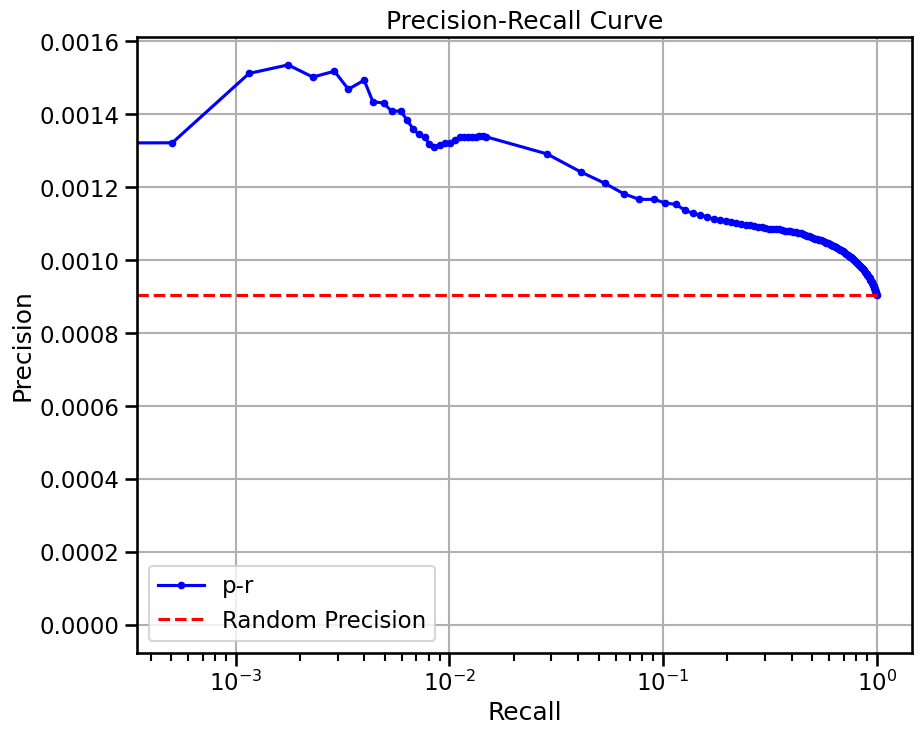


  0%|          | 0/3 [00:00<?, ?it/s]


 33%|███▎      | 1/3 [00:02<00:05,  2.63s/it]


 67%|██████▋   | 2/3 [00:03<00:01,  1.83s/it]


100%|██████████| 3/3 [00:05<00:00,  1.50s/it]


100%|██████████| 3/3 [00:05<00:00,  1.73s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


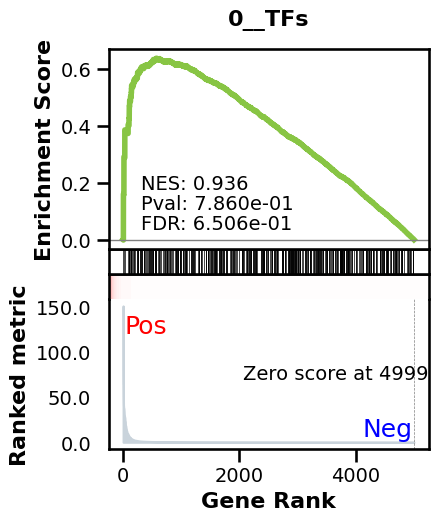

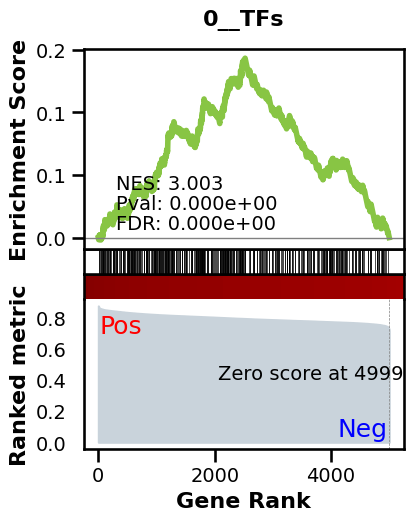

_________________________________________
TF specific enrichment


found some significant results for  28.571428571428573 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3536 genes
intersection pct: 0.7072
precision:  0.0013506038727708277 
recall:  1.0 
random precision: 0.0013509859389300276



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 55.58it/s]


  9%|▉         | 12/128 [00:00<00:02, 55.71it/s]


 14%|█▍        | 18/128 [00:00<00:01, 55.61it/s]


 19%|█▉        | 24/128 [00:00<00:01, 55.76it/s]


 23%|██▎       | 30/128 [00:00<00:01, 55.81it/s]


 28%|██▊       | 36/128 [00:00<00:01, 55.69it/s]


 33%|███▎      | 42/128 [00:00<00:01, 55.63it/s]


 38%|███▊      | 48/128 [00:00<00:01, 55.67it/s]


 42%|████▏     | 54/128 [00:00<00:01, 55.76it/s]


 47%|████▋     | 60/128 [00:01<00:01, 55.75it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 55.83it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 55.79it/s]


 61%|██████    | 78/128 [00:01<00:00, 55.91it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 55.85it/s]


 70%|███████   | 90/128 [00:01<00:00, 55.86it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 55.92it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 55.87it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 55.87it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 55.75it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 55.82it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 55.70it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 55.75it/s]

Average Precision (AP):  0.001501128218852228
Area Under Precision-Recall Curve (AUPRC):  0.0015010808477868317


EPR: 0.7007539009125866


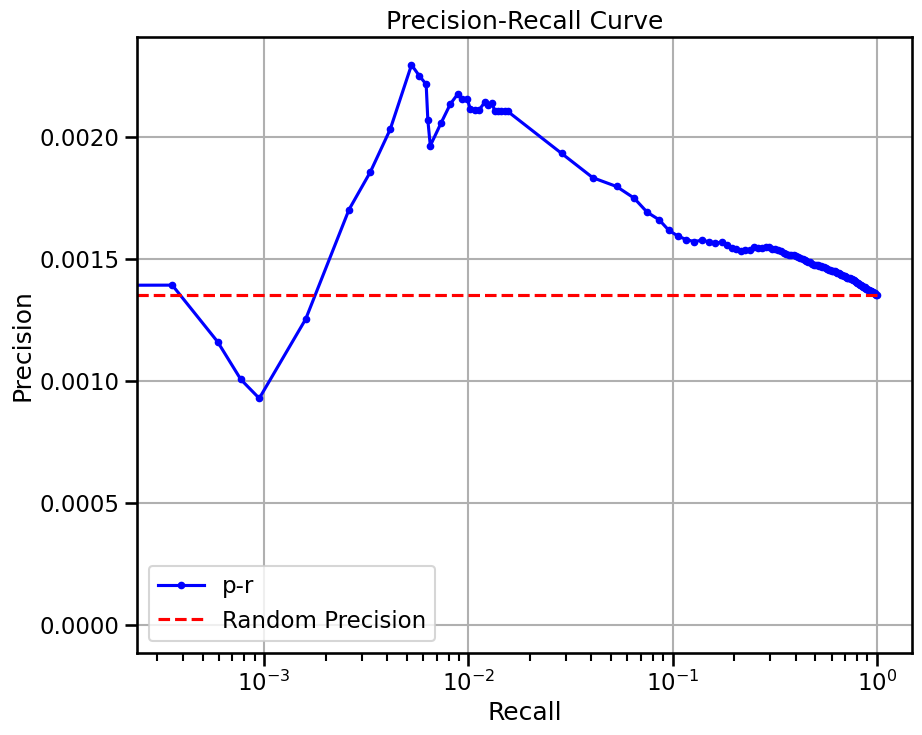

base enrichment


Top central genes: []


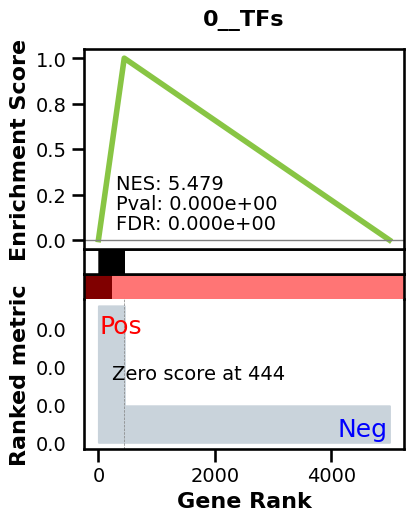

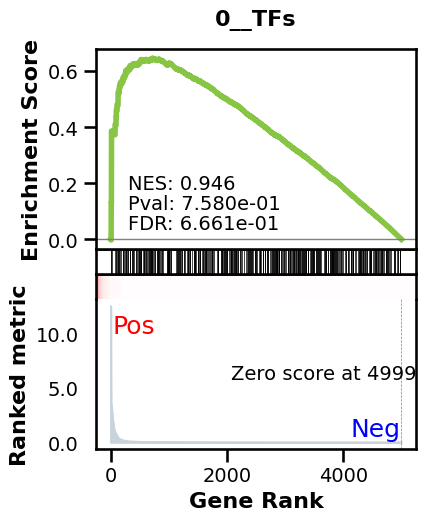

_________________________________________
TF specific enrichment


found some significant results for  14.285714285714286 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3536 genes
intersection pct: 0.7072
precision:  0.006564024211083035 
recall:  0.5291644460235684 
random precision: 0.0013509859389300276



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 54.75it/s]


  9%|▉         | 12/128 [00:00<00:02, 55.50it/s]


 14%|█▍        | 18/128 [00:00<00:01, 55.71it/s]


 19%|█▉        | 24/128 [00:00<00:01, 55.76it/s]


 23%|██▎       | 30/128 [00:00<00:01, 55.85it/s]


 28%|██▊       | 36/128 [00:00<00:01, 55.68it/s]


 33%|███▎      | 42/128 [00:00<00:01, 55.68it/s]


 38%|███▊      | 48/128 [00:00<00:01, 55.72it/s]


 42%|████▏     | 54/128 [00:00<00:01, 55.78it/s]


 47%|████▋     | 60/128 [00:01<00:01, 55.87it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 55.90it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 55.85it/s]


 61%|██████    | 78/128 [00:01<00:00, 55.81it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 55.76it/s]


 70%|███████   | 90/128 [00:01<00:00, 55.79it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 55.83it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 55.56it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 55.62it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 55.66it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 55.71it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 55.69it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 55.70it/s]

Average Precision (AP):  0.005316303315693259
Area Under Precision-Recall Curve (AUPRC):  0.004813471944866269
EPR: 8.816314024356315


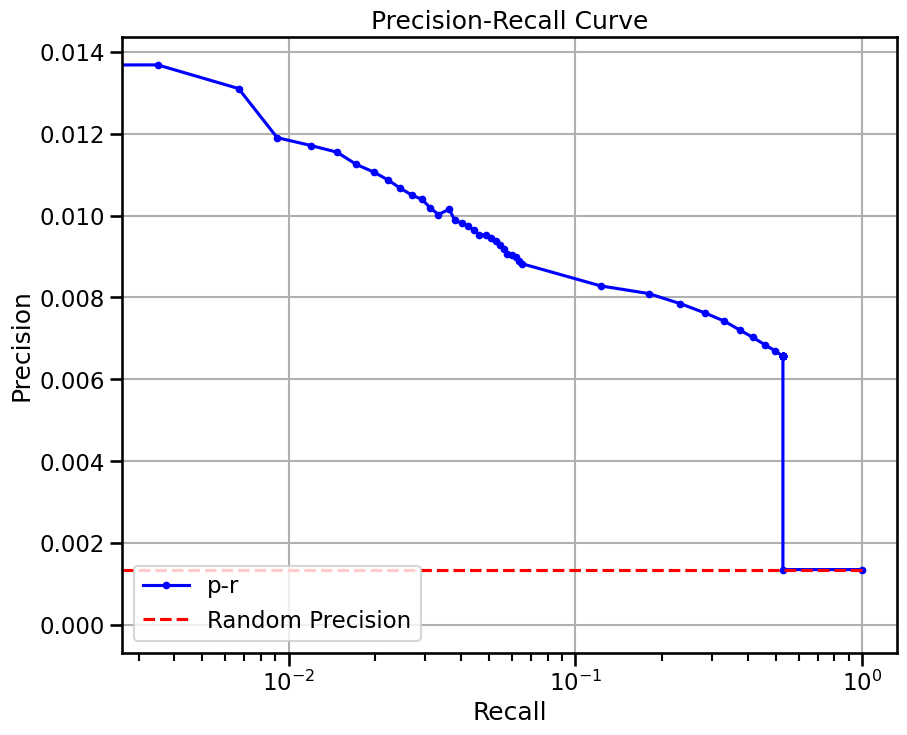

base enrichment


Top central genes: []
The DataFrame contains only the same values.


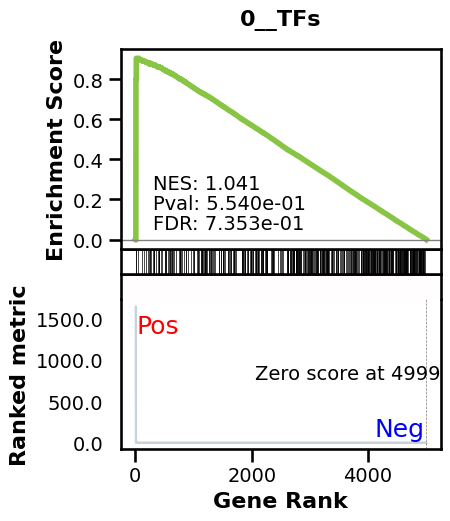

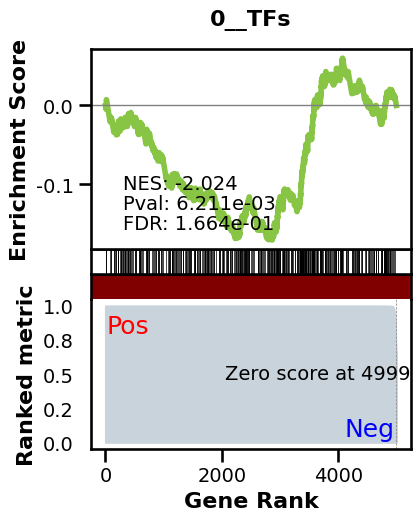

_________________________________________
TF specific enrichment


found some significant results for  11.904761904761905 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3536 genes
intersection pct: 0.7072
precision:  0.0013506038727708277 
recall:  1.0 
random precision: 0.0013509859389300276



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 54.59it/s]


  9%|▉         | 12/128 [00:00<00:02, 54.47it/s]


 14%|█▍        | 18/128 [00:00<00:02, 54.45it/s]


 19%|█▉        | 24/128 [00:00<00:01, 54.47it/s]


 23%|██▎       | 30/128 [00:00<00:01, 54.42it/s]


 28%|██▊       | 36/128 [00:00<00:01, 54.38it/s]


 33%|███▎      | 42/128 [00:00<00:01, 54.35it/s]


 38%|███▊      | 48/128 [00:00<00:01, 54.36it/s]


 42%|████▏     | 54/128 [00:00<00:01, 54.38it/s]


 47%|████▋     | 60/128 [00:01<00:01, 54.37it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 54.39it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 54.42it/s]


 61%|██████    | 78/128 [00:01<00:00, 54.41it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 54.43it/s]


 70%|███████   | 90/128 [00:01<00:00, 54.40it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 54.32it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 54.34it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 54.37it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 54.41it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 54.44it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 54.66it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 54.42it/s]

Average Precision (AP):  0.0020134495688915927
Area Under Precision-Recall Curve (AUPRC):  0.002008126922430076
EPR: 2.5529365914315325


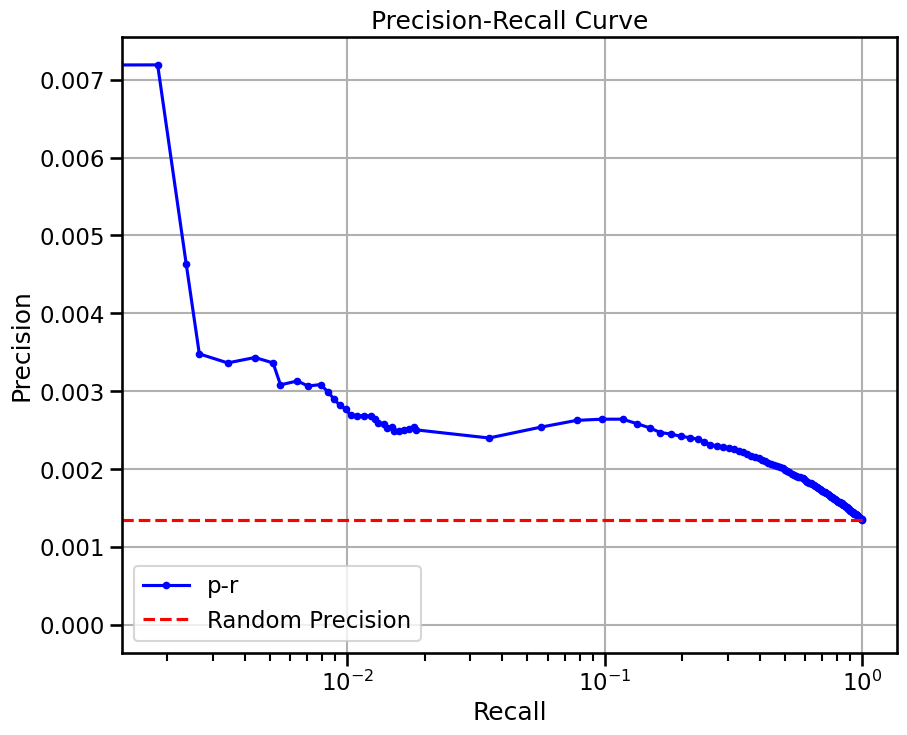

base enrichment


Top central genes: []


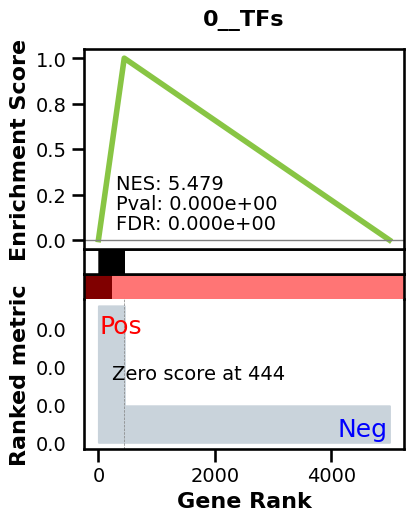

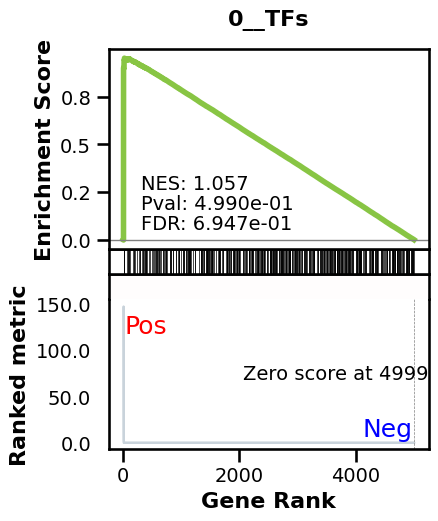

_________________________________________
TF specific enrichment


found some significant results for  9.523809523809524 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3536 genes
intersection pct: 0.7072
precision:  0.006564024211083035 
recall:  0.5291644460235684 
random precision: 0.0013509859389300276



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 55.21it/s]


  9%|▉         | 12/128 [00:00<00:02, 55.42it/s]


 14%|█▍        | 18/128 [00:00<00:01, 55.49it/s]


 19%|█▉        | 24/128 [00:00<00:01, 55.30it/s]


 23%|██▎       | 30/128 [00:00<00:01, 55.63it/s]


 28%|██▊       | 36/128 [00:00<00:01, 55.11it/s]


 33%|███▎      | 42/128 [00:00<00:01, 55.27it/s]


 38%|███▊      | 48/128 [00:00<00:01, 55.22it/s]


 42%|████▏     | 54/128 [00:00<00:01, 55.25it/s]


 47%|████▋     | 60/128 [00:01<00:01, 55.38it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 55.27it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 55.56it/s]


 61%|██████    | 78/128 [00:01<00:00, 55.37it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 55.50it/s]


 70%|███████   | 90/128 [00:01<00:00, 55.43it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 55.43it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 55.52it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 55.32it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 55.58it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 55.46it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 55.44it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 55.36it/s]

Average Precision (AP):  0.008155141902095412
Area Under Precision-Recall Curve (AUPRC):  0.007608480097048152
EPR: 20.229272014048046


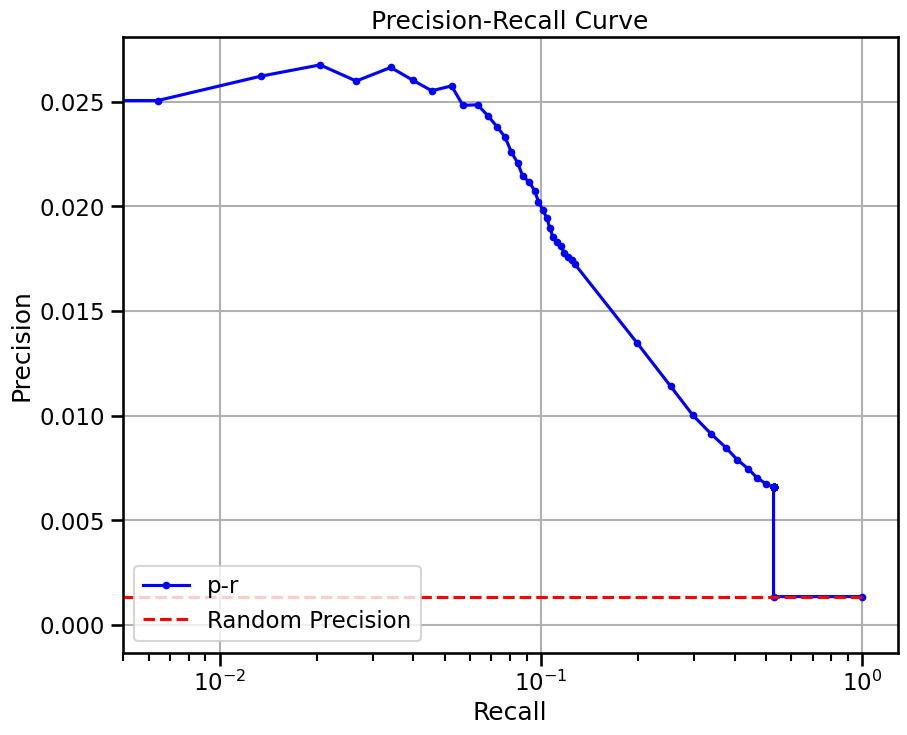


  0%|          | 0/8 [00:00<?, ?it/s]


 12%|█▎        | 1/8 [00:02<00:16,  2.35s/it]


 25%|██▌       | 2/8 [00:03<00:08,  1.41s/it]


 38%|███▊      | 3/8 [00:03<00:05,  1.11s/it]


 50%|█████     | 4/8 [00:04<00:03,  1.04it/s]


 62%|██████▎   | 5/8 [00:05<00:02,  1.13it/s]


 75%|███████▌  | 6/8 [00:06<00:01,  1.20it/s]


 88%|████████▊ | 7/8 [00:06<00:00,  1.24it/s]


100%|██████████| 8/8 [00:07<00:00,  1.30it/s]


100%|██████████| 8/8 [00:07<00:00,  1.04it/s]

avg link count: 536246649, sparsity: 1.0


base enrichment


too many genes for central computation


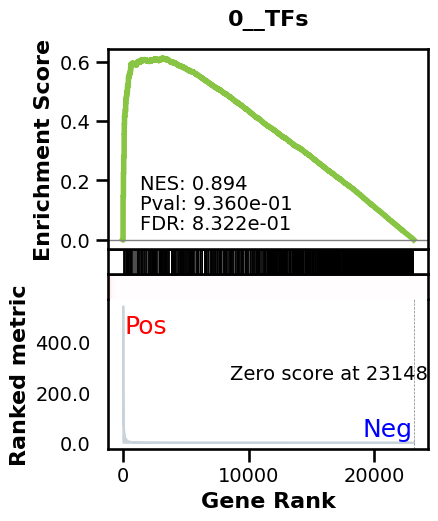

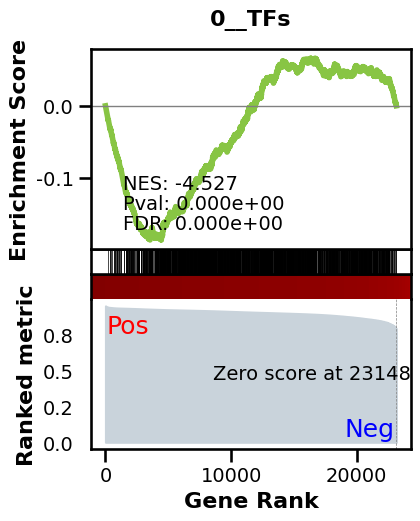

_________________________________________
TF specific enrichment


found some significant results for  67.85714285714286 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12455 genes
intersection pct: 0.5380362002678302


precision:  0.0008896322223674437 
recall:  1.0 
random precision: 0.0008897036558203398



  0%|          | 0/128 [00:00<?, ?it/s]


  1%|          | 1/128 [00:00<00:32,  3.85it/s]


  2%|▏         | 2/128 [00:00<00:30,  4.16it/s]


  2%|▏         | 3/128 [00:00<00:29,  4.27it/s]


  3%|▎         | 4/128 [00:00<00:28,  4.30it/s]


  4%|▍         | 5/128 [00:01<00:28,  4.35it/s]


  5%|▍         | 6/128 [00:01<00:27,  4.37it/s]


  5%|▌         | 7/128 [00:01<00:27,  4.36it/s]


  6%|▋         | 8/128 [00:01<00:27,  4.38it/s]


  7%|▋         | 9/128 [00:02<00:27,  4.35it/s]


  8%|▊         | 10/128 [00:02<00:26,  4.37it/s]


  9%|▊         | 11/128 [00:02<00:26,  4.37it/s]


  9%|▉         | 12/128 [00:02<00:26,  4.38it/s]


 10%|█         | 13/128 [00:02<00:26,  4.38it/s]


 11%|█         | 14/128 [00:03<00:25,  4.39it/s]


 12%|█▏        | 15/128 [00:03<00:25,  4.39it/s]


 12%|█▎        | 16/128 [00:03<00:25,  4.40it/s]


 13%|█▎        | 17/128 [00:03<00:25,  4.38it/s]


 14%|█▍        | 18/128 [00:04<00:25,  4.27it/s]


 15%|█▍        | 19/128 [00:04<00:25,  4.29it/s]


 16%|█▌        | 20/128 [00:04<00:24,  4.33it/s]


 16%|█▋        | 21/128 [00:04<00:24,  4.34it/s]


 17%|█▋        | 22/128 [00:05<00:24,  4.37it/s]


 18%|█▊        | 23/128 [00:05<00:24,  4.37it/s]


 19%|█▉        | 24/128 [00:05<00:23,  4.38it/s]


 20%|█▉        | 25/128 [00:05<00:23,  4.38it/s]


 20%|██        | 26/128 [00:05<00:23,  4.38it/s]


 21%|██        | 27/128 [00:06<00:23,  4.37it/s]


 22%|██▏       | 28/128 [00:06<00:22,  4.39it/s]


 23%|██▎       | 29/128 [00:06<00:22,  4.38it/s]


 23%|██▎       | 30/128 [00:06<00:22,  4.39it/s]


 24%|██▍       | 31/128 [00:07<00:22,  4.38it/s]


 25%|██▌       | 32/128 [00:07<00:21,  4.39it/s]


 26%|██▌       | 33/128 [00:07<00:21,  4.38it/s]


 27%|██▋       | 34/128 [00:07<00:21,  4.39it/s]


 27%|██▋       | 35/128 [00:08<00:21,  4.39it/s]


 28%|██▊       | 36/128 [00:08<00:20,  4.40it/s]


 29%|██▉       | 37/128 [00:08<00:20,  4.39it/s]


 30%|██▉       | 38/128 [00:08<00:20,  4.40it/s]


 30%|███       | 39/128 [00:08<00:20,  4.38it/s]


 31%|███▏      | 40/128 [00:09<00:20,  4.38it/s]


 32%|███▏      | 41/128 [00:09<00:19,  4.38it/s]


 33%|███▎      | 42/128 [00:09<00:19,  4.38it/s]


 34%|███▎      | 43/128 [00:09<00:19,  4.37it/s]


 34%|███▍      | 44/128 [00:10<00:19,  4.39it/s]


 35%|███▌      | 45/128 [00:10<00:18,  4.38it/s]


 36%|███▌      | 46/128 [00:10<00:18,  4.39it/s]


 37%|███▋      | 47/128 [00:10<00:18,  4.38it/s]


 38%|███▊      | 48/128 [00:10<00:18,  4.39it/s]


 38%|███▊      | 49/128 [00:11<00:18,  4.39it/s]


 39%|███▉      | 50/128 [00:11<00:17,  4.38it/s]


 40%|███▉      | 51/128 [00:11<00:17,  4.40it/s]


 41%|████      | 52/128 [00:11<00:17,  4.39it/s]


 41%|████▏     | 53/128 [00:12<00:17,  4.39it/s]


 42%|████▏     | 54/128 [00:12<00:16,  4.40it/s]


 43%|████▎     | 55/128 [00:12<00:16,  4.39it/s]


 44%|████▍     | 56/128 [00:12<00:16,  4.40it/s]


 45%|████▍     | 57/128 [00:13<00:16,  4.39it/s]


 45%|████▌     | 58/128 [00:13<00:15,  4.40it/s]


 46%|████▌     | 59/128 [00:13<00:15,  4.38it/s]


 47%|████▋     | 60/128 [00:13<00:15,  4.39it/s]


 48%|████▊     | 61/128 [00:13<00:15,  4.38it/s]


 48%|████▊     | 62/128 [00:14<00:15,  4.38it/s]


 49%|████▉     | 63/128 [00:14<00:14,  4.38it/s]


 50%|█████     | 64/128 [00:14<00:14,  4.39it/s]


 51%|█████     | 65/128 [00:14<00:14,  4.38it/s]


 52%|█████▏    | 66/128 [00:15<00:14,  4.38it/s]


 52%|█████▏    | 67/128 [00:15<00:13,  4.38it/s]


 53%|█████▎    | 68/128 [00:15<00:13,  4.38it/s]


 54%|█████▍    | 69/128 [00:15<00:13,  4.38it/s]


 55%|█████▍    | 70/128 [00:16<00:13,  4.39it/s]


 55%|█████▌    | 71/128 [00:16<00:12,  4.39it/s]


 56%|█████▋    | 72/128 [00:16<00:12,  4.39it/s]


 57%|█████▋    | 73/128 [00:16<00:12,  4.39it/s]


 58%|█████▊    | 74/128 [00:16<00:12,  4.40it/s]


 59%|█████▊    | 75/128 [00:17<00:12,  4.39it/s]


 59%|█████▉    | 76/128 [00:17<00:11,  4.39it/s]


 60%|██████    | 77/128 [00:17<00:11,  4.39it/s]


 61%|██████    | 78/128 [00:17<00:11,  4.39it/s]


 62%|██████▏   | 79/128 [00:18<00:11,  4.38it/s]


 62%|██████▎   | 80/128 [00:18<00:10,  4.39it/s]


 63%|██████▎   | 81/128 [00:18<00:10,  4.38it/s]


 64%|██████▍   | 82/128 [00:18<00:10,  4.39it/s]


 65%|██████▍   | 83/128 [00:18<00:10,  4.38it/s]


 66%|██████▌   | 84/128 [00:19<00:10,  4.39it/s]


 66%|██████▋   | 85/128 [00:19<00:09,  4.38it/s]


 67%|██████▋   | 86/128 [00:19<00:09,  4.39it/s]


 68%|██████▊   | 87/128 [00:19<00:09,  4.38it/s]


 69%|██████▉   | 88/128 [00:20<00:09,  4.39it/s]


 70%|██████▉   | 89/128 [00:20<00:08,  4.38it/s]


 70%|███████   | 90/128 [00:20<00:08,  4.39it/s]


 71%|███████   | 91/128 [00:20<00:08,  4.38it/s]


 72%|███████▏  | 92/128 [00:21<00:08,  4.38it/s]


 73%|███████▎  | 93/128 [00:21<00:07,  4.39it/s]


 73%|███████▎  | 94/128 [00:21<00:07,  4.39it/s]


 74%|███████▍  | 95/128 [00:21<00:07,  4.38it/s]


 75%|███████▌  | 96/128 [00:21<00:07,  4.39it/s]


 76%|███████▌  | 97/128 [00:22<00:07,  4.39it/s]


 77%|███████▋  | 98/128 [00:22<00:06,  4.39it/s]


 77%|███████▋  | 99/128 [00:22<00:06,  4.38it/s]


 78%|███████▊  | 100/128 [00:22<00:06,  4.39it/s]


 79%|███████▉  | 101/128 [00:23<00:06,  4.38it/s]


 80%|███████▉  | 102/128 [00:23<00:05,  4.39it/s]


 80%|████████  | 103/128 [00:23<00:05,  4.40it/s]


 81%|████████▏ | 104/128 [00:23<00:05,  4.39it/s]


 82%|████████▏ | 105/128 [00:23<00:05,  4.38it/s]


 83%|████████▎ | 106/128 [00:24<00:05,  4.39it/s]


 84%|████████▎ | 107/128 [00:24<00:04,  4.38it/s]


 84%|████████▍ | 108/128 [00:24<00:04,  4.39it/s]


 85%|████████▌ | 109/128 [00:24<00:04,  4.39it/s]


 86%|████████▌ | 110/128 [00:25<00:04,  4.39it/s]


 87%|████████▋ | 111/128 [00:25<00:03,  4.38it/s]


 88%|████████▊ | 112/128 [00:25<00:03,  4.38it/s]


 88%|████████▊ | 113/128 [00:25<00:03,  4.39it/s]


 89%|████████▉ | 114/128 [00:26<00:03,  4.39it/s]


 90%|████████▉ | 115/128 [00:26<00:02,  4.39it/s]


 91%|█████████ | 116/128 [00:26<00:02,  4.40it/s]


 91%|█████████▏| 117/128 [00:26<00:02,  4.39it/s]


 92%|█████████▏| 118/128 [00:26<00:02,  4.40it/s]


 93%|█████████▎| 119/128 [00:27<00:02,  4.39it/s]


 94%|█████████▍| 120/128 [00:27<00:01,  4.40it/s]


 95%|█████████▍| 121/128 [00:27<00:01,  4.39it/s]


 95%|█████████▌| 122/128 [00:27<00:01,  4.39it/s]


 96%|█████████▌| 123/128 [00:28<00:01,  4.39it/s]


 97%|█████████▋| 124/128 [00:28<00:00,  4.39it/s]


 98%|█████████▊| 125/128 [00:28<00:00,  4.38it/s]


 98%|█████████▊| 126/128 [00:28<00:00,  4.40it/s]


 99%|█████████▉| 127/128 [00:28<00:00,  4.39it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()



100%|██████████| 128/128 [00:29<00:00,  4.39it/s]


100%|██████████| 128/128 [00:29<00:00,  4.38it/s]

Average Precision (AP):  0.001064139929094378
Area Under Precision-Recall Curve (AUPRC):  0.001063214332036956


EPR: 2.138138153979496


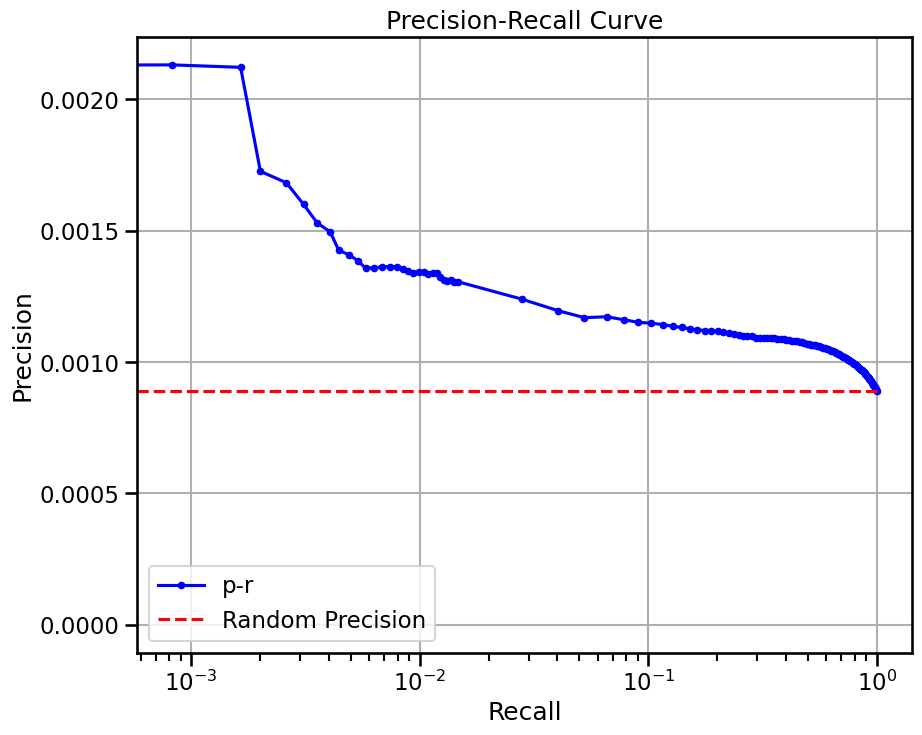


  0%|          | 0/16 [00:00<?, ?it/s]


  6%|▋         | 1/16 [00:02<00:32,  2.13s/it]


 12%|█▎        | 2/16 [00:02<00:18,  1.33s/it]


 19%|█▉        | 3/16 [00:03<00:13,  1.07s/it]


 25%|██▌       | 4/16 [00:04<00:11,  1.05it/s]


 31%|███▏      | 5/16 [00:05<00:09,  1.13it/s]


 38%|███▊      | 6/16 [00:05<00:08,  1.18it/s]


 44%|████▍     | 7/16 [00:06<00:07,  1.22it/s]


 50%|█████     | 8/16 [00:07<00:06,  1.24it/s]


 56%|█████▋    | 9/16 [00:08<00:05,  1.26it/s]


 62%|██████▎   | 10/16 [00:09<00:04,  1.28it/s]


 69%|██████▉   | 11/16 [00:09<00:03,  1.29it/s]


 75%|███████▌  | 12/16 [00:10<00:03,  1.30it/s]


 81%|████████▏ | 13/16 [00:11<00:02,  1.30it/s]


 88%|████████▊ | 14/16 [00:12<00:01,  1.30it/s]


 94%|█████████▍| 15/16 [00:12<00:00,  1.30it/s]


100%|██████████| 16/16 [00:13<00:00,  1.38it/s]


100%|██████████| 16/16 [00:13<00:00,  1.17it/s]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


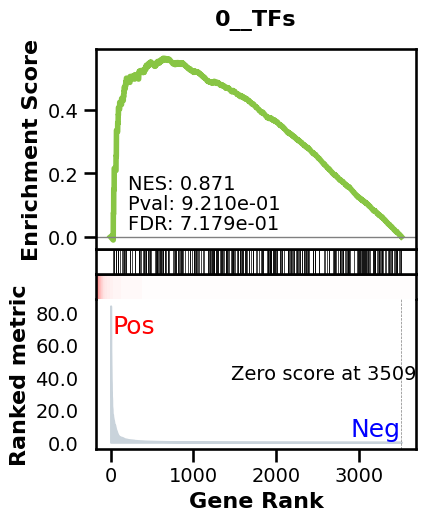

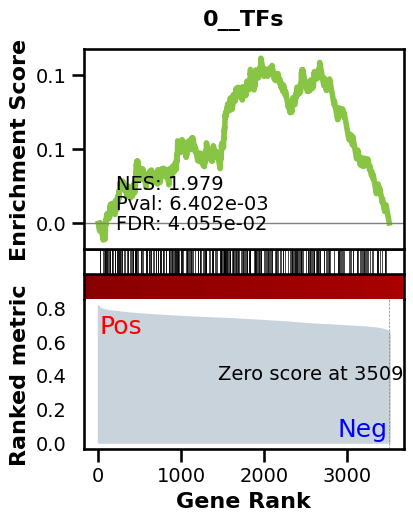

_________________________________________
TF specific enrichment


found some significant results for  20.833333333333332 % TFs

_________________________________________
loading GT,  omnipath


intersection of 2417 genes
intersection pct: 0.6886039886039886
precision:  0.0015868154975214352 
recall:  1.0 
random precision: 0.0015874722920154426



  0%|          | 0/128 [00:00<?, ?it/s]


  9%|▉         | 12/128 [00:00<00:01, 113.60it/s]


 19%|█▉        | 24/128 [00:00<00:00, 114.12it/s]


 28%|██▊       | 36/128 [00:00<00:00, 114.10it/s]


 38%|███▊      | 48/128 [00:00<00:00, 114.29it/s]


 47%|████▋     | 60/128 [00:00<00:00, 113.79it/s]


 56%|█████▋    | 72/128 [00:00<00:00, 113.94it/s]


 66%|██████▌   | 84/128 [00:00<00:00, 114.89it/s]


 75%|███████▌  | 96/128 [00:00<00:00, 116.18it/s]


 84%|████████▍ | 108/128 [00:00<00:00, 117.10it/s]


 94%|█████████▍| 120/128 [00:01<00:00, 117.96it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:01<00:00, 115.56it/s]

Average Precision (AP):  0.0017867689322772179
Area Under Precision-Recall Curve (AUPRC):  0.0017835861185524354
EPR: 1.7711198076065011


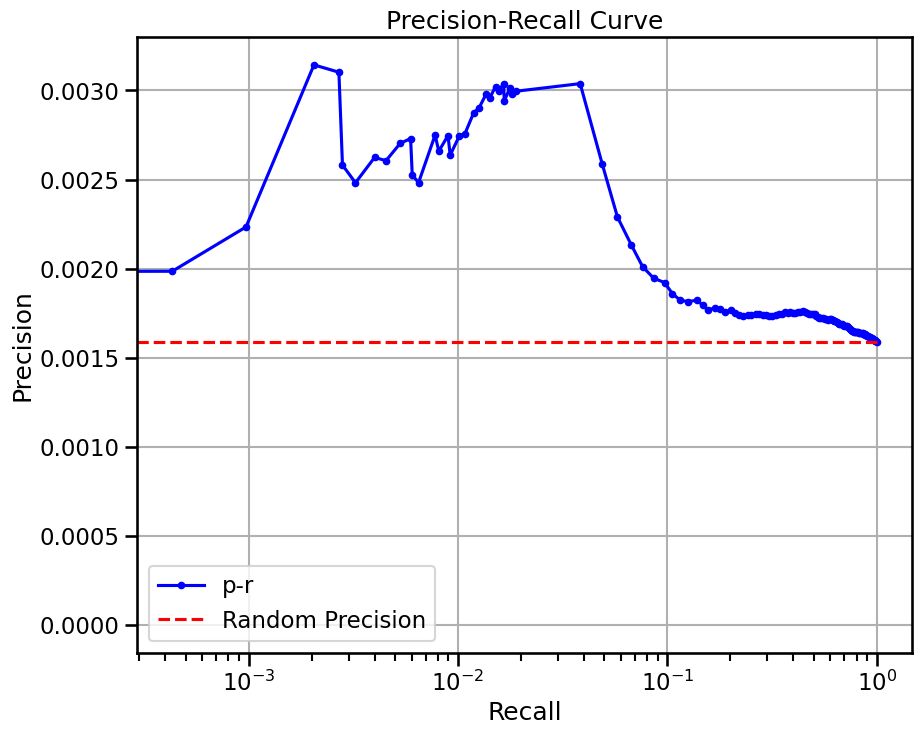

base enrichment


Top central genes: []


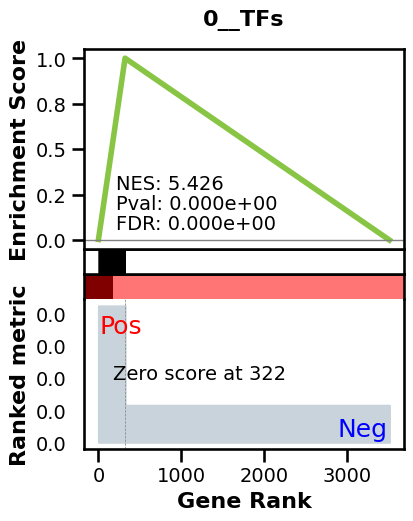

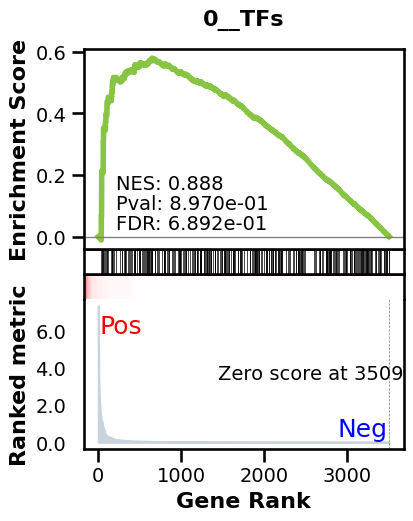

_________________________________________
TF specific enrichment


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


intersection of 2417 genes
intersection pct: 0.6886039886039886
precision:  0.008453956556222546 
recall:  0.6105717367853291 
random precision: 0.0015874722920154426



  0%|          | 0/128 [00:00<?, ?it/s]


 10%|█         | 13/128 [00:00<00:00, 122.51it/s]


 20%|██        | 26/128 [00:00<00:00, 123.11it/s]


 30%|███       | 39/128 [00:00<00:00, 123.18it/s]


 41%|████      | 52/128 [00:00<00:00, 122.94it/s]


 51%|█████     | 65/128 [00:00<00:00, 123.06it/s]


 61%|██████    | 78/128 [00:00<00:00, 122.22it/s]


 71%|███████   | 91/128 [00:00<00:00, 122.17it/s]


 81%|████████▏ | 104/128 [00:00<00:00, 122.42it/s]


 91%|█████████▏| 117/128 [00:00<00:00, 122.57it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:01<00:00, 122.59it/s]

Average Precision (AP):  0.007060585227950974
Area Under Precision-Recall Curve (AUPRC):  0.006470296155926735
EPR: 12.096004518541925


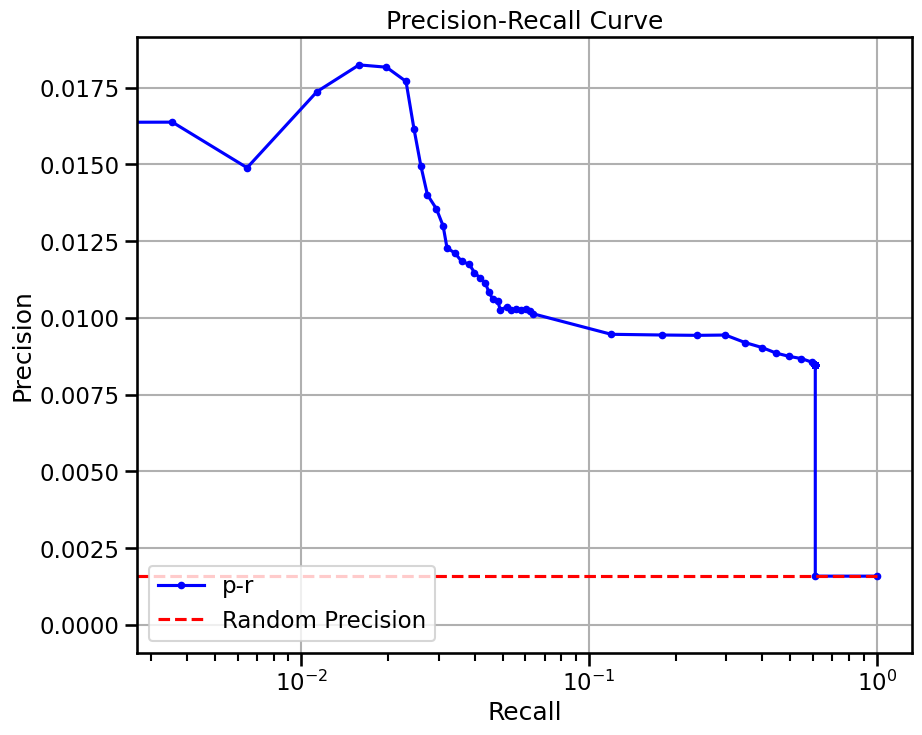

base enrichment


Top central genes: []
The DataFrame contains only the same values.


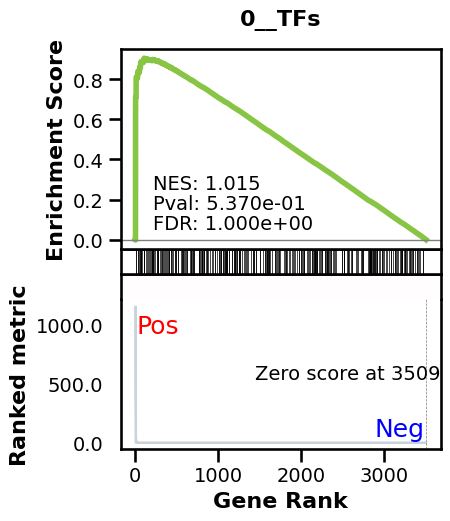

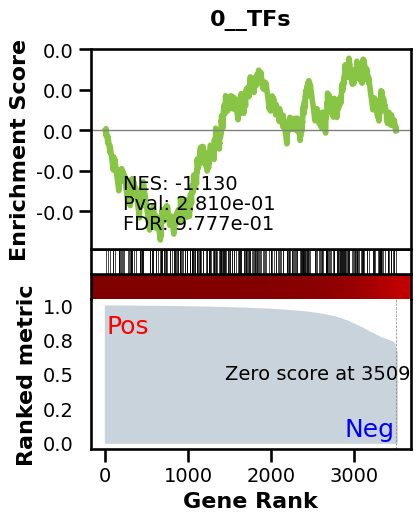

_________________________________________
TF specific enrichment


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


intersection of 2417 genes
intersection pct: 0.6886039886039886
precision:  0.0015868154975214352 
recall:  1.0 
random precision: 0.0015874722920154426



  0%|          | 0/128 [00:00<?, ?it/s]


 10%|█         | 13/128 [00:00<00:00, 120.55it/s]


 20%|██        | 26/128 [00:00<00:00, 120.18it/s]


 30%|███       | 39/128 [00:00<00:00, 120.07it/s]


 41%|████      | 52/128 [00:00<00:00, 119.88it/s]


 50%|█████     | 64/128 [00:00<00:00, 119.91it/s]


 60%|██████    | 77/128 [00:00<00:00, 119.99it/s]


 70%|██████▉   | 89/128 [00:00<00:00, 119.98it/s]


 80%|███████▉  | 102/128 [00:00<00:00, 120.01it/s]


 90%|████████▉ | 115/128 [00:00<00:00, 119.80it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:01<00:00, 120.23it/s]


100%|██████████| 128/128 [00:01<00:00, 120.01it/s]

Average Precision (AP):  0.0015511035425885477
Area Under Precision-Recall Curve (AUPRC):  0.0015423525225175478
EPR: 2.045370916961826


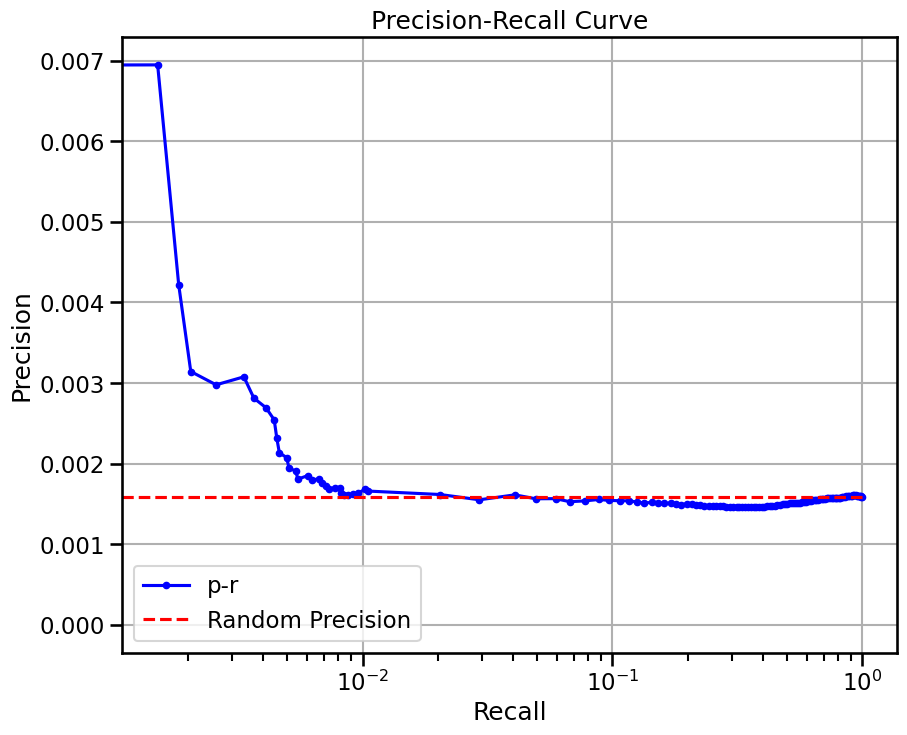

base enrichment


Top central genes: []


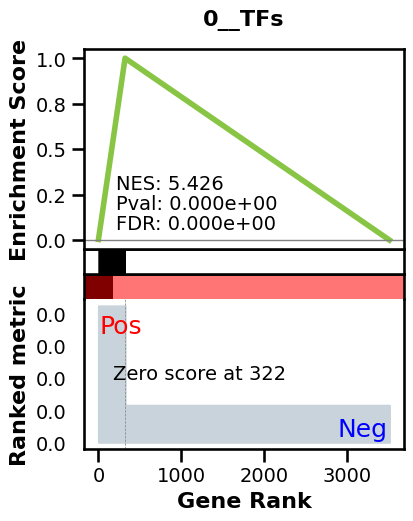

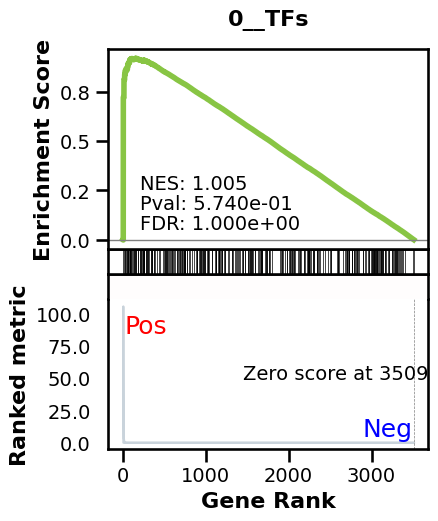

_________________________________________
TF specific enrichment


found some significant results for  16.666666666666668 % TFs

_________________________________________
loading GT,  omnipath


intersection of 2417 genes
intersection pct: 0.6886039886039886
precision:  0.008453956556222546 
recall:  0.6105717367853291 
random precision: 0.0015874722920154426



  0%|          | 0/128 [00:00<?, ?it/s]


  9%|▉         | 12/128 [00:00<00:00, 119.39it/s]


 19%|█▉        | 24/128 [00:00<00:00, 119.60it/s]


 29%|██▉       | 37/128 [00:00<00:00, 119.88it/s]


 38%|███▊      | 49/128 [00:00<00:00, 119.34it/s]


 48%|████▊     | 62/128 [00:00<00:00, 120.06it/s]


 59%|█████▊    | 75/128 [00:00<00:00, 120.09it/s]


 69%|██████▉   | 88/128 [00:00<00:00, 120.02it/s]


 79%|███████▉  | 101/128 [00:00<00:00, 119.93it/s]


 88%|████████▊ | 113/128 [00:00<00:00, 119.82it/s]


 98%|█████████▊| 125/128 [00:01<00:00, 119.78it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:01<00:00, 119.74it/s]

Average Precision (AP):  0.006381814653757586
Area Under Precision-Recall Curve (AUPRC):  0.00570114549183624
EPR: 7.631369300737973


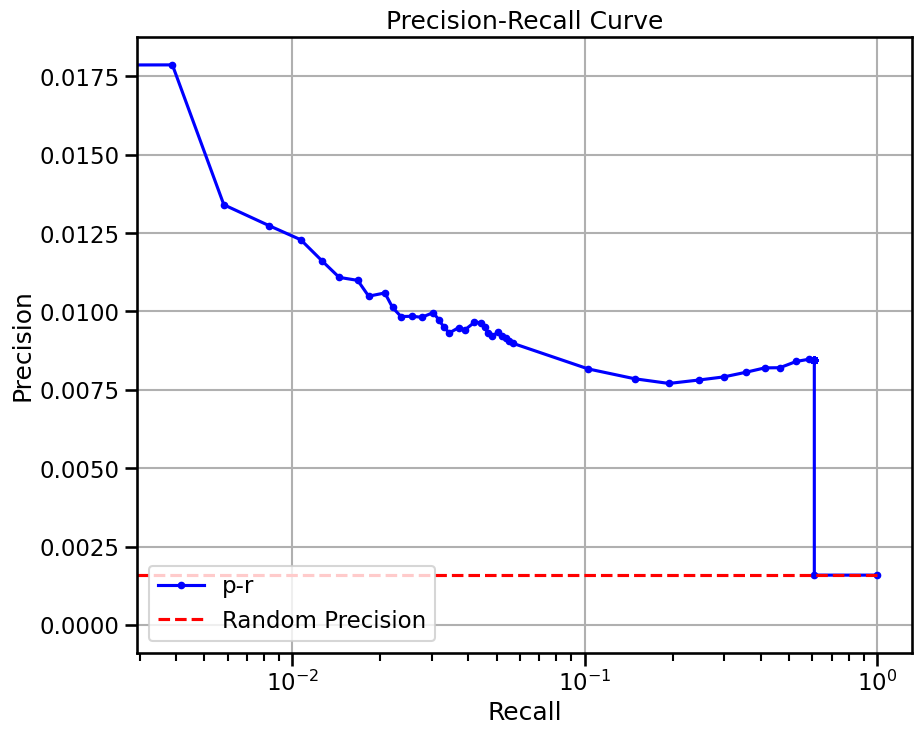


  0%|          | 0/6 [00:00<?, ?it/s]


 17%|█▋        | 1/6 [00:02<00:10,  2.10s/it]


 33%|███▎      | 2/6 [00:02<00:05,  1.31s/it]


 50%|█████     | 3/6 [00:03<00:03,  1.06s/it]


 67%|██████▋   | 4/6 [00:04<00:01,  1.06it/s]


 83%|████████▎ | 5/6 [00:05<00:00,  1.14it/s]


100%|██████████| 6/6 [00:05<00:00,  1.29it/s]


100%|██████████| 6/6 [00:05<00:00,  1.02it/s]

avg link count: 536246649, sparsity: 1.0


base enrichment


too many genes for central computation


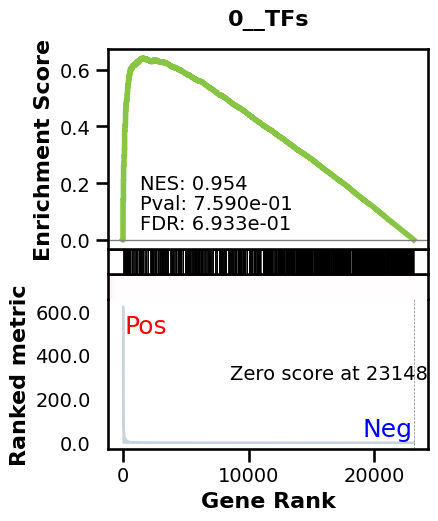

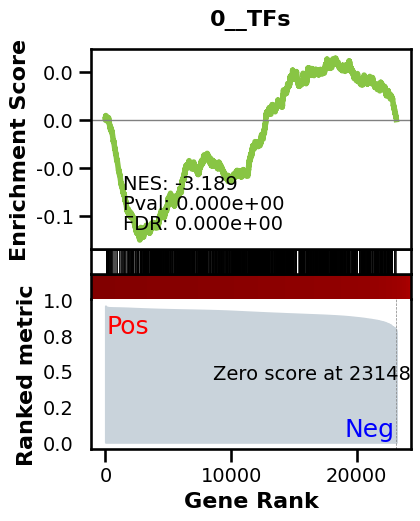

_________________________________________
TF specific enrichment


found some significant results for  62.5 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12455 genes
intersection pct: 0.5380362002678302


precision:  0.0008896322223674437 
recall:  1.0 
random precision: 0.0008897036558203398



  0%|          | 0/128 [00:00<?, ?it/s]


  1%|          | 1/128 [00:00<00:30,  4.14it/s]


  2%|▏         | 2/128 [00:00<00:30,  4.13it/s]


  2%|▏         | 3/128 [00:00<00:30,  4.15it/s]


  3%|▎         | 4/128 [00:00<00:30,  4.13it/s]


  4%|▍         | 5/128 [00:01<00:29,  4.14it/s]


  5%|▍         | 6/128 [00:01<00:29,  4.14it/s]


  5%|▌         | 7/128 [00:01<00:29,  4.13it/s]


  6%|▋         | 8/128 [00:01<00:29,  4.13it/s]


  7%|▋         | 9/128 [00:02<00:28,  4.14it/s]


  8%|▊         | 10/128 [00:02<00:28,  4.13it/s]


  9%|▊         | 11/128 [00:02<00:28,  4.14it/s]


  9%|▉         | 12/128 [00:02<00:28,  4.14it/s]


 10%|█         | 13/128 [00:03<00:27,  4.14it/s]


 11%|█         | 14/128 [00:03<00:27,  4.13it/s]


 12%|█▏        | 15/128 [00:03<00:27,  4.14it/s]


 12%|█▎        | 16/128 [00:03<00:27,  4.13it/s]


 13%|█▎        | 17/128 [00:04<00:26,  4.13it/s]


 14%|█▍        | 18/128 [00:04<00:26,  4.14it/s]


 15%|█▍        | 19/128 [00:04<00:26,  4.13it/s]


 16%|█▌        | 20/128 [00:04<00:26,  4.13it/s]


 16%|█▋        | 21/128 [00:05<00:25,  4.13it/s]


 17%|█▋        | 22/128 [00:05<00:25,  4.13it/s]


 18%|█▊        | 23/128 [00:05<00:25,  4.13it/s]


 19%|█▉        | 24/128 [00:05<00:25,  4.14it/s]


 20%|█▉        | 25/128 [00:06<00:24,  4.13it/s]


 20%|██        | 26/128 [00:06<00:24,  4.13it/s]


 21%|██        | 27/128 [00:06<00:24,  4.13it/s]


 22%|██▏       | 28/128 [00:06<00:24,  4.13it/s]


 23%|██▎       | 29/128 [00:07<00:24,  4.12it/s]


 23%|██▎       | 30/128 [00:07<00:23,  4.13it/s]


 24%|██▍       | 31/128 [00:07<00:23,  4.13it/s]


 25%|██▌       | 32/128 [00:07<00:23,  4.13it/s]


 26%|██▌       | 33/128 [00:07<00:23,  4.13it/s]


 27%|██▋       | 34/128 [00:08<00:22,  4.14it/s]


 27%|██▋       | 35/128 [00:08<00:22,  4.12it/s]


 28%|██▊       | 36/128 [00:08<00:22,  4.14it/s]


 29%|██▉       | 37/128 [00:08<00:22,  4.14it/s]


 30%|██▉       | 38/128 [00:09<00:21,  4.14it/s]


 30%|███       | 39/128 [00:09<00:21,  4.13it/s]


 31%|███▏      | 40/128 [00:09<00:21,  4.14it/s]


 32%|███▏      | 41/128 [00:09<00:21,  4.13it/s]


 33%|███▎      | 42/128 [00:10<00:20,  4.14it/s]


 34%|███▎      | 43/128 [00:10<00:20,  4.14it/s]


 34%|███▍      | 44/128 [00:10<00:20,  4.14it/s]


 35%|███▌      | 45/128 [00:10<00:20,  4.14it/s]


 36%|███▌      | 46/128 [00:11<00:19,  4.13it/s]


 37%|███▋      | 47/128 [00:11<00:19,  4.14it/s]


 38%|███▊      | 48/128 [00:11<00:19,  4.13it/s]


 38%|███▊      | 49/128 [00:11<00:19,  4.14it/s]


 39%|███▉      | 50/128 [00:12<00:18,  4.13it/s]


 40%|███▉      | 51/128 [00:12<00:18,  4.13it/s]


 41%|████      | 52/128 [00:12<00:18,  4.13it/s]


 41%|████▏     | 53/128 [00:12<00:18,  4.14it/s]


 42%|████▏     | 54/128 [00:13<00:17,  4.13it/s]


 43%|████▎     | 55/128 [00:13<00:17,  4.15it/s]


 44%|████▍     | 56/128 [00:13<00:17,  4.14it/s]


 45%|████▍     | 57/128 [00:13<00:17,  4.14it/s]


 45%|████▌     | 58/128 [00:14<00:16,  4.14it/s]


 46%|████▌     | 59/128 [00:14<00:16,  4.14it/s]


 47%|████▋     | 60/128 [00:14<00:16,  4.13it/s]


 48%|████▊     | 61/128 [00:14<00:16,  4.15it/s]


 48%|████▊     | 62/128 [00:14<00:15,  4.16it/s]


 49%|████▉     | 63/128 [00:15<00:15,  4.16it/s]


 50%|█████     | 64/128 [00:15<00:15,  4.16it/s]


 51%|█████     | 65/128 [00:15<00:15,  4.16it/s]


 52%|█████▏    | 66/128 [00:15<00:14,  4.15it/s]


 52%|█████▏    | 67/128 [00:16<00:14,  4.14it/s]


 53%|█████▎    | 68/128 [00:16<00:14,  4.15it/s]


 54%|█████▍    | 69/128 [00:16<00:14,  4.15it/s]


 55%|█████▍    | 70/128 [00:16<00:13,  4.15it/s]


 55%|█████▌    | 71/128 [00:17<00:13,  4.15it/s]


 56%|█████▋    | 72/128 [00:17<00:13,  4.14it/s]


 57%|█████▋    | 73/128 [00:17<00:13,  4.15it/s]


 58%|█████▊    | 74/128 [00:17<00:13,  4.14it/s]


 59%|█████▊    | 75/128 [00:18<00:12,  4.14it/s]


 59%|█████▉    | 76/128 [00:18<00:12,  4.14it/s]


 60%|██████    | 77/128 [00:18<00:12,  4.15it/s]


 61%|██████    | 78/128 [00:18<00:12,  4.15it/s]


 62%|██████▏   | 79/128 [00:19<00:11,  4.15it/s]


 62%|██████▎   | 80/128 [00:19<00:11,  4.16it/s]


 63%|██████▎   | 81/128 [00:19<00:11,  4.15it/s]


 64%|██████▍   | 82/128 [00:19<00:11,  4.15it/s]


 65%|██████▍   | 83/128 [00:20<00:10,  4.15it/s]


 66%|██████▌   | 84/128 [00:20<00:10,  4.15it/s]


 66%|██████▋   | 85/128 [00:20<00:10,  4.08it/s]


 67%|██████▋   | 86/128 [00:20<00:10,  4.10it/s]


 68%|██████▊   | 87/128 [00:21<00:09,  4.12it/s]


 69%|██████▉   | 88/128 [00:21<00:09,  4.13it/s]


 70%|██████▉   | 89/128 [00:21<00:09,  4.15it/s]


 70%|███████   | 90/128 [00:21<00:09,  4.15it/s]


 71%|███████   | 91/128 [00:21<00:08,  4.17it/s]


 72%|███████▏  | 92/128 [00:22<00:08,  4.18it/s]


 73%|███████▎  | 93/128 [00:22<00:08,  4.18it/s]


 73%|███████▎  | 94/128 [00:22<00:08,  4.17it/s]


 74%|███████▍  | 95/128 [00:22<00:07,  4.17it/s]


 75%|███████▌  | 96/128 [00:23<00:07,  4.17it/s]


 76%|███████▌  | 97/128 [00:23<00:07,  4.16it/s]


 77%|███████▋  | 98/128 [00:23<00:07,  4.16it/s]


 77%|███████▋  | 99/128 [00:23<00:06,  4.16it/s]


 78%|███████▊  | 100/128 [00:24<00:06,  4.16it/s]


 79%|███████▉  | 101/128 [00:24<00:06,  4.15it/s]


 80%|███████▉  | 102/128 [00:24<00:06,  4.16it/s]


 80%|████████  | 103/128 [00:24<00:06,  4.16it/s]


 81%|████████▏ | 104/128 [00:25<00:05,  4.15it/s]


 82%|████████▏ | 105/128 [00:25<00:05,  4.16it/s]


 83%|████████▎ | 106/128 [00:25<00:05,  4.15it/s]


 84%|████████▎ | 107/128 [00:25<00:05,  4.15it/s]


 84%|████████▍ | 108/128 [00:26<00:04,  4.15it/s]


 85%|████████▌ | 109/128 [00:26<00:04,  4.15it/s]


 86%|████████▌ | 110/128 [00:26<00:04,  4.14it/s]


 87%|████████▋ | 111/128 [00:26<00:04,  4.15it/s]


 88%|████████▊ | 112/128 [00:27<00:03,  4.14it/s]


 88%|████████▊ | 113/128 [00:27<00:03,  4.14it/s]


 89%|████████▉ | 114/128 [00:27<00:03,  4.14it/s]


 90%|████████▉ | 115/128 [00:27<00:03,  4.14it/s]


 91%|█████████ | 116/128 [00:28<00:02,  4.14it/s]


 91%|█████████▏| 117/128 [00:28<00:02,  4.14it/s]


 92%|█████████▏| 118/128 [00:28<00:02,  4.15it/s]


 93%|█████████▎| 119/128 [00:28<00:02,  4.14it/s]


 94%|█████████▍| 120/128 [00:28<00:01,  4.15it/s]


 95%|█████████▍| 121/128 [00:29<00:01,  4.14it/s]


 95%|█████████▌| 122/128 [00:29<00:01,  4.14it/s]


 96%|█████████▌| 123/128 [00:29<00:01,  4.14it/s]


 97%|█████████▋| 124/128 [00:29<00:00,  4.14it/s]


 98%|█████████▊| 125/128 [00:30<00:00,  4.13it/s]


 98%|█████████▊| 126/128 [00:30<00:00,  4.13it/s]


 99%|█████████▉| 127/128 [00:30<00:00,  4.14it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()



100%|██████████| 128/128 [00:30<00:00,  4.13it/s]


100%|██████████| 128/128 [00:30<00:00,  4.14it/s]

Average Precision (AP):  0.0010695160951065194
Area Under Precision-Recall Curve (AUPRC):  0.0010694522965265687


EPR: 1.8924883676583275


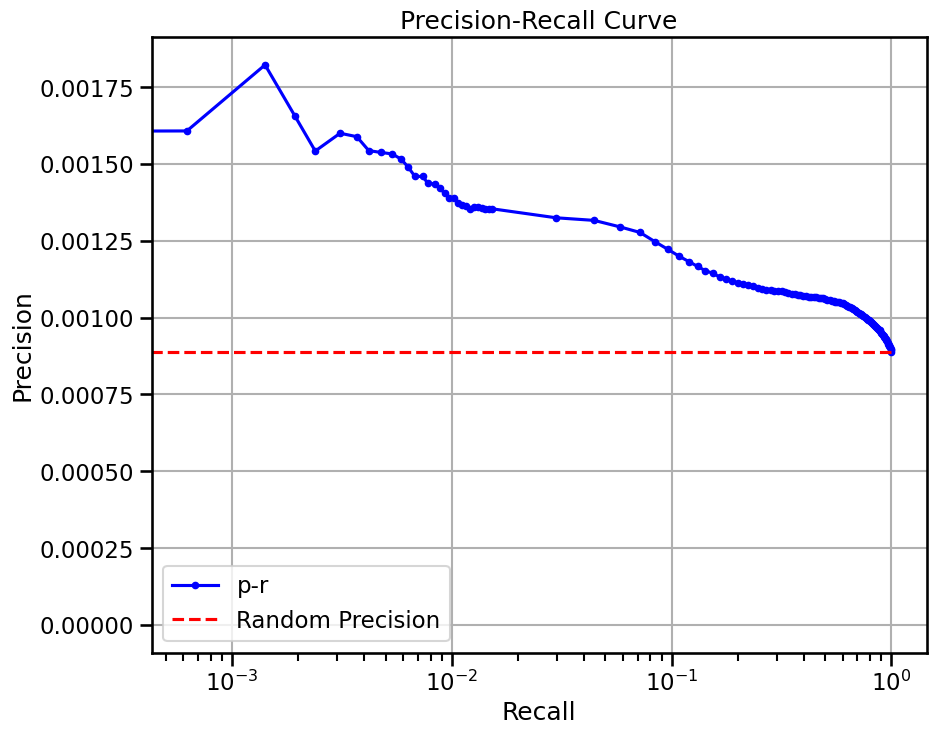


  0%|          | 0/12 [00:00<?, ?it/s]


  8%|▊         | 1/12 [00:02<00:29,  2.68s/it]


 17%|█▋        | 2/12 [00:03<00:17,  1.80s/it]


 25%|██▌       | 3/12 [00:05<00:13,  1.51s/it]


 33%|███▎      | 4/12 [00:06<00:10,  1.35s/it]


 42%|████▏     | 5/12 [00:07<00:08,  1.27s/it]


 50%|█████     | 6/12 [00:08<00:07,  1.22s/it]


 58%|█████▊    | 7/12 [00:09<00:05,  1.19s/it]


 67%|██████▋   | 8/12 [00:10<00:04,  1.16s/it]


 75%|███████▌  | 9/12 [00:11<00:03,  1.15s/it]


 83%|████████▎ | 10/12 [00:12<00:02,  1.16s/it]


 92%|█████████▏| 11/12 [00:14<00:01,  1.14s/it]


100%|██████████| 12/12 [00:14<00:00,  1.03it/s]


100%|██████████| 12/12 [00:14<00:00,  1.23s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


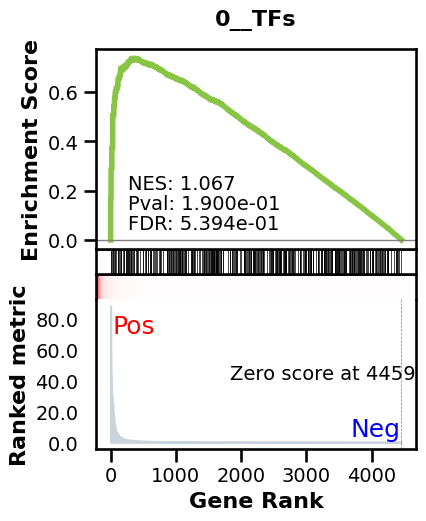

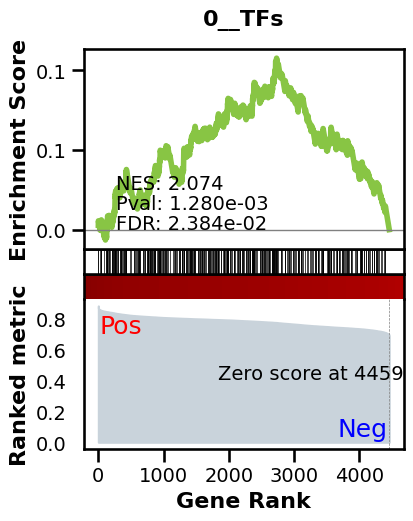

_________________________________________
TF specific enrichment


found some significant results for  38.888888888888886 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3145 genes
intersection pct: 0.7051569506726457
precision:  0.0013930811013014323 
recall:  1.0 
random precision: 0.0013935241932547726



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▌         | 7/128 [00:00<00:01, 69.58it/s]


 11%|█         | 14/128 [00:00<00:01, 69.65it/s]


 16%|█▋        | 21/128 [00:00<00:01, 69.71it/s]


 22%|██▏       | 28/128 [00:00<00:01, 69.76it/s]


 27%|██▋       | 35/128 [00:00<00:01, 69.73it/s]


 33%|███▎      | 42/128 [00:00<00:01, 69.74it/s]


 38%|███▊      | 49/128 [00:00<00:01, 69.77it/s]


 44%|████▍     | 56/128 [00:00<00:01, 69.77it/s]


 49%|████▉     | 63/128 [00:00<00:00, 69.78it/s]


 55%|█████▍    | 70/128 [00:01<00:00, 69.82it/s]


 60%|██████    | 77/128 [00:01<00:00, 69.83it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 69.85it/s]


 71%|███████   | 91/128 [00:01<00:00, 69.82it/s]


 77%|███████▋  | 98/128 [00:01<00:00, 69.80it/s]


 82%|████████▏ | 105/128 [00:01<00:00, 69.62it/s]


 88%|████████▊ | 112/128 [00:01<00:00, 69.70it/s]


 93%|█████████▎| 119/128 [00:01<00:00, 69.70it/s]


 98%|█████████▊| 126/128 [00:01<00:00, 69.75it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:01<00:00, 69.71it/s]

Average Precision (AP):  0.0016282261613801592
Area Under Precision-Recall Curve (AUPRC):  0.0016260343659253748
EPR: 0.6764247534215281


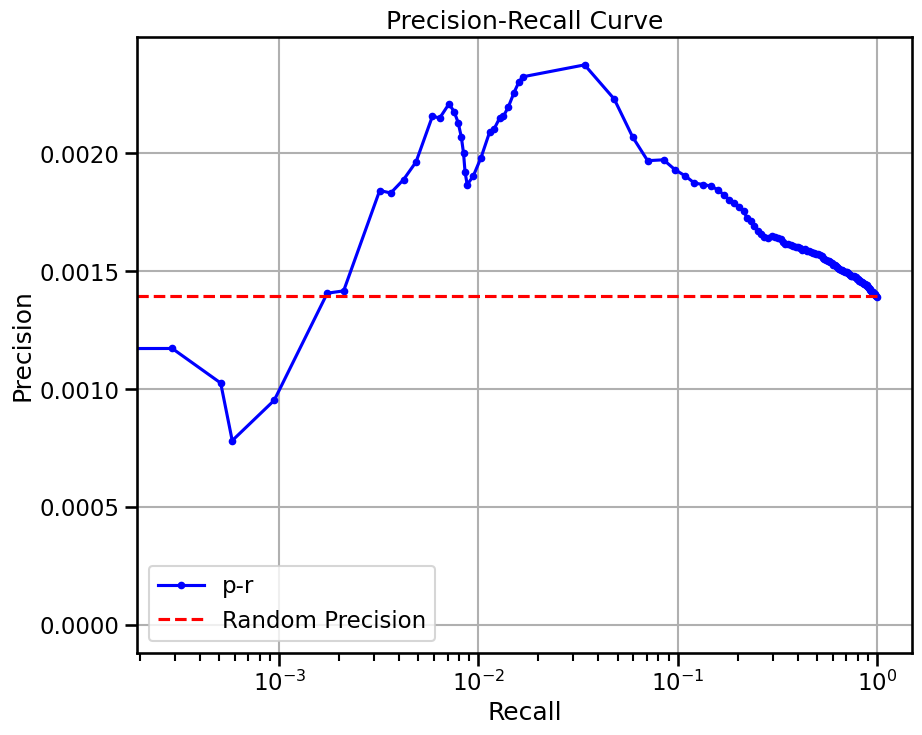

base enrichment


Top central genes: []


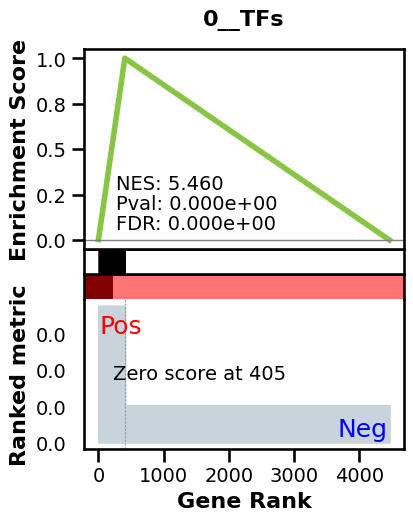

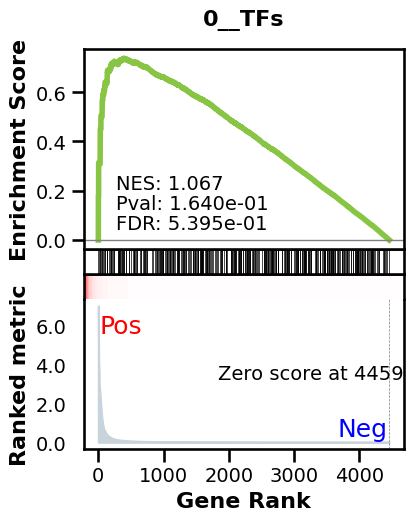

_________________________________________
TF specific enrichment


found some significant results for  9.25925925925926 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3145 genes
intersection pct: 0.7051569506726457
precision:  0.006467408585055644 
recall:  0.5166557805355977 
random precision: 0.0013935241932547726



  0%|          | 0/128 [00:00<?, ?it/s]


  6%|▋         | 8/128 [00:00<00:01, 70.23it/s]


 12%|█▎        | 16/128 [00:00<00:01, 70.39it/s]


 19%|█▉        | 24/128 [00:00<00:01, 70.44it/s]


 25%|██▌       | 32/128 [00:00<00:01, 70.39it/s]


 31%|███▏      | 40/128 [00:00<00:01, 70.47it/s]


 38%|███▊      | 48/128 [00:00<00:01, 70.45it/s]


 44%|████▍     | 56/128 [00:00<00:01, 70.45it/s]


 50%|█████     | 64/128 [00:00<00:00, 70.26it/s]


 56%|█████▋    | 72/128 [00:01<00:00, 70.36it/s]


 62%|██████▎   | 80/128 [00:01<00:00, 70.37it/s]


 69%|██████▉   | 88/128 [00:01<00:00, 70.48it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 70.45it/s]


 81%|████████▏ | 104/128 [00:01<00:00, 70.46it/s]


 88%|████████▊ | 112/128 [00:01<00:00, 70.44it/s]


 94%|█████████▍| 120/128 [00:01<00:00, 70.44it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:01<00:00, 70.33it/s]


100%|██████████| 128/128 [00:01<00:00, 70.37it/s]

Average Precision (AP):  0.005128854409390196
Area Under Precision-Recall Curve (AUPRC):  0.004733587494051432
EPR: 8.778308038228088


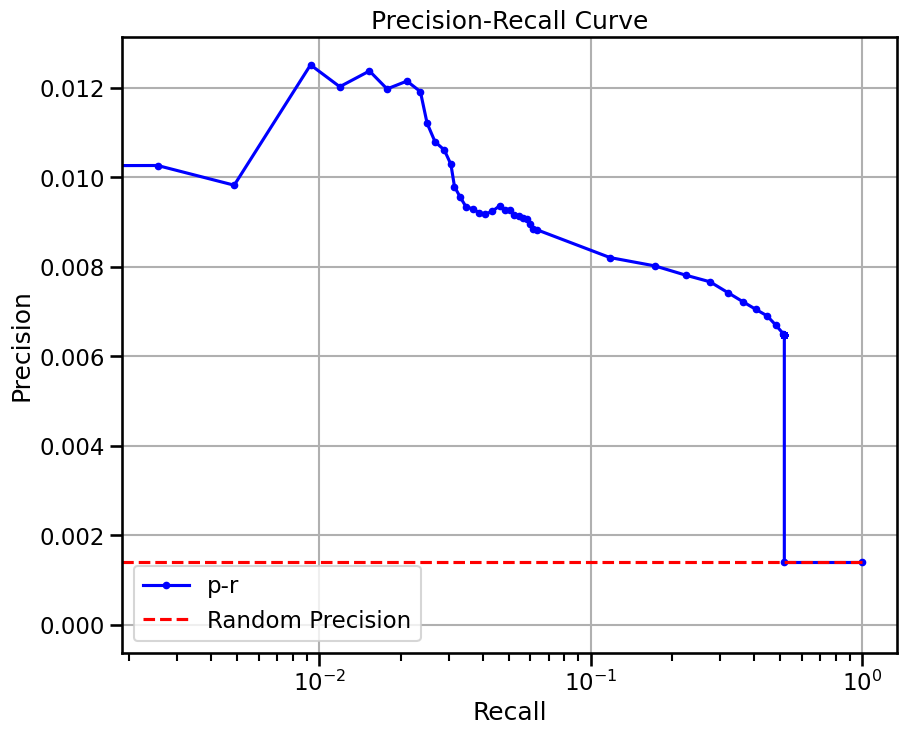

base enrichment


Top central genes: []
The DataFrame contains only the same values.


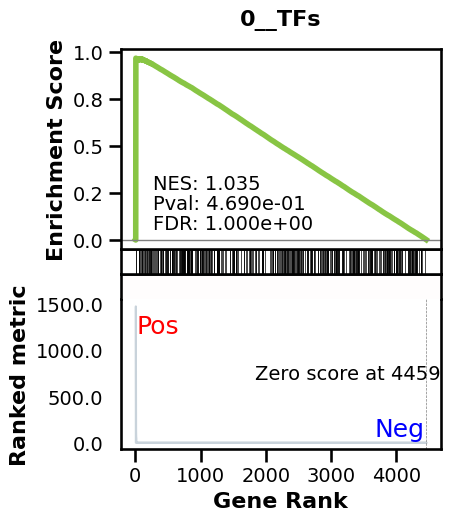

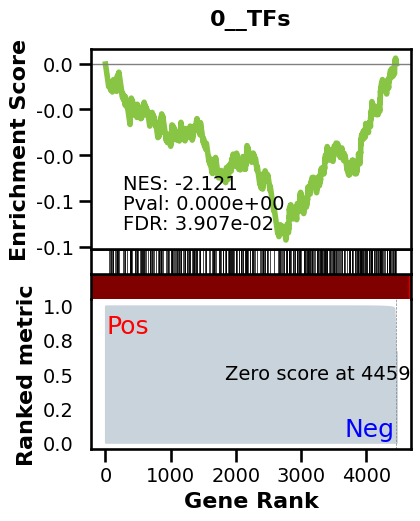

_________________________________________
TF specific enrichment


found some significant results for  9.25925925925926 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3145 genes
intersection pct: 0.7051569506726457
precision:  0.0013930811013014323 
recall:  1.0 
random precision: 0.0013935241932547726



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▌         | 7/128 [00:00<00:01, 68.52it/s]


 11%|█         | 14/128 [00:00<00:01, 68.73it/s]


 16%|█▋        | 21/128 [00:00<00:01, 68.82it/s]


 22%|██▏       | 28/128 [00:00<00:01, 68.78it/s]


 27%|██▋       | 35/128 [00:00<00:01, 68.68it/s]


 33%|███▎      | 42/128 [00:00<00:01, 68.74it/s]


 38%|███▊      | 49/128 [00:00<00:01, 68.84it/s]


 44%|████▍     | 56/128 [00:00<00:01, 68.86it/s]


 49%|████▉     | 63/128 [00:00<00:00, 68.87it/s]


 55%|█████▍    | 70/128 [00:01<00:00, 68.88it/s]


 60%|██████    | 77/128 [00:01<00:00, 68.90it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 68.90it/s]


 71%|███████   | 91/128 [00:01<00:00, 68.96it/s]


 77%|███████▋  | 98/128 [00:01<00:00, 68.98it/s]


 82%|████████▏ | 105/128 [00:01<00:00, 69.05it/s]


 88%|████████▊ | 112/128 [00:01<00:00, 69.05it/s]


 93%|█████████▎| 119/128 [00:01<00:00, 69.04it/s]


 98%|█████████▊| 126/128 [00:01<00:00, 69.07it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:01<00:00, 68.87it/s]

Average Precision (AP):  0.00185068413178378
Area Under Precision-Recall Curve (AUPRC):  0.001847567246057715
EPR: 3.2491311402630187


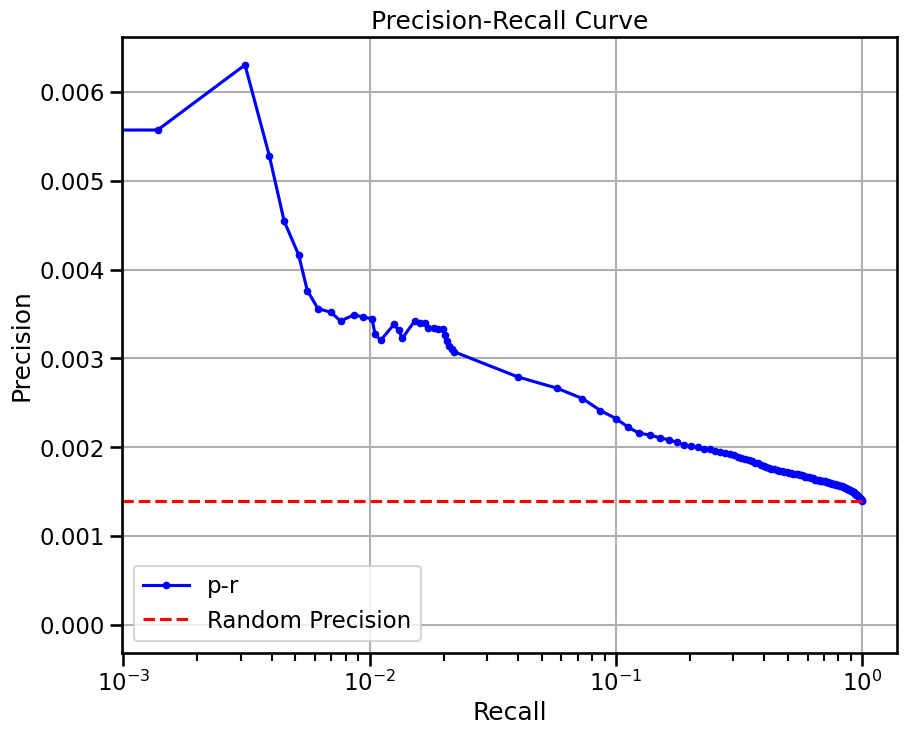

base enrichment


Top central genes: []


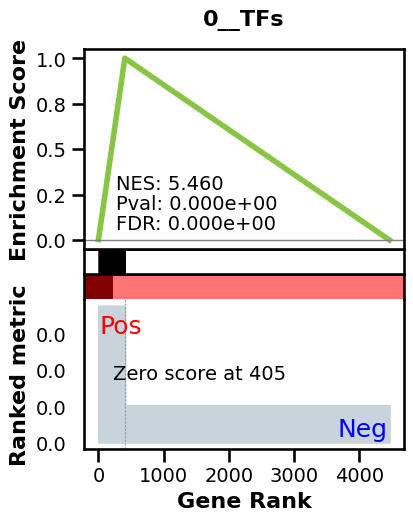

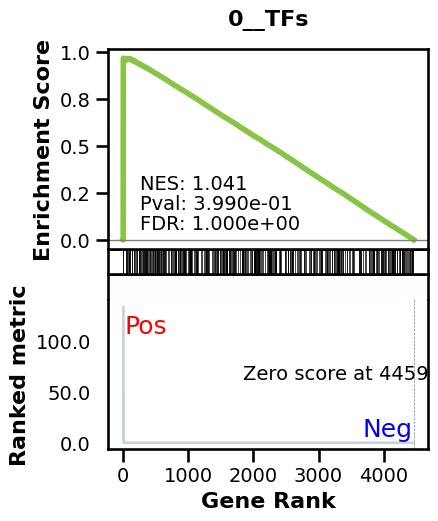

_________________________________________
TF specific enrichment


found some significant results for  5.555555555555555 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3145 genes
intersection pct: 0.7051569506726457
precision:  0.006467408585055644 
recall:  0.5166557805355977 
random precision: 0.0013935241932547726



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▌         | 7/128 [00:00<00:01, 67.89it/s]


 12%|█▏        | 15/128 [00:00<00:01, 69.23it/s]


 17%|█▋        | 22/128 [00:00<00:01, 68.97it/s]


 23%|██▎       | 30/128 [00:00<00:01, 69.46it/s]


 29%|██▉       | 37/128 [00:00<00:01, 68.47it/s]


 34%|███▍      | 44/128 [00:00<00:01, 67.90it/s]


 40%|███▉      | 51/128 [00:00<00:01, 67.61it/s]


 45%|████▌     | 58/128 [00:00<00:01, 67.29it/s]


 51%|█████     | 65/128 [00:00<00:00, 67.28it/s]


 56%|█████▋    | 72/128 [00:01<00:00, 67.15it/s]


 62%|██████▏   | 79/128 [00:01<00:00, 67.02it/s]


 67%|██████▋   | 86/128 [00:01<00:00, 67.62it/s]


 73%|███████▎  | 94/128 [00:01<00:00, 68.43it/s]


 79%|███████▉  | 101/128 [00:01<00:00, 68.48it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 68.34it/s]


 90%|████████▉ | 115/128 [00:01<00:00, 67.99it/s]


 95%|█████████▌| 122/128 [00:01<00:00, 67.61it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:01<00:00, 67.87it/s]

Average Precision (AP):  0.00516813429104133
Area Under Precision-Recall Curve (AUPRC):  0.00470846819503055
EPR: 9.050969018467715


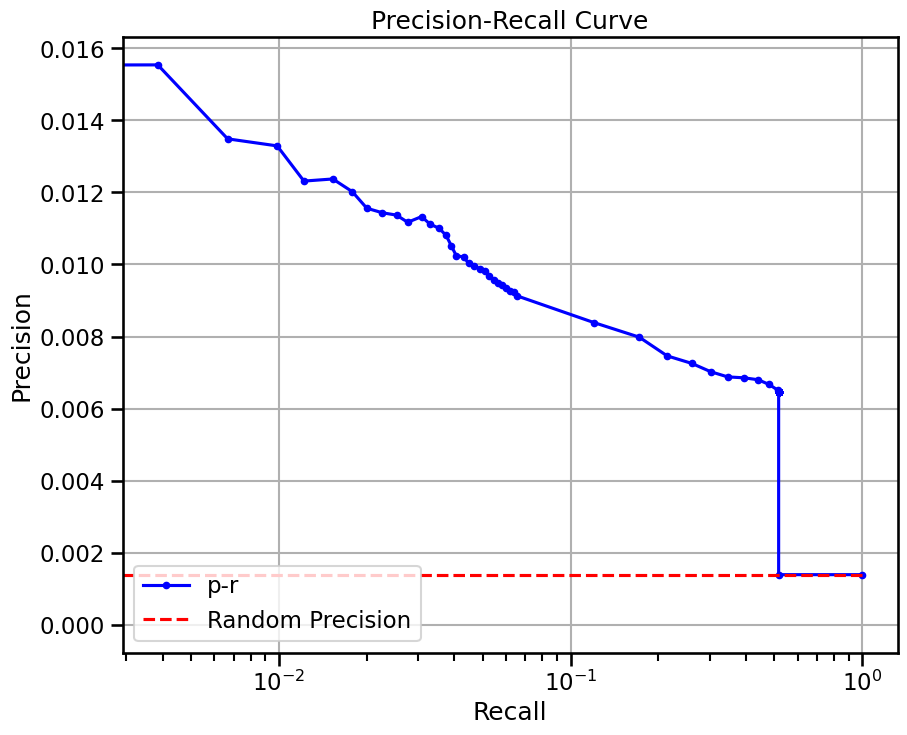


  0%|          | 0/32 [00:00<?, ?it/s]


  3%|▎         | 1/32 [00:02<01:02,  2.01s/it]


  6%|▋         | 2/32 [00:02<00:37,  1.26s/it]


  9%|▉         | 3/32 [00:03<00:30,  1.04s/it]


 12%|█▎        | 4/32 [00:04<00:26,  1.08it/s]


 16%|█▌        | 5/32 [00:05<00:23,  1.15it/s]


 19%|█▉        | 6/32 [00:05<00:21,  1.20it/s]


 22%|██▏       | 7/32 [00:06<00:20,  1.24it/s]


 25%|██▌       | 8/32 [00:07<00:18,  1.26it/s]


 28%|██▊       | 9/32 [00:08<00:17,  1.28it/s]


 31%|███▏      | 10/32 [00:08<00:16,  1.30it/s]


 34%|███▍      | 11/32 [00:09<00:16,  1.30it/s]


 38%|███▊      | 12/32 [00:10<00:15,  1.31it/s]


 41%|████      | 13/32 [00:11<00:14,  1.31it/s]


 44%|████▍     | 14/32 [00:11<00:13,  1.32it/s]


 47%|████▋     | 15/32 [00:12<00:12,  1.33it/s]


 50%|█████     | 16/32 [00:13<00:12,  1.33it/s]


 53%|█████▎    | 17/32 [00:14<00:11,  1.33it/s]


 56%|█████▋    | 18/32 [00:14<00:10,  1.33it/s]


 59%|█████▉    | 19/32 [00:15<00:09,  1.34it/s]


 62%|██████▎   | 20/32 [00:16<00:08,  1.33it/s]


 66%|██████▌   | 21/32 [00:17<00:08,  1.34it/s]


 69%|██████▉   | 22/32 [00:17<00:07,  1.33it/s]


 72%|███████▏  | 23/32 [00:18<00:06,  1.33it/s]


 75%|███████▌  | 24/32 [00:19<00:05,  1.34it/s]


 78%|███████▊  | 25/32 [00:20<00:05,  1.33it/s]


 81%|████████▏ | 26/32 [00:20<00:04,  1.33it/s]


 84%|████████▍ | 27/32 [00:21<00:03,  1.33it/s]


 88%|████████▊ | 28/32 [00:22<00:03,  1.32it/s]


 91%|█████████ | 29/32 [00:23<00:02,  1.33it/s]


 94%|█████████▍| 30/32 [00:23<00:01,  1.33it/s]


 97%|█████████▋| 31/32 [00:24<00:00,  1.32it/s]


100%|██████████| 32/32 [00:25<00:00,  1.32it/s]


100%|██████████| 32/32 [00:25<00:00,  1.25it/s]

avg link count: 536246649, sparsity: 1.0


base enrichment


too many genes for central computation


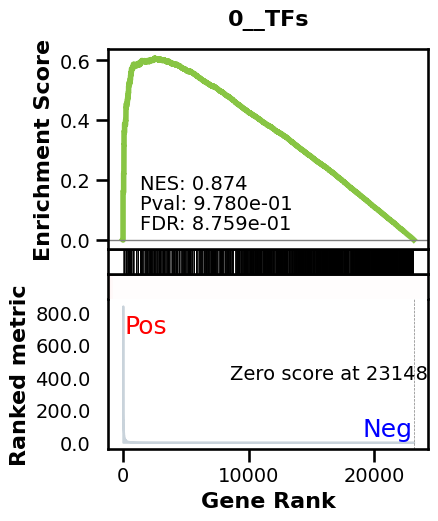

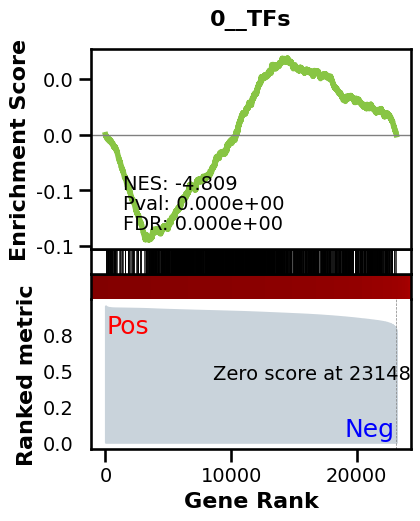

_________________________________________
TF specific enrichment


found some significant results for  65.17857142857143 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12455 genes
intersection pct: 0.5380362002678302


precision:  0.0008896322223674437 
recall:  1.0 
random precision: 0.0008897036558203398



  0%|          | 0/128 [00:00<?, ?it/s]


  1%|          | 1/128 [00:00<00:36,  3.45it/s]


  2%|▏         | 2/128 [00:00<00:36,  3.46it/s]


  2%|▏         | 3/128 [00:00<00:36,  3.39it/s]


  3%|▎         | 4/128 [00:01<00:36,  3.37it/s]


  4%|▍         | 5/128 [00:01<00:36,  3.35it/s]


  5%|▍         | 6/128 [00:01<00:36,  3.37it/s]


  5%|▌         | 7/128 [00:02<00:36,  3.34it/s]


  6%|▋         | 8/128 [00:02<00:35,  3.34it/s]


  7%|▋         | 9/128 [00:02<00:35,  3.35it/s]


  8%|▊         | 10/128 [00:02<00:35,  3.34it/s]


  9%|▊         | 11/128 [00:03<00:34,  3.35it/s]


  9%|▉         | 12/128 [00:03<00:34,  3.35it/s]


 10%|█         | 13/128 [00:03<00:34,  3.35it/s]


 11%|█         | 14/128 [00:04<00:34,  3.33it/s]


 12%|█▏        | 15/128 [00:04<00:33,  3.35it/s]


 12%|█▎        | 16/128 [00:04<00:33,  3.39it/s]


 13%|█▎        | 17/128 [00:05<00:32,  3.37it/s]


 14%|█▍        | 18/128 [00:05<00:32,  3.37it/s]


 15%|█▍        | 19/128 [00:05<00:32,  3.37it/s]


 16%|█▌        | 20/128 [00:05<00:31,  3.38it/s]


 16%|█▋        | 21/128 [00:06<00:31,  3.37it/s]


 17%|█▋        | 22/128 [00:06<00:31,  3.36it/s]


 18%|█▊        | 23/128 [00:06<00:31,  3.38it/s]


 19%|█▉        | 24/128 [00:07<00:30,  3.39it/s]


 20%|█▉        | 25/128 [00:07<00:30,  3.38it/s]


 20%|██        | 26/128 [00:07<00:30,  3.38it/s]


 21%|██        | 27/128 [00:08<00:29,  3.37it/s]


 22%|██▏       | 28/128 [00:08<00:29,  3.37it/s]


 23%|██▎       | 29/128 [00:08<00:29,  3.37it/s]


 23%|██▎       | 30/128 [00:08<00:29,  3.36it/s]


 24%|██▍       | 31/128 [00:09<00:28,  3.37it/s]


 25%|██▌       | 32/128 [00:09<00:28,  3.35it/s]


 26%|██▌       | 33/128 [00:09<00:28,  3.37it/s]


 27%|██▋       | 34/128 [00:10<00:28,  3.33it/s]


 27%|██▋       | 35/128 [00:10<00:27,  3.34it/s]


 28%|██▊       | 36/128 [00:10<00:27,  3.32it/s]


 29%|██▉       | 37/128 [00:11<00:27,  3.34it/s]


 30%|██▉       | 38/128 [00:11<00:26,  3.38it/s]


 30%|███       | 39/128 [00:11<00:26,  3.35it/s]


 31%|███▏      | 40/128 [00:11<00:26,  3.36it/s]


 32%|███▏      | 41/128 [00:12<00:25,  3.35it/s]


 33%|███▎      | 42/128 [00:12<00:25,  3.35it/s]


 34%|███▎      | 43/128 [00:12<00:25,  3.38it/s]


 34%|███▍      | 44/128 [00:13<00:24,  3.37it/s]


 35%|███▌      | 45/128 [00:13<00:24,  3.37it/s]


 36%|███▌      | 46/128 [00:13<00:24,  3.36it/s]


 37%|███▋      | 47/128 [00:13<00:24,  3.34it/s]


 38%|███▊      | 48/128 [00:14<00:23,  3.36it/s]


 38%|███▊      | 49/128 [00:14<00:23,  3.34it/s]


 39%|███▉      | 50/128 [00:14<00:23,  3.34it/s]


 40%|███▉      | 51/128 [00:15<00:23,  3.34it/s]


 41%|████      | 52/128 [00:15<00:22,  3.37it/s]


 41%|████▏     | 53/128 [00:15<00:22,  3.33it/s]


 42%|████▏     | 54/128 [00:16<00:22,  3.35it/s]


 43%|████▎     | 55/128 [00:16<00:21,  3.38it/s]


 44%|████▍     | 56/128 [00:16<00:21,  3.38it/s]


 45%|████▍     | 57/128 [00:16<00:20,  3.39it/s]


 45%|████▌     | 58/128 [00:17<00:20,  3.39it/s]


 46%|████▌     | 59/128 [00:17<00:20,  3.42it/s]


 47%|████▋     | 60/128 [00:17<00:19,  3.42it/s]


 48%|████▊     | 61/128 [00:18<00:19,  3.44it/s]


 48%|████▊     | 62/128 [00:18<00:19,  3.46it/s]


 49%|████▉     | 63/128 [00:18<00:18,  3.47it/s]


 50%|█████     | 64/128 [00:18<00:18,  3.44it/s]


 51%|█████     | 65/128 [00:19<00:18,  3.46it/s]


 52%|█████▏    | 66/128 [00:19<00:17,  3.45it/s]


 52%|█████▏    | 67/128 [00:19<00:17,  3.47it/s]


 53%|█████▎    | 68/128 [00:20<00:17,  3.47it/s]


 54%|█████▍    | 69/128 [00:20<00:17,  3.47it/s]


 55%|█████▍    | 70/128 [00:20<00:16,  3.48it/s]


 55%|█████▌    | 71/128 [00:20<00:16,  3.49it/s]


 56%|█████▋    | 72/128 [00:21<00:16,  3.47it/s]


 57%|█████▋    | 73/128 [00:21<00:15,  3.49it/s]


 58%|█████▊    | 74/128 [00:21<00:15,  3.48it/s]


 59%|█████▊    | 75/128 [00:22<00:15,  3.49it/s]


 59%|█████▉    | 76/128 [00:22<00:14,  3.50it/s]


 60%|██████    | 77/128 [00:22<00:14,  3.49it/s]


 61%|██████    | 78/128 [00:22<00:14,  3.48it/s]


 62%|██████▏   | 79/128 [00:23<00:14,  3.49it/s]


 62%|██████▎   | 80/128 [00:23<00:13,  3.48it/s]


 63%|██████▎   | 81/128 [00:23<00:13,  3.49it/s]


 64%|██████▍   | 82/128 [00:24<00:13,  3.47it/s]


 65%|██████▍   | 83/128 [00:24<00:12,  3.48it/s]


 66%|██████▌   | 84/128 [00:24<00:12,  3.49it/s]


 66%|██████▋   | 85/128 [00:25<00:12,  3.49it/s]


 67%|██████▋   | 86/128 [00:25<00:12,  3.47it/s]


 68%|██████▊   | 87/128 [00:25<00:11,  3.48it/s]


 69%|██████▉   | 88/128 [00:25<00:11,  3.46it/s]


 70%|██████▉   | 89/128 [00:26<00:11,  3.48it/s]


 70%|███████   | 90/128 [00:26<00:10,  3.48it/s]


 71%|███████   | 91/128 [00:26<00:10,  3.49it/s]


 72%|███████▏  | 92/128 [00:27<00:10,  3.49it/s]


 73%|███████▎  | 93/128 [00:27<00:10,  3.49it/s]


 73%|███████▎  | 94/128 [00:27<00:09,  3.48it/s]


 74%|███████▍  | 95/128 [00:27<00:09,  3.48it/s]


 75%|███████▌  | 96/128 [00:28<00:09,  3.48it/s]


 76%|███████▌  | 97/128 [00:28<00:08,  3.47it/s]


 77%|███████▋  | 98/128 [00:28<00:08,  3.46it/s]


 77%|███████▋  | 99/128 [00:29<00:08,  3.46it/s]


 78%|███████▊  | 100/128 [00:29<00:08,  3.48it/s]


 79%|███████▉  | 101/128 [00:29<00:07,  3.50it/s]


 80%|███████▉  | 102/128 [00:29<00:07,  3.49it/s]


 80%|████████  | 103/128 [00:30<00:07,  3.50it/s]


 81%|████████▏ | 104/128 [00:30<00:06,  3.48it/s]


 82%|████████▏ | 105/128 [00:30<00:06,  3.50it/s]


 83%|████████▎ | 106/128 [00:31<00:06,  3.51it/s]


 84%|████████▎ | 107/128 [00:31<00:05,  3.50it/s]


 84%|████████▍ | 108/128 [00:31<00:05,  3.51it/s]


 85%|████████▌ | 109/128 [00:31<00:05,  3.52it/s]


 86%|████████▌ | 110/128 [00:32<00:05,  3.51it/s]


 87%|████████▋ | 111/128 [00:32<00:04,  3.51it/s]


 88%|████████▊ | 112/128 [00:32<00:04,  3.52it/s]


 88%|████████▊ | 113/128 [00:33<00:04,  3.51it/s]


 89%|████████▉ | 114/128 [00:33<00:03,  3.50it/s]


 90%|████████▉ | 115/128 [00:33<00:03,  3.48it/s]


 91%|█████████ | 116/128 [00:33<00:03,  3.49it/s]


 91%|█████████▏| 117/128 [00:34<00:03,  3.52it/s]


 92%|█████████▏| 118/128 [00:34<00:02,  3.51it/s]


 93%|█████████▎| 119/128 [00:34<00:02,  3.51it/s]


 94%|█████████▍| 120/128 [00:35<00:02,  3.51it/s]


 95%|█████████▍| 121/128 [00:35<00:01,  3.50it/s]


 95%|█████████▌| 122/128 [00:35<00:01,  3.50it/s]


 96%|█████████▌| 123/128 [00:35<00:01,  3.50it/s]


 97%|█████████▋| 124/128 [00:36<00:01,  3.51it/s]


 98%|█████████▊| 125/128 [00:36<00:00,  3.52it/s]


 98%|█████████▊| 126/128 [00:36<00:00,  3.50it/s]


 99%|█████████▉| 127/128 [00:37<00:00,  3.50it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()



100%|██████████| 128/128 [00:37<00:00,  3.50it/s]


100%|██████████| 128/128 [00:37<00:00,  3.43it/s]

Average Precision (AP):  0.001089655706624985
Area Under Precision-Recall Curve (AUPRC):  0.0010879909943449513


EPR: 2.138138153979496


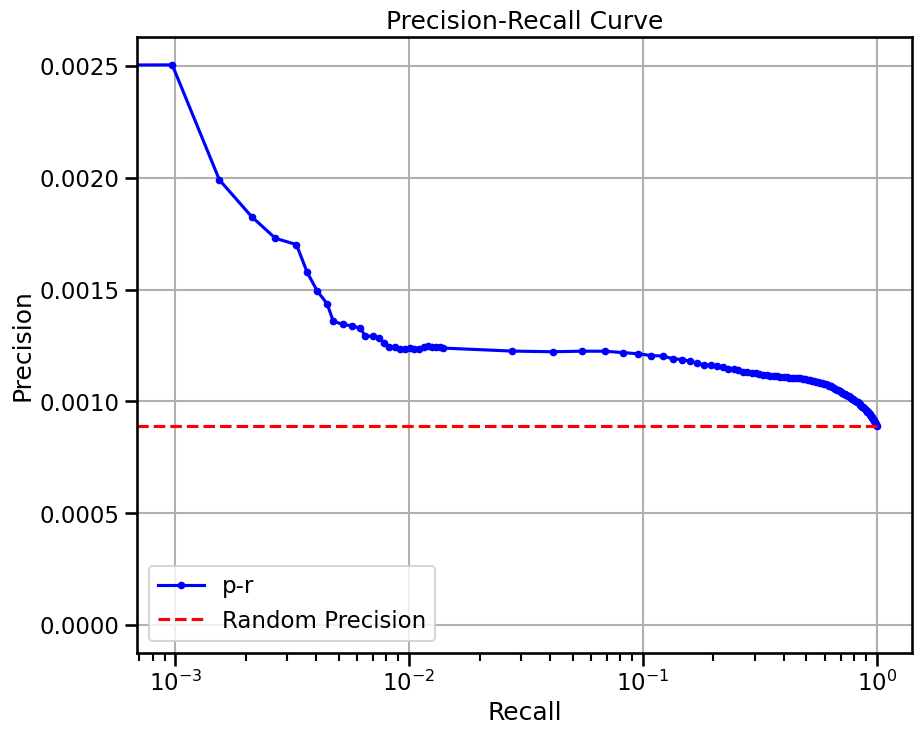


  0%|          | 0/64 [00:00<?, ?it/s]


  2%|▏         | 1/64 [00:02<02:13,  2.13s/it]


  3%|▎         | 2/64 [00:02<01:18,  1.27s/it]


  5%|▍         | 3/64 [00:03<01:00,  1.01it/s]


  6%|▋         | 4/64 [00:04<00:51,  1.17it/s]


  8%|▊         | 5/64 [00:04<00:46,  1.27it/s]


  9%|▉         | 6/64 [00:05<00:43,  1.33it/s]


 11%|█         | 7/64 [00:06<00:40,  1.39it/s]


 12%|█▎        | 8/64 [00:06<00:38,  1.44it/s]


 14%|█▍        | 9/64 [00:07<00:37,  1.47it/s]


 16%|█▌        | 10/64 [00:08<00:36,  1.48it/s]


 17%|█▋        | 11/64 [00:08<00:35,  1.50it/s]


 19%|█▉        | 12/64 [00:09<00:34,  1.50it/s]


 20%|██        | 13/64 [00:10<00:33,  1.51it/s]


 22%|██▏       | 14/64 [00:10<00:33,  1.51it/s]


 23%|██▎       | 15/64 [00:11<00:32,  1.51it/s]


 25%|██▌       | 16/64 [00:12<00:31,  1.52it/s]


 27%|██▋       | 17/64 [00:12<00:30,  1.52it/s]


 28%|██▊       | 18/64 [00:13<00:30,  1.51it/s]


 30%|██▉       | 19/64 [00:13<00:29,  1.51it/s]


 31%|███▏      | 20/64 [00:14<00:29,  1.49it/s]


 33%|███▎      | 21/64 [00:15<00:28,  1.51it/s]


 34%|███▍      | 22/64 [00:15<00:27,  1.51it/s]


 36%|███▌      | 23/64 [00:16<00:26,  1.52it/s]


 38%|███▊      | 24/64 [00:17<00:26,  1.52it/s]


 39%|███▉      | 25/64 [00:18<00:27,  1.42it/s]


 41%|████      | 26/64 [00:18<00:26,  1.45it/s]


 42%|████▏     | 27/64 [00:19<00:24,  1.48it/s]


 44%|████▍     | 28/64 [00:20<00:24,  1.49it/s]


 45%|████▌     | 29/64 [00:20<00:23,  1.50it/s]


 47%|████▋     | 30/64 [00:21<00:22,  1.51it/s]


 48%|████▊     | 31/64 [00:22<00:21,  1.52it/s]


 50%|█████     | 32/64 [00:22<00:21,  1.51it/s]


 52%|█████▏    | 33/64 [00:23<00:20,  1.52it/s]


 53%|█████▎    | 34/64 [00:23<00:19,  1.52it/s]


 55%|█████▍    | 35/64 [00:24<00:19,  1.53it/s]


 56%|█████▋    | 36/64 [00:25<00:18,  1.52it/s]


 58%|█████▊    | 37/64 [00:25<00:17,  1.52it/s]


 59%|█████▉    | 38/64 [00:26<00:17,  1.50it/s]


 61%|██████    | 39/64 [00:27<00:16,  1.52it/s]


 62%|██████▎   | 40/64 [00:27<00:15,  1.53it/s]


 64%|██████▍   | 41/64 [00:28<00:15,  1.53it/s]


 66%|██████▌   | 42/64 [00:29<00:14,  1.52it/s]


 67%|██████▋   | 43/64 [00:29<00:13,  1.52it/s]


 69%|██████▉   | 44/64 [00:30<00:13,  1.52it/s]


 70%|███████   | 45/64 [00:31<00:12,  1.53it/s]


 72%|███████▏  | 46/64 [00:31<00:11,  1.54it/s]


 73%|███████▎  | 47/64 [00:32<00:10,  1.55it/s]


 75%|███████▌  | 48/64 [00:33<00:10,  1.55it/s]


 77%|███████▋  | 49/64 [00:33<00:09,  1.55it/s]


 78%|███████▊  | 50/64 [00:34<00:09,  1.55it/s]


 80%|███████▉  | 51/64 [00:35<00:08,  1.55it/s]


 81%|████████▏ | 52/64 [00:35<00:07,  1.55it/s]


 83%|████████▎ | 53/64 [00:36<00:07,  1.55it/s]


 84%|████████▍ | 54/64 [00:36<00:06,  1.56it/s]


 86%|████████▌ | 55/64 [00:37<00:05,  1.56it/s]


 88%|████████▊ | 56/64 [00:38<00:05,  1.56it/s]


 89%|████████▉ | 57/64 [00:38<00:04,  1.56it/s]


 91%|█████████ | 58/64 [00:39<00:03,  1.56it/s]


 92%|█████████▏| 59/64 [00:40<00:03,  1.56it/s]


 94%|█████████▍| 60/64 [00:40<00:02,  1.56it/s]


 95%|█████████▌| 61/64 [00:41<00:01,  1.56it/s]


 97%|█████████▋| 62/64 [00:42<00:01,  1.56it/s]


 98%|█████████▊| 63/64 [00:42<00:00,  1.56it/s]


100%|██████████| 64/64 [00:43<00:00,  1.56it/s]


100%|██████████| 64/64 [00:43<00:00,  1.47it/s]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


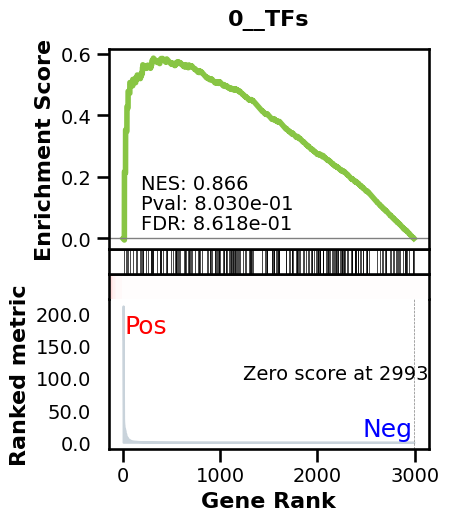

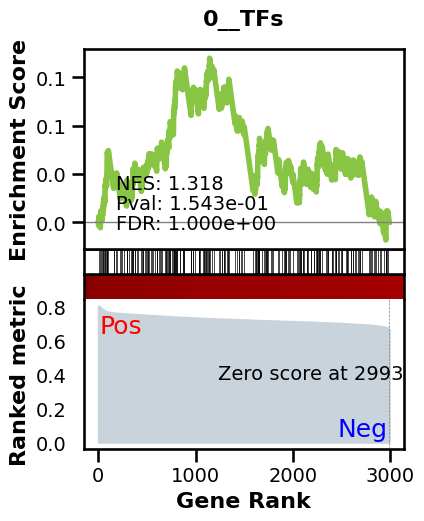

_________________________________________
TF specific enrichment


found some significant results for  18.181818181818183 % TFs

_________________________________________
loading GT,  omnipath


intersection of 2016 genes
intersection pct: 0.6733466933867736
precision:  0.0016101347946586042 
recall:  1.0 
random precision: 0.0016109338689983851



  0%|          | 0/128 [00:00<?, ?it/s]


 15%|█▍        | 19/128 [00:00<00:00, 183.21it/s]


 30%|██▉       | 38/128 [00:00<00:00, 183.12it/s]


 45%|████▍     | 57/128 [00:00<00:00, 183.04it/s]


 59%|█████▉    | 76/128 [00:00<00:00, 183.18it/s]


 74%|███████▍  | 95/128 [00:00<00:00, 183.15it/s]


 89%|████████▉ | 114/128 [00:00<00:00, 183.21it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:00<00:00, 182.97it/s]

Average Precision (AP):  0.001706961686980613
Area Under Precision-Recall Curve (AUPRC):  0.001706215841548547
EPR: 0.3786770660905835


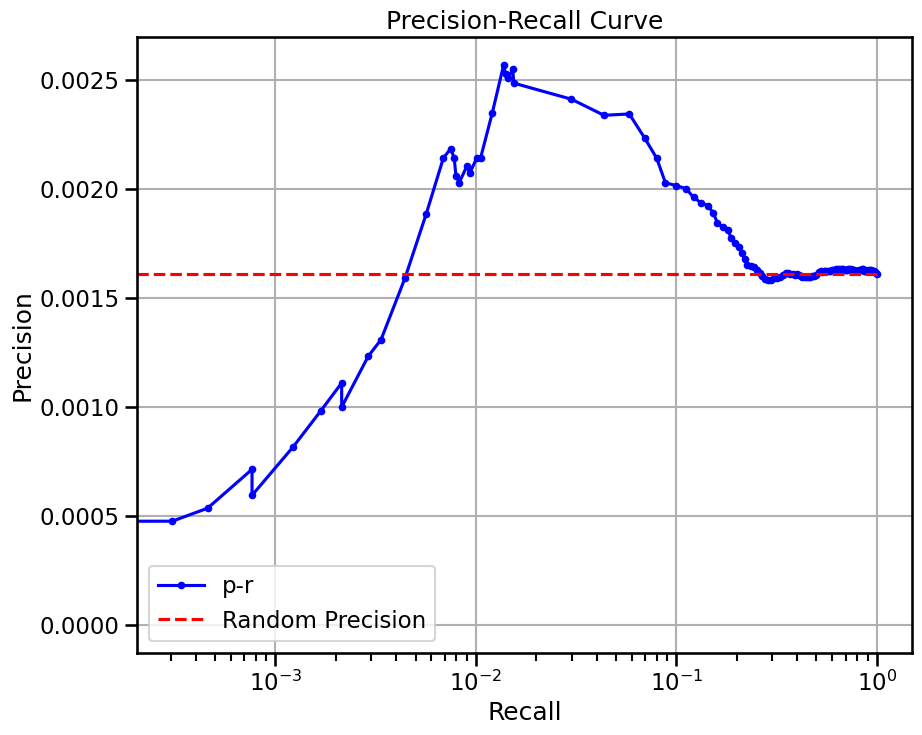

base enrichment


Top central genes: []


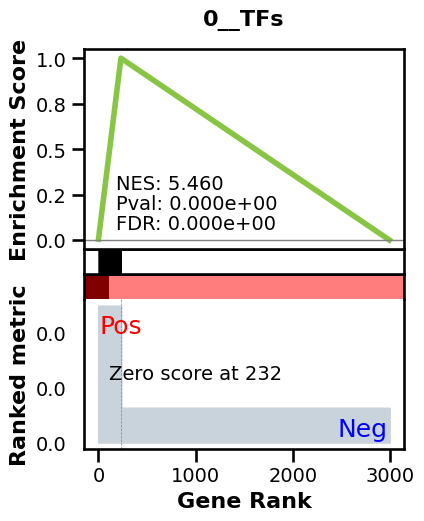

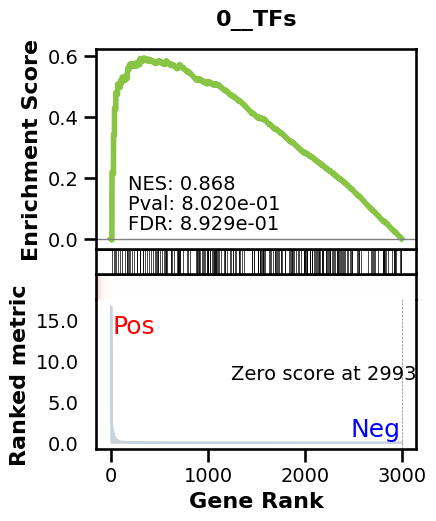

_________________________________________
TF specific enrichment


found some significant results for  9.090909090909092 % TFs

_________________________________________
loading GT,  omnipath


intersection of 2016 genes
intersection pct: 0.6733466933867736
precision:  0.010127897011699829 
recall:  0.6645782396088019 
random precision: 0.0016109338689983851



  0%|          | 0/128 [00:00<?, ?it/s]


 15%|█▍        | 19/128 [00:00<00:00, 180.65it/s]


 30%|██▉       | 38/128 [00:00<00:00, 180.77it/s]


 45%|████▍     | 57/128 [00:00<00:00, 180.73it/s]


 59%|█████▉    | 76/128 [00:00<00:00, 180.85it/s]


 74%|███████▍  | 95/128 [00:00<00:00, 180.80it/s]


 89%|████████▉ | 114/128 [00:00<00:00, 180.88it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:00<00:00, 180.73it/s]

Average Precision (AP):  0.00807405603593987
Area Under Precision-Recall Curve (AUPRC):  0.0076090242973365155
EPR: 9.751327485116486


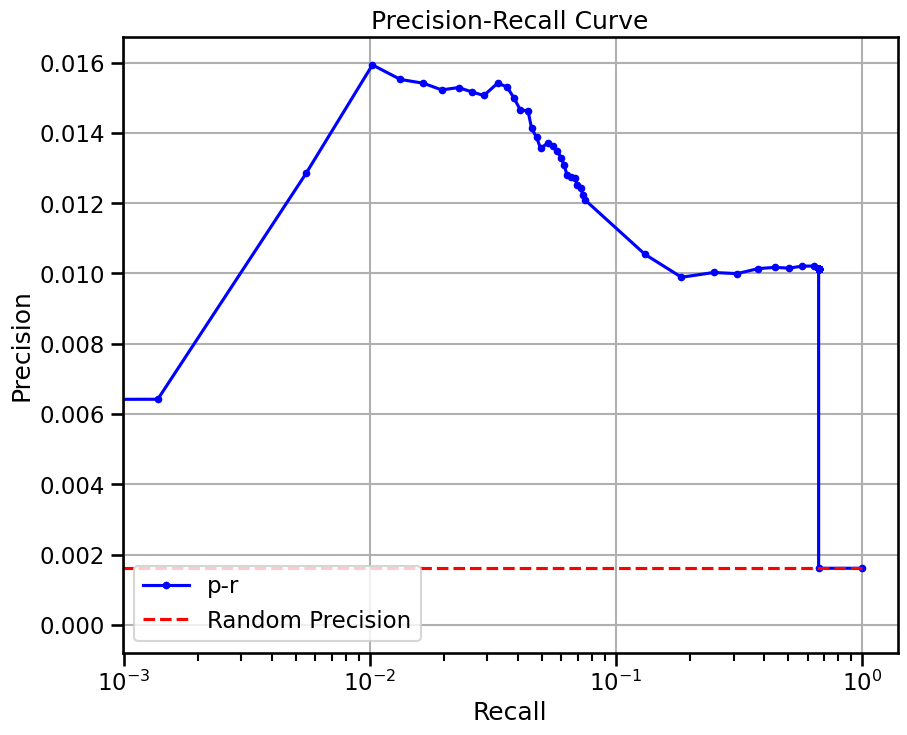

base enrichment


Top central genes: []
The DataFrame contains only the same values.


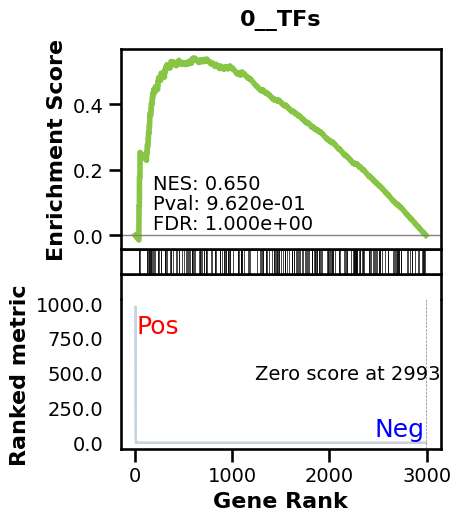

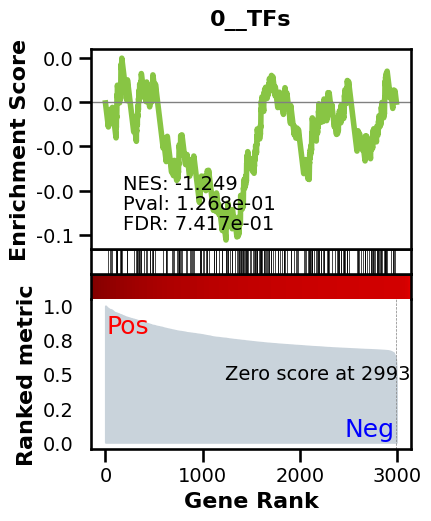

_________________________________________
TF specific enrichment


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


intersection of 2016 genes
intersection pct: 0.6733466933867736
precision:  0.0016101347946586042 
recall:  1.0 
random precision: 0.0016109338689983851



  0%|          | 0/128 [00:00<?, ?it/s]


 15%|█▍        | 19/128 [00:00<00:00, 181.13it/s]


 30%|██▉       | 38/128 [00:00<00:00, 181.14it/s]


 45%|████▍     | 57/128 [00:00<00:00, 181.03it/s]


 59%|█████▉    | 76/128 [00:00<00:00, 180.95it/s]


 74%|███████▍  | 95/128 [00:00<00:00, 180.94it/s]


 89%|████████▉ | 114/128 [00:00<00:00, 180.97it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:00<00:00, 180.79it/s]

Average Precision (AP):  0.0014258581223062345
Area Under Precision-Recall Curve (AUPRC):  0.0014241163410038636
EPR: 0.9484335147300893


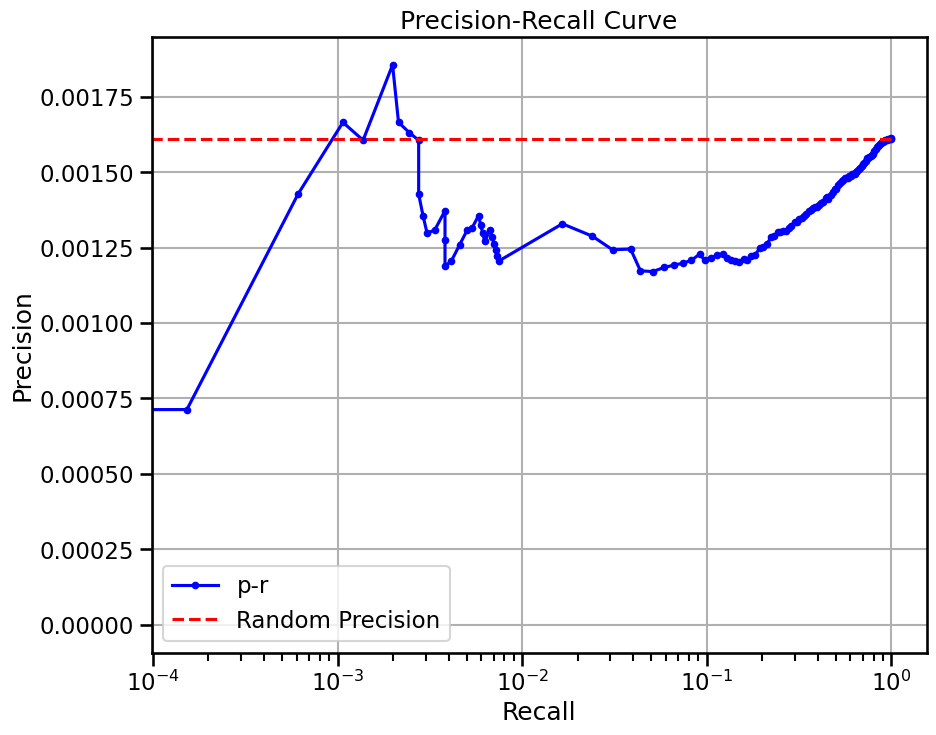

base enrichment


Top central genes: []


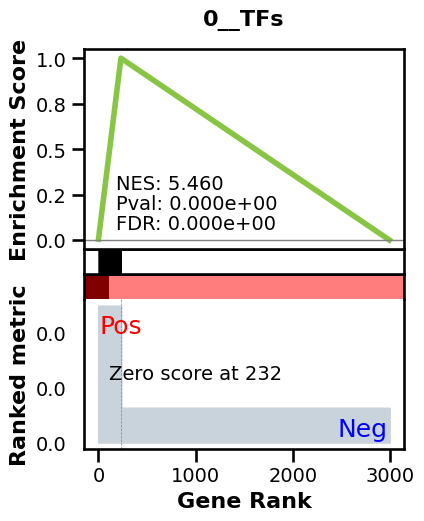

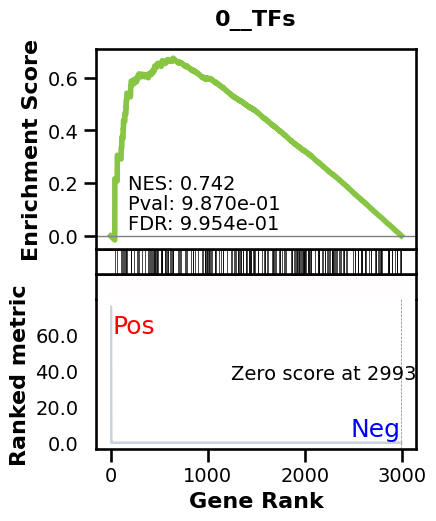

_________________________________________
TF specific enrichment


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


intersection of 2016 genes
intersection pct: 0.6733466933867736
precision:  0.010127897011699829 
recall:  0.6645782396088019 
random precision: 0.0016109338689983851



  0%|          | 0/128 [00:00<?, ?it/s]


 14%|█▍        | 18/128 [00:00<00:00, 179.08it/s]


 28%|██▊       | 36/128 [00:00<00:00, 179.35it/s]


 42%|████▏     | 54/128 [00:00<00:00, 179.32it/s]


 56%|█████▋    | 72/128 [00:00<00:00, 179.45it/s]


 70%|███████   | 90/128 [00:00<00:00, 179.55it/s]


 84%|████████▍ | 108/128 [00:00<00:00, 179.62it/s]


 98%|█████████▊| 126/128 [00:00<00:00, 176.34it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:00<00:00, 177.81it/s]

Average Precision (AP):  0.007121713566203383
Area Under Precision-Recall Curve (AUPRC):  0.006644424489401014
EPR: 6.762764085977235


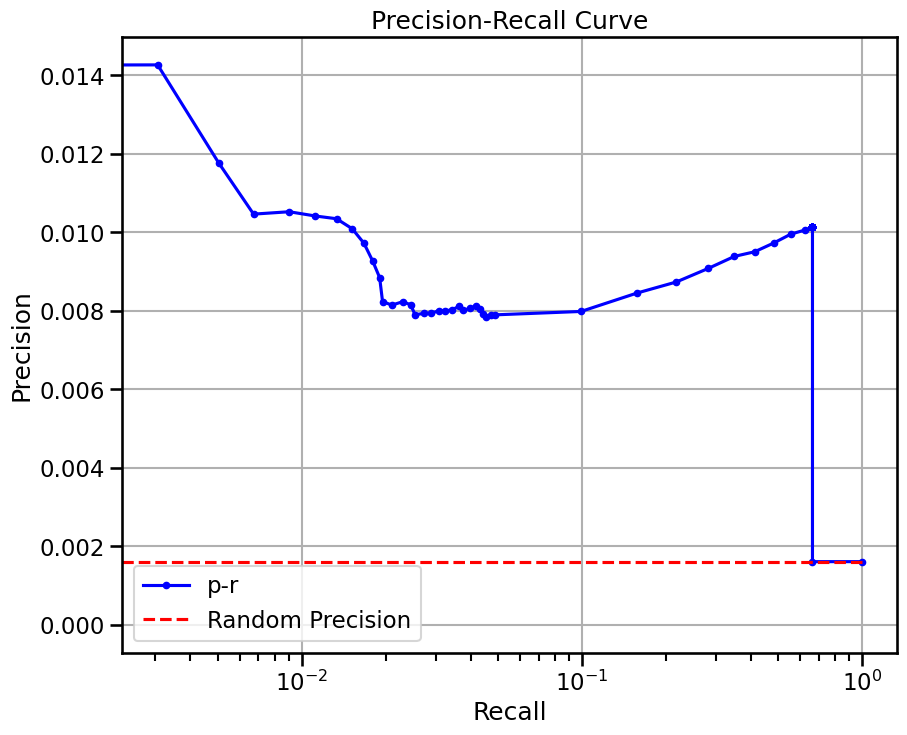

In [6]:
metrics = {}
clf_omni = None
shapes = []
for celltype in CELLTYPES:
    grn_inferer = GRNfer(model, adata[adata.X.sum(1) > 500],
                        how="random expr",
                        preprocess="softmax",
                        head_agg='mean',
                        filtration="none",
                        forward_mode="none",
                        num_genes=2200,
                        max_cells=MAXCELLS,
                        doplot=False,
                        batch_size=32,
                        )
    grn = grn_inferer(layer=list(range(model.nlayers))[:], cell_type=celltype)
    grn.var.index = make_index_unique(grn.var['symbol'].astype(str))
    metrics[celltype+'_scprint_full'] = BenGRN(grn).scprint_benchmark()
    del grn
    grn_inferer = GRNfer(model, adata[adata.X.sum(1) > 500],
                        how="most var across",
                        preprocess="softmax",
                        head_agg='none',
                        filtration="none",
                        forward_mode="none",
                        num_genes=NUM_GENES,
                        max_cells=1024,
                        drop_unexpressed=True,
                        doplot=False,
                        batch_size=16,
                        )
    grn = grn_inferer(layer=list(range(model.nlayers))[:], cell_type=celltype)
    grn.var.index = make_index_unique(grn.var['symbol'].astype(str))
    grn.varp['all'] = grn.varp['GRN']
    grn.varp['GRN'] = grn.varp['GRN'][:,:,:].mean(-1)
    metrics[celltype+'_scprint_mean'] = BenGRN(grn).scprint_benchmark()
    grn.varp['GRN'][~grn.var.isTF,:]=0
    metrics[celltype+'_scprint_tf_mean'] = BenGRN(grn).scprint_benchmark()
    if clf_omni == None:
        grn.varp['GRN'] = grn.varp['all']
        _, m, clf_omni = train_classifier(grn, C=1, train_size=0.6, class_weight={
                                        1: 200, 0: 1}, shuffle=True, max_iter=200, return_full=False)
        joblib.dump(clf_omni, 'clf_omni.pkl')
    grn.varp['GRN'] = grn.varp['all'][:,:,clf_omni.coef_[0] > 0].mean(-1)
    metrics[celltype+'_scprint_class'] = BenGRN(grn).scprint_benchmark()
    grn.varp['GRN'][~grn.var.isTF,:]=0
    metrics[celltype+'_scprint_tf_class'] = BenGRN(grn).scprint_benchmark()
    shapes.append(grn.shape[1])
    del grn

In [7]:
metrics

{'kidney distal convoluted tubule epithelial cell_scprint_full': {'TF_enr': True,
  'enriched_terms_Targets': ['celltype.gmt__Effector CD8+ T cells',
   'celltype.gmt__Naive CD8+ T cells',
   'celltype.gmt__Memory CD8+ T cells',
   'celltype.gmt__-T cells',
   'celltype.gmt__Myeloid Dendritic cells'],
  'significant_enriched_TFtargets': 62.5,
  'precision': 0.0008896322223674437,
  'recall': 1.0,
  'rand_precision': 0.0008897036558203398,
  'auprc': 0.0010112919661082434,
  'ap': 0.001011442546500521,
  'epr': 1.794288323583073},
 'kidney distal convoluted tubule epithelial cell_scprint_mean': {'enriched_terms_Regulators': ['celltype.gmt__Distal tubule cells',
   'celltype.gmt__Beta cells',
   'celltype.gmt__Cholangiocytes',
   'celltype.gmt__Loop of Henle cells',
   'celltype.gmt__Proximal tubule cells',
   'celltype.gmt__Ductal cells',
   'celltype.gmt__Gamma (PP) cells'],
  'TF_enr': True,
  'enriched_terms_Targets': ['celltype.gmt__Acinar cells',
   'celltype.gmt__Distal tubule cel

In [8]:
shapes

[5000, 5000, 5000, 3061, 5000, 5000, 5000, 3510, 4460, 2994]

In [9]:
False
True
True
False
True
False
True
True
True
True
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
True
False
False
False
True
False
False
False
True
True
True
True
False
True
False
False
False
False
False
False
False
False
False
True
False

True

In [10]:
print('new')

new


In [11]:
import pandas as pd

In [12]:
res = []
for k, v in metrics.items():
    res.append([k.split('_')[-1], k.split('_')[0], v['epr'], v['auprc'], v['rand_precision'], v['significant_enriched_TFtargets'], v.get('TF_enr', False), 'tf_' in k])

df = pd.DataFrame(res, columns=['tools','name','EPR', 'AUPRC', 'RAND', 'TF_targ', 'TF_enr', 'TF_only'])
df

,tools,name,EPR,AUPRC,RAND,TF_targ,TF_enr,TF_only
0,full,kidney distal convoluted tubule epithelial cell,1.794288,0.001011,0.000890,62.500000,True,False
1,mean,kidney distal convoluted tubule epithelial cell,2.662047,0.000876,0.000826,11.764706,True,False
2,mean,kidney distal convoluted tubule epithelial cell,4.246105,0.001663,0.000826,17.647059,True,True
3,class,kidney distal convoluted tubule epithelial cell,4.979990,0.000994,0.000826,2.941176,True,False
4,class,kidney distal convoluted tubule epithelial cell,12.416586,0.002227,0.000826,8.823529,True,True
5,full,kidney loop of Henle thick ascending limb epit...,1.728841,0.001023,0.000890,67.857143,True,False
6,mean,kidney loop of Henle thick ascending limb epit...,1.721485,0.000883,0.000834,11.538462,True,False
7,mean,kidney loop of Henle thick ascending limb epit...,10.351980,0.002635,0.000834,7.692308,True,True
8,class,kidney loop of Henle thick ascending limb epit...,5.319020,0.000959,0.000834,7.692308,False,False
9,class,kidney loop of Henle thick ascending limb epit...,18.579117,0.003498,0.000834,3.846154,True,True
